# Import Libraries

In [86]:
import yfinance as yf
import pandas as pd
import numpy as np
from plotnine import ggplot, aes, geom_point, theme_bw
import matplotlib.pyplot as plt
from plotnine import ggplot, aes, geom_line, labs, theme_light
from scipy.optimize import minimize
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Import Data

In [87]:
df = pd.read_csv("/content/drive/My Drive/REIT_Dataset.csv")
df2 = pd.read_csv("/content/drive/My Drive/REIT_Dataset2.csv")

<ipython-input-87-dd9e5c3ac4e8>:1: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,26

In [88]:
df.head()

0              1                      2                   3  \
0       NaN  PLD US Equity                    NaN                 NaN   
1       NaN     Last Price  Funds from Operations  Price to FFO Ratio   
2     Dates        PX_LAST                 CF_FFO     PX_TO_FFO_RATIO   
3  1/3/2000        19.8125                    NaN                 NaN   
4  1/4/2000           19.5                    NaN                 NaN   

                                            4           5       6  \
0                                         NaN         NaN     NaN   
1  Adjusted Funds from Operations - Cash Flow  RSI 30 Day  EBITDA   
2                                     CF_AFFO     RSI_30D  EBITDA   
3                                         NaN     50.6613  36.158   
4                                         NaN     47.5994  36.158   

                       7                   8                           9  \
0                    NaN                 NaN                         NaN   
1  Historical Market Cap     Net Debt/EBITDA  Total Debt to Total Equity   
2  HISTORICAL_MARKET_CAP  NET_DEBT_TO_EBITDA         TOT_DEBT_TO_TOT_EQY   
3                1697.34              6.2558                     56.1431   
4                1697.34              6.2558                     56.1431   

                           10            11  \
0                         NaN           NaN   
1  Current Shares Outstanding  Total Equity   
2                  EQY_SH_OUT  TOTAL_EQUITY   
3                      86.577      2262.142   
4                      86.577      2262.142   

                                   12                       13  \
0                                 NaN                      NaN   
1  Price to Net Asset Value per Share  Interest Coverage Ratio   
2         PRICE_TO_NET_ASSET_VALUE_PS       INT_COVERAGE_RATIO   
3                                 NaN                      NaN   
4                                 NaN                      NaN   

                             14                    15  \
0                           NaN                   NaN   
1  EBITDA Growth Year over Year  Total Debt to EBITDA   
2                 EBITDA_GROWTH    TOT_DEBT_TO_EBITDA   
3                       -50.027                6.4244   
4                       -50.027                6.4244   

                         16                          17  \
0                       NaN                         NaN   
1  Total Debt 1 Year Growth  EBIT Growth Year over Year   
2  TOTAL_DEBT_1_YEAR_GROWTH             OPER_INC_GROWTH   
3                   -7.1743                    -67.3334   
4                   -7.1743                    -67.3334   

                         18                  19             20  \
0                       NaN                 NaN  AMT US Equity   
1  Net Income - 1 Yr Growth     Net Asset Value     Last Price   
2            NET_INC_GROWTH  BS_NET_ASSET_VALUE        PX_LAST   
3                   87.4951                 NaN          #REF!   
4                   87.4951                 NaN             29   

                      21                  22  \
0                    NaN                 NaN   
1  Funds from Operations  Price to FFO Ratio   
2                 CF_FFO     PX_TO_FFO_RATIO   
3                    NaN                 NaN   
4                    NaN                 NaN   

                                           23          24      25  \
0                                         NaN         NaN     NaN   
1  Adjusted Funds from Operations - Cash Flow  RSI 30 Day  EBITDA   
2                                     CF_AFFO     RSI_30D  EBITDA   
3                                         NaN     63.3079   4.093   
4                                         NaN     62.2717   4.093   

                      26                  27                          28  \
0                    NaN                 NaN                         NaN   
1  Historical Market Cap     Net Debt/EBITDA  Total Debt to Total Eq

In [89]:
df2.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,865,866,867,868,869,870,871,872,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,929,930,931,932,933,934,935,936,945,946,947,948,949,950,951,952,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,1001,1002,1003,1004,1005,1006,1007,1008,1033,1034,1035,1036,1037,1038,1039,1040,1041,1042,1043,1044,1045,1046,1047,1048,1057,1058,1059,1060,1061,1062,1063,1064,1073,1074,1075,1076,1077,1078,1079,1080,1081,1082,1083,1084,1085,1086,1087,1088,1089,1090,1091,1092,1093,1094,1095,1096,1097,1098,1099,1100,1101,1102,1103,1104,1113,1114,1115,1116,1117,1118,1119,1120,1121,1122,1123,1124,1125,1126,1127,1128,1129,1130,1131,1132,1133,1134,1135,1136,1137,1138,1139,1140,1141,1142,1143,1144,1145,1146,1147,1148,1149,1150,1151,1152,1153,1154,1155,1156,1157,1158,1159,1160,1161,1162,1163,1164,1165,1166,1167,1168,1169,1170,1171,11

In [90]:
df1 = df.iloc[2:]
df1 = df1.reset_index(drop=True)
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6356 entries, 0 to 6355
Columns: 2984 entries, 0 to 3686
dtypes: object(2984)
memory usage: 144.7+ MB


In [91]:
df2 = df2.iloc[2:]
df2 = df2.reset_index(drop=True)
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6355 entries, 0 to 6354
Columns: 1257 entries, 0 to 1552
dtypes: object(1257)
memory usage: 60.9+ MB


# Build DF with Tickers and Daily Prices

Builds ticker column indexes

In [92]:
start_date = '2000-01-04'
end_date = '2024-05-09'
Rebalance_Frequency = "Q"

pd.options.display.max_rows = None
pd.options.display.max_columns = None

tickers = df.iloc[[0]]
tickers = tickers.dropna(axis=1)
tickers = tickers.reset_index(drop=True)
tickers = tickers.apply(lambda col: col.str.split().str[0])
tickers.columns = range(len(tickers.columns))
dates_column = df.iloc[3:, 0]
tickers

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156
0,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW


Builds DF with daily prices for each ticker

In [93]:
price_columns = df1.iloc[0] == "PX_LAST"
price_columns = price_columns[price_columns].index

price_df = df1.loc[:, price_columns]
price_df.columns = tickers.iloc[0]
price_df = price_df.iloc[1:]
price_df.index = dates_column
price_df.index = pd.to_datetime(price_df.index)
price_df = price_df.loc[start_date:end_date]
price_df.index = pd.to_datetime(price_df.index, format='%Y-%m-%d')
price_df_numeric = price_df.apply(pd.to_numeric, errors='coerce')
price_df.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,19.5,29,NaN,15.3125,20.089,22.75,9.9259,NaN,30.5,NaN,NaN,32.094,20.9375,8.7708,27.523,17.75,NaN,30.5625,3.5031,32.94,22.625,31.875,NaN,8.7898,8.1795,11.1875,16.0921,6.0156,57.5625,NaN,26.125,20,NaN,30.188,NaN,18.75,12.625,17.8125,9.9375,NaN,NaN,NaN,26.5,25.6252,NaN,13.5625,NaN,NaN,23.5116,NaN,NaN,NaN,NaN,8.5582,10.8675,20.8125,NaN,59.3054,NaN,NaN,NaN,NaN,34.5459,NaN,22.5393,13.25,129.3751,NaN,5.1563,NaN,18.8281,22.375,14.875,7.8125,NaN,8.6834,NaN,NaN,NaN,NaN,NaN,NaN,35.6965,4.6109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.375,10.9375,8.375,47.1665,14.625,NaN,NaN,NaN,NaN,14.375,4.618,78.625,8.1875,75.9375,NaN,17.8744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.9375,11.1694,NaN,NaN,NaN,4.0417,NaN,NaN,6.4319,NaN,NaN,NaN,NaN,NaN,4.3666,NaN,NaN,NaN,NaN,NaN,15.75,11.2037,NaN,NaN,NaN,NaN,NaN,NaN,134.9277,NaN,NaN,NaN,NaN,2.375,NaN,6.3805
2000-01-05,19.25,29.875,NaN,15.75,20.257,22.938,9.8654,NaN,30.0625,NaN,NaN,32.396,21.375,8.4853,28.981,17,NaN,30,3.4483,32.81,22.375,31.875,NaN,8.9633,7.8743,11.25,15.9085,6.0313,57.375,NaN,26.1875,19.875,NaN,30.438,NaN,18.688,12.5625,17.5625,10.375,NaN,NaN,NaN,27,25.8461,NaN,13.3125,NaN,NaN,24.1281,NaN,NaN,NaN,NaN,8.8143,11.0666,20.875,NaN,58.4236,NaN,NaN,NaN,NaN,35.6871,NaN,22.3404,13.5625,127.5001,NaN,5.25,NaN,18.0825,21.75,15.5,7.8125,NaN,9.3514,NaN,NaN,NaN,NaN,NaN,NaN,36.4402,4.7306,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.875,11,8.4375,47.6984,14.6875,NaN,NaN,NaN,NaN,14.625,4.6641,78.625,8.1875,76.25,NaN,17.6998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,11.1694,NaN,NaN,NaN,4.0417,NaN,NaN,6.4319,NaN,NaN,NaN,NaN,NaN,4.3051,NaN,NaN,NaN,NaN,NaN,15.625,11.5432,NaN,NaN,NaN,NaN,NaN,NaN,140.2538,NaN,NaN,NaN,NaN,2.3125,NaN,6.3805
2000-01-06,19.625,29.563,NaN,16.5625,20.762,23.813,9.9864,NaN,29,NaN,NaN,33.484,21.5938,8.406,30.3367,16.938,NaN,29.4375,3.5031,33.13,22.75,32.25,NaN,9.5994,7.9964,11.5833,15.9085,6.0938,58.25,NaN,26.6875,20,NaN,31,NaN,19.25,13.3125,18.25,10.1875,NaN,NaN,NaN,27.5625,25.5527,NaN,13.5625,NaN,NaN,24.4363,NaN,NaN,NaN,NaN,8.826,11.4649,21.125,NaN,58.9747,NaN,NaN,NaN,NaN,36.3711,NaN,22.7382,14.0625,127.5001,NaN,5.4219,NaN,18.9213,23.0625,15.5625,7.8125,NaN,9.3514,NaN,NaN,NaN,NaN,NaN,NaN,35.9444,4.7306,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.6875,11,8.875,48.2304,14.625,NaN,NaN,NaN,NaN,14.5625,4.7565,78.563,8.375,75.9375,NaN,17.9909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.9375,11.1694,NaN,NaN,NaN,4.0208,NaN,NaN,6.4319,NaN,NaN,NaN,NaN,NaN,4.3666,NaN,NaN,NaN,NaN,NaN,15.9375,12.2223,NaN,NaN,NaN,NaN,NaN,NaN,156.2321,NaN,NaN,NaN,NaN,2.25,NaN,6.4965
2000-01-07,20,31.188,NaN,16.8125,21.66,24.125,10.168,NaN,30.5,NaN,NaN,34.33,22,8.3742,29.3391,18.375,NaN,30,3.4483,34.25,22.9375,32.875,NaN,9.4259,8.1184,11.7708,15.9085,6.1563,59.625,NaN,27.1875,20.6875,NaN,32.125,NaN,20.25,12.4375,18.6875,10.375,NaN,NaN,NaN,27.9375,25.6252,NaN,13.6875,NaN,NaN,24.6124,NaN,NaN,NaN,NaN,8.7794,11.7209,21.5,NaN,60.4078,NaN,NaN,NaN,NaN,36.8282,NaN,23.5337,14.4375,131.2501,NaN,5.5625,NaN,19.9466,23.0625,15.8125,7.9375,NaN,9.7967,NaN,NaN,NaN,NaN,NaN,NaN,36.1923,4.7306,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.875,11,8.75,51.7767,15.125,NaN,NaN,NaN,NaN,14.5625,4.8104,79.1

# Daily Returns DF

In [94]:
daily_returns = price_df_numeric.diff() / price_df_numeric.shift(1)
daily_returns.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,-0.012821,0.030172,NaN,0.028571,0.008363,0.008264,-0.006095,NaN,-0.014344,NaN,NaN,0.009410,0.020896,-0.032551,0.052974,-0.042254,NaN,-0.018405,-0.015643,-0.003947,-0.011050,0.000000,NaN,0.019739,-0.037313,0.005587,-0.011409,0.002610,-0.003257,NaN,0.002392,-0.006250,NaN,0.008281,NaN,-0.003307,-0.004950,-0.014035,0.044025,NaN,NaN,NaN,0.018868,0.008620,NaN,-0.018433,NaN,NaN,0.026221,NaN,NaN,NaN,NaN,0.029925,0.018321,0.003003,NaN,-0.014869,NaN,NaN,NaN,NaN,0.033034,NaN,-0.008825,0.023585,-0.014493,NaN,0.018172,NaN,-0.039600,-0.027933,0.042017,0.000,NaN,0.076928,NaN,NaN,NaN,NaN,NaN,NaN,0.020834,0.025960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.019704,0.005714,0.007463,0.011277,0.004274,NaN,NaN,NaN,NaN,0.017391,0.009983,0.000000,0.000000,0.004115,NaN,-0.009768,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004184,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,-0.014084,NaN,NaN,NaN,NaN,NaN,-0.007937,0.030302,NaN,NaN,NaN,NaN,NaN,NaN,0.039474,NaN,NaN,NaN,NaN,-0.026316,NaN,0.000000
2000-01-06,0.019481,-0.010444,NaN,0.051587,0.024930,0.038146,0.012265,NaN,-0.035343,NaN,NaN,0.033584,0.010236,-0.009346,0.046779,-0.003647,NaN,-0.018750,0.015892,0.009753,0.016760,0.011765,NaN,0.070967,0.015506,0.029627,0.000000,0.010363,0.015251,NaN,0.019093,0.006289,NaN,0.018464,NaN,0.030073,0.059701,0.039146,-0.018072,NaN,NaN,NaN,0.020833,-0.011352,NaN,0.018779,NaN,NaN,0.012773,NaN,NaN,NaN,NaN,0.001327,0.035991,0.011976,NaN,0.009433,NaN,NaN,NaN,NaN,0.019167,NaN,0.017806,0.036866,0.000000,NaN,0.032743,NaN,0.046387,0.060345,0.004032,0.000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,-0.013606,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.032663,0.000000,0.051852,0.011153,-0.004255,NaN,NaN,NaN,NaN,-0.004274,0.019811,-0.000789,0.022901,-0.004098,NaN,0.016447,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.062500,0.000000,NaN,NaN,NaN,-0.005171,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.014285,NaN,NaN,NaN,NaN,NaN,0.020000,0.058831,NaN,NaN,NaN,NaN,NaN,NaN,0.113924,NaN,NaN,NaN,NaN,-0.027027,NaN,0.018180
2000-01-07,0.019108,0.054967,NaN,0.015094,0.043252,0.013102,0.018185,NaN,0.051724,NaN,NaN,0.025266,0.018811,-0.003783,-0.032884,0.084839,NaN,0.019108,-0.015643,0.033806,0.008242,0.019380,NaN,-0.018074,0.015257,0.016187,0.000000,0.010256,0.023605,NaN,0.018735,0.034375,NaN,0.036290,NaN,0.051948,-0.065728,0.023973,0.018405,NaN,NaN,NaN,0.013605,0.002837,NaN,0.009217,NaN,NaN,0.007206,NaN,NaN,NaN,NaN,-0.005280,0.022329,0.017751,NaN,0.024300,NaN,NaN,NaN,NaN,0.012568,NaN,0.034985,0.026667,0.029412,NaN,0.025932,NaN,

# Shares Outstanding DF

In [98]:
Shares_Outstanding_Columns = df1.iloc[0] == "EQY_SH_OUT"
Shares_Outstanding_Columns = Shares_Outstanding_Columns[Shares_Outstanding_Columns].index

Shares_Outstanding_DF = df1.loc[:, Shares_Outstanding_Columns]
Shares_Outstanding_DF.columns = tickers.iloc[0]
Shares_Outstanding_DF = Shares_Outstanding_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
Shares_Outstanding_DF.index = dates_column
Shares_Outstanding_DF.index = pd.to_datetime(Shares_Outstanding_DF.index)
Shares_Outstanding_DF = Shares_Outstanding_DF.loc[start_date:end_date]

Shares_Outstanding_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,86.577,144.501,NaN,28.413,177.275,129.354,53.644,NaN,144.915,NaN,NaN,67.382,244.774,139.562,491.57,21.102,NaN,13.612,67.959,18.054,18.941,17.433,NaN,110.907,234.167,182.16,25.684,103.132,70.401,NaN,40.213,25.489,NaN,67.903,NaN,40.348,19.887,15.944,30.407,NaN,NaN,NaN,38.043,37.37,NaN,4.365,NaN,NaN,89.3,NaN,NaN,NaN,NaN,110.401,102.996,27.894,NaN,12.885,NaN,NaN,NaN,NaN,28.952,NaN,22.819,15.091,0.809,NaN,31.401,NaN,33.078,62.053,24.365,16.802,NaN,19.085,NaN,NaN,NaN,NaN,NaN,NaN,32.977,27.106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58.391,13.567,27.368,13.747,35.721,NaN,NaN,NaN,NaN,13.199,73.588,5.001,7.252,2.114,NaN,56.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.963,3.417,NaN,NaN,NaN,19.128,NaN,NaN,8.842,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.459,NaN,NaN,NaN,NaN,NaN,NaN,1.627
2000-01-05,86.577,144.501,NaN,28.413,177.275,129.354,53.644,NaN,144.915,NaN,NaN,67.382,244.774,139.562,491.57,21.102,NaN,13.612,67.959,18.054,18.941,17.433,NaN,110.907,234.167,182.16,25.684,103.132,70.401,NaN,40.213,25.489,NaN,67.903,NaN,40.348,19.887,15.944,30.407,NaN,NaN,NaN,38.043,37.37,NaN,4.365,NaN,NaN,89.3,NaN,NaN,NaN,NaN,110.401,102.996,27.894,NaN,12.885,NaN,NaN,NaN,NaN,28.952,NaN,22.819,15.091,0.809,NaN,31.401,NaN,33.078,62.053,24.365,16.802,NaN,19.085,NaN,NaN,NaN,NaN,NaN,NaN,32.977,27.106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58.391,13.567,27.368,13.747,35.721,NaN,NaN,NaN,NaN,13.199,73.588,5.001,7.252,2.114,NaN,56.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.963,3.417,NaN,NaN,NaN,19.128,NaN,NaN,8.842,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.459,NaN,NaN,NaN,NaN,NaN,NaN,1.627
2000-01-06,86.577,144.501,NaN,28.413,177.275,129.354,53.644,NaN,144.915,NaN,NaN,67.382,244.774,139.562,491.57,21.102,NaN,13.612,67.959,18.054,18.941,17.433,NaN,110.907,234.167,182.16,25.684,103.132,70.401,NaN,40.213,25.489,NaN,67.903,NaN,40.348,19.887,15.944,30.407,NaN,NaN,NaN,38.043,37.37,NaN,4.365,NaN,NaN,89.3,NaN,NaN,NaN,NaN,110.401,102.996,27.894,NaN,12.885,NaN,NaN,NaN,NaN,28.952,NaN,22.819,15.091,0.809,NaN,31.401,NaN,33.078,62.053,24.365,16.802,NaN,19.085,NaN,NaN,NaN,NaN,NaN,NaN,32.977,27.106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58.391,13.567,27.368,13.747,35.721,NaN,NaN,NaN,NaN,13.199,73.588,5.001,7.252,2.114,NaN,56.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.963,3.417,NaN,NaN,NaN,19.128,NaN,NaN,8.842,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.459,NaN,NaN,NaN,NaN,NaN,NaN,1.627
2000-01-07,86.577,144.501,NaN,28.413,177.275,129.354,53.644,NaN,144.915,NaN,NaN,67.382,244.774,139.562,491.57,21.102,NaN,13.612,67.959,18.054,18.941,17.433,NaN,110.907,234.167,182.16,25.684,103.132,70.401,NaN,40.213,25.489,NaN,67.903,NaN,40.348,19.887,15.944,30.407,NaN,NaN,NaN,38.043,37.37,NaN,4.365,NaN,NaN,89.3,NaN,NaN,NaN,NaN,110.401,102.996,27.894,NaN,12.885,NaN,NaN,NaN,NaN,28.952,NaN,22.819,15.091,0.809,NaN,31.401,NaN,33.078,62.053,24.365,16.802,NaN,19.085,NaN,NaN,NaN,NaN,NaN,NaN,32.977,27.106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58.391,13.567,27.368,13.747,35.721,NaN,NaN,NaN,NaN,13.199,73.588,5.001,7.252,2.114,NaN,56.5,NaN,NaN,NaN,NaN,

In [99]:
quarterly_Shares_Outstanding_DF = Shares_Outstanding_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_Shares_Outstanding_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,85.289,146.233,None,28.532,178.029,125.412,53.644,None,148.544,None,None,67.998,254.902,213.981,491.57,32.402,None,13.746,67.989,18.049,17.616,17.459,None,111.042,228.843,182.387,25.684,91.252,71.567,None,39.625,56.924,None,67.91,None,40.419,19.877,15.556,30.256,None,None,None,38.153,37.665,None,4.365,None,None,89.704,None,None,None,None,109.796,102.842,27.808,None,12.876,None,None,None,None,28.972,None,22.844,14.936,0.809,None,31.507,None,32.934,60.919,24.383,17.646,None,19.305,None,None,None,None,None,None,32.977,26.849,None,None,None,None,None,None,None,None,None,58.447,12.812,27.036,13.607,35.721,None,None,None,None,13.334,73.986,5.174,7.313,2.199,None,56.45,None,None,None,None,None,None,None,None,None,None,None,None,8.991,3.435,None,None,None,19.077,None,None,8.842,None,None,None,None,None,None,None,None,None,None,None,36.373,26.001,None,None,None,None,None,None,0.46,None,None,None,None,2.562,None,1.239
2000-06-30,83.849,147.538,None,28.577,178.504,125.294,53.428,None,154.327,None,None,68.216,255.892,213.981,569.199,32.629,None,14.293,68.419,18.096,17.649,17.498,None,111.501,225.338,182.576,25.26,89.168,71.567,None,38.194,56.526,None,67.954,None,39.342,20.128,15.623,30.316,None,None,None,38.735,37.709,None,4.399,None,None,89.917,None,None,None,None,109.597,102.212,26.223,None,12.999,None,None,None,None,28.647,None,22.855,15.036,0.78,None,31.507,None,31.564,62.098,24.384,18.509,None,19.205,None,None,None,None,None,None,32.984,26.401,None,None,None,None,None,None,None,None,None,58.706,12.778,26.053,13.645,35.734,None,None,None,None,13.469,73.985,5.001,7.339,2.199,None,56.463,None,None,None,None,None,None,None,None,None,None,None,None,8.983,3.446,None,None,None,17.93,None,None,8.843,None,None,None,None,None,None,None,None,None,None,None,35.708,26.001,None,None,None,None,None,None,0.46,None,None,None,None,2.449,None,1.627
2000-09-30,84.089,168.332,None,28.617,178.587,124.305,53.314,None,196.085,None,None,68.72,262.36,215.669,522.185,34.201,None,14.396,68.415,18.367,17.208,17.501,None,111.849,225.758,183.701,33.705,88.076,74.946,None,38.235,56.893,None,68.027,None,39.436,20.115,15.631,30.355,None,None,None,38.951,37.771,None,4.395,None,None,89.941,None,None,None,None,108.995,101.925,26.455,None,13.033,None,None,None,None,28.428,None,23.001,14.679,0.764,None,31.507,None,34.019,62.192,24.384,18.711,None,19.179,None,None,None,None,None,None,32.987,26.244,None,None,None,None,None,None,None,None,None,58.878,12.68,26.048,13.715,35.734,None,None,None,None,13.6,74.455,5.001,7.352,2.245,None,56.464,None,None,None,None,None,None,None,None,None,None,None,None,8.98,3.456,None,None,None,17.442,None,None,8.843,None,None,None,None,None,None,None,None,None,None,None,35.704,25.916,None,None,None,None,None,None,0.46,None,None,None,None,2.171,None,1.627
2000-12-31,84.149,168.405,None,28.693,176.701,124.257,53.127,None,198.245,None,None,69.022,263.15,216.657,520.035,40.548,None,15.537,68.418,18.655,17.125,17.502,None,111.525,226.199,189.17,33.727,83.504,75.387,None,38.255,56.929,None,69.318,None,39.475,20.025,15.657,30.396,None,None,None,38.638,37.855,None,4.395,None,None,90.18,None,None,None,None,108.56,101.926,26.

# SIZE FACTOR

In [95]:
market_cap_columns = df1.iloc[0] == "HISTORICAL_MARKET_CAP"
market_cap_columns = market_cap_columns[market_cap_columns].index

market_cap_df = df1.loc[:, market_cap_columns]
market_cap_df.columns = tickers.iloc[0]
market_cap_df = market_cap_df.iloc[1:]
dates_column = df1.iloc[1:, 0]
market_cap_df.index = dates_column
market_cap_df.index = pd.to_datetime(market_cap_df.index)
market_cap_df = market_cap_df.loc[start_date:end_date]

market_cap_df.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,1697.34,987.0113,NaN,431.5465,3972.8247,3033.2512,553.2038,NaN,NaN,NaN,NaN,2276.8709,5440.5644,1452.3457,NaN,728.9944,NaN,437.2946,284.7039,613.666,398.562,561.9616,NaN,1014.5673,1843.875,2059.4645,433.8394,554.6411,5363.1607,NaN,1099.5938,1138.48,NaN,2113.6989,NaN,760.378,252.1941,287.786,300.6684,NaN,NaN,NaN,1046.8229,996.3799,NaN,62.2012,NaN,NaN,2805.92,NaN,NaN,NaN,NaN,1324.1007,1227.6764,622.204,NaN,1091.939,NaN,NaN,NaN,NaN,1292.8755,NaN,526.002,196.9685,121.415,NaN,163.4477,NaN,766.0625,1439.2114,362.6971,134.5507,NaN,157.9607,NaN,NaN,NaN,NaN,NaN,NaN,1187.172,118.9735,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1523.2489,NaN,228.1162,1434.1219,535.815,NaN,NaN,NaN,NaN,187.5094,2916.0268,408.746,60.3323,NaN,NaN,1076.0781,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,131.4934,38.74,NaN,NaN,NaN,81.0773,NaN,NaN,57.32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,595.6079,321.7686,NaN,NaN,NaN,NaN,NaN,NaN,66.1871,NaN,NaN,NaN,NaN,NaN,NaN,10.6644
2000-01-05,1697.34,987.0113,NaN,431.5465,3972.8247,3033.2512,553.2038,NaN,NaN,NaN,NaN,2276.8709,5440.5644,1452.3457,NaN,728.9944,NaN,437.2946,284.7039,613.666,398.562,561.9616,NaN,1014.5673,1843.875,2059.4645,433.8394,554.6411,5363.1607,NaN,1099.5938,1138.48,NaN,2113.6989,NaN,760.378,252.1941,287.786,300.6684,NaN,NaN,NaN,1046.8229,996.3799,NaN,62.2012,NaN,NaN,2805.92,NaN,NaN,NaN,NaN,1324.1007,1227.6764,622.204,NaN,1091.939,NaN,NaN,NaN,NaN,1292.8755,NaN,526.002,196.9685,121.415,NaN,163.4477,NaN,766.0625,1439.2114,362.6971,134.5507,NaN,157.9607,NaN,NaN,NaN,NaN,NaN,NaN,1187.172,118.9735,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1523.2489,NaN,228.1162,1434.1219,535.815,NaN,NaN,NaN,NaN,187.5094,2916.0268,408.746,60.3323,NaN,NaN,1076.0781,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,131.4934,38.74,NaN,NaN,NaN,81.0773,NaN,NaN,57.32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,595.6079,321.7686,NaN,NaN,NaN,NaN,NaN,NaN,66.1871,NaN,NaN,NaN,NaN,NaN,NaN,10.6644
2000-01-06,1697.34,987.0113,NaN,431.5465,3972.8247,3033.2512,553.2038,NaN,NaN,NaN,NaN,2276.8709,5440.5644,1452.3457,NaN,728.9944,NaN,437.2946,284.7039,613.666,398.562,561.9616,NaN,1014.5673,1843.875,2059.4645,433.8394,554.6411,5363.1607,NaN,1099.5938,1138.48,NaN,2113.6989,NaN,760.378,252.1941,287.786,300.6684,NaN,NaN,NaN,1046.8229,996.3799,NaN,62.2012,NaN,NaN,2805.92,NaN,NaN,NaN,NaN,1324.1007,1227.6764,622.204,NaN,1091.939,NaN,NaN,NaN,NaN,1292.8755,NaN,526.002,196.9685,121.415,NaN,163.4477,NaN,766.0625,1439.2114,362.6971,134.5507,NaN,157.9607,NaN,NaN,NaN,NaN,NaN,NaN,1187.172,118.9735,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1523.2489,NaN,228.1162,1434.1219,535.815,NaN,NaN,NaN,NaN,187.5094,2916.0268,408.746,60.3323,NaN,NaN,1076.0781,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,131.4934,38.74,NaN,NaN,NaN,81.0773,NaN,NaN,57.32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,595.6079,321.7686,NaN,NaN,NaN,NaN,NaN,NaN,66.1871,NaN,NaN,NaN,NaN,NaN,NaN,10.6644
2000-01-07,1697.34,987.0113,NaN,431.5465,3972.8247,3033.2512,553.2038,NaN,NaN,NaN,NaN,2276.8709,5440.5644,1452.3457,NaN,728.9944,NaN,437.2946,284.7039,613.666,398.562,561.9616,NaN,1014.5673,1843.875,2059.4645,433.8394,554.6411,5363.1607,NaN,1099.5938,1138.48,NaN,2113.6989,NaN,760.378

Quarterly Market Cap DF

In [96]:
quarterly_market_cap_df = market_cap_df.resample(Rebalance_Frequency).first().shift(-1)
quarterly_market_cap_df.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,1830.3604,987.0113,None,400.0763,4048.3536,2869.587,515.7652,None,None,None,None,2416.0893,5141.8298,1859.3697,12740.049,1724.2953,None,428.7907,226.6389,651.456,401.5148,505.2547,None,1038.1012,1950.725,2280.1254,422.4579,515.5025,4029.7791,None,1033.6251,1116.0923,None,2161.7867,None,785.7459,127.0577,335.8945,316.4199,None,None,None,1051.6925,0.9037,None,57.4619,None,None,2899.1235,None,None,None,None,1333.8975,1300.0064,552.3219,None,1190.1113,None,None,None,None,1231.821,None,575.6763,198.2873,93.596,None,151.1368,None,791.2794,1327.354,291.084,151.7102,None,175.316,None,None,None,None,None,None,1146.1767,132.7959,None,None,None,None,None,None,None,None,None,1491.4694,144.135,140.0349,1503.0439,535.995,None,None,None,None,217.1876,2564.8253,317.554,51.534,177.3019,None,1143.3758,None,None,None,None,None,None,None,None,None,None,None,None,141.4822,33.525,None,None,None,66.1095,None,None,53.7375,None,None,None,None,None,None,None,None,None,None,None,611.4905,266.5154,None,None,None,None,None,None,65.7786,None,None,None,None,5.7998,None,10.57
2000-06-30,1914.565,987.0113,None,466.1682,3819.5488,3181.604,628.5221,None,None,None,None,2772.4487,6032.23,1855.2276,9694.7578,2060.207,None,493.7557,219.1416,761.7432,413.2609,585.4631,None,1139.9758,2160.7125,2510.4283,551.9521,527.0798,3982.3949,None,1123.7506,1350.5571,None,2627.5429,None,816.1942,90.8319,329.4722,319.2028,None,None,None,1148.2098,717.5195,None,73.0669,None,None,3008.0991,None,None,None,None,1333.8975,1387.9183,686.5899,None,1247.394,None,None,None,None,942.1217,None,651.5969,204.7945,91.708,None,185.2287,None,919.0719,1491.6259,268.605,171.9081,None,191.3606,None,None,None,None,None,None,857.583,143.0122,None,None,None,None,None,None,None,None,None,1509.9831,138.1669,155.067,1785.6528,639.3036,None,None,None,None,219.5125,2944.3894,366.2341,60.654,1261.1064,None,1274.8513,None,None,None,None,None,None,None,None,None,None,None,None,170.0587,32.879,None,None,None,70.4948,None,None,57.32,None,None,None,None,None,None,None,None,None,None,None,683.3897,190.5532,None,None,None,None,None,None,67.0043,None,None,None,None,5.1871,None,10.3812
2000-09-30,2066.0118,987.0113,None,509.3009,4029.72,4725.3865,620.1358,None,None,None,None,3183.0614,6315.5999,2034.26,8655.0425,1929.6783,None,533.1084,342.0905,1018.5124,409.9297,553.5008,None,1122.1668,2401.2,2663.4815,592.2953,521.9,3499.1519,None,1185.905,1305.4419,None,2976.3417,None,781.5818,123.9059,348.3682,315.3574,None,None,None,1187.7285,798.5471,None,65.925,None,None,3222.2272,None,None,None,None,971.3906,1509.7493,706.0178,None,1400.3925,None,None,None,None,899.1304,None,687.9803,156.4319,101.475,None,174.216,None,706.5437,1470.2462,164.592,202.79,None,193.0838,None,None,None,None,None,None,940.1367,164.7553,None,None,None,None,None,None,None,None,None,1654.5668,144.5205,91.168,1923.6342,716.9134,None,None,None,None,218.8378,3278.5906,408.8195,68.4189,177.3337,None,1320.0564,None,None,None,None,None,None,None,None,None,None,None,None,158.8337,33.3527,None,None,None,69.5677,None,None,60.5391,None,None,None,None,None,None,None,None,None,None,None,723.0529,241.3437,None,None,None,None,None,Non

Size factor scoring

In [97]:

# Rank the quarterly price change for each quarter
quarterly_market_cap_rank = quarterly_market_cap_df.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_market_cap_rank.max(axis=1)
min_rank = quarterly_market_cap_rank.min(axis=1)
score_range = max_rank - min_rank
quarterly_market_cap_scores = ((quarterly_market_cap_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_market_cap_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,38.235294,100.000000,NaN,64.705882,69.117647,54.411765,80.882353,NaN,NaN,NaN,NaN,50.000000,77.941176,39.705882,16.176471,33.823529,NaN,72.058824,47.058824,92.647059,66.176471,75.000000,NaN,4.411765,41.176471,48.529412,70.588235,79.411765,67.647059,NaN,2.941176,7.352941,NaN,44.117647,NaN,95.588235,14.705882,63.235294,58.823529,NaN,NaN,NaN,5.882353,0.000000,NaN,86.764706,NaN,NaN,55.882353,NaN,NaN,NaN,NaN,22.058824,17.647059,85.294118,NaN,11.764706,NaN,NaN,NaN,NaN,13.235294,NaN,88.235294,42.647059,98.529412,NaN,30.882353,NaN,97.058824,20.588235,57.352941,32.352941,NaN,35.294118,NaN,NaN,NaN,NaN,NaN,NaN,10.294118,19.117647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.941176,26.470588,23.529412,29.411765,83.823529,NaN,NaN,NaN,NaN,45.588235,51.470588,60.294118,76.470588,36.764706,NaN,8.823529,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.000000,61.764706,NaN,NaN,NaN,94.117647,NaN,NaN,82.352941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.705882,52.941176,NaN,NaN,NaN,NaN,NaN,NaN,91.176471,NaN,NaN,NaN,NaN,73.529412,NaN,1.470588
2000-06-30,32.352941,100.000000,NaN,61.764706,57.352941,50.000000,75.000000,NaN,NaN,NaN,NaN,45.588235,73.529412,27.941176,98.529412,35.294118,NaN,63.235294,38.235294,88.235294,60.294118,70.588235,NaN,2.941176,36.764706,41.176471,67.647059,66.176471,58.823529,NaN,1.470588,11.764706,NaN,42.647059,NaN,89.705882,92.647059,54.411765,51.470588,NaN,NaN,NaN,4.411765,85.294118,NaN,86.764706,NaN,NaN,48.529412,NaN,NaN,NaN,NaN,10.294118,14.705882,82.352941,NaN,5.882353,NaN,NaN,NaN,NaN,97.058824,NaN,77.941176,33.823529,94.117647,NaN,26.470588,NaN,95.588235,17.647059,44.117647,23.529412,NaN,30.882353,NaN,NaN,NaN,NaN,NaN,NaN,91.176471,16.176471,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.117647,13.235294,20.588235,25.000000,76.470588,NaN,NaN,NaN,NaN,39.705882,47.058824,55.882353,72.058824,7.352941,NaN,8.823529,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.058824,52.941176,NaN,NaN,NaN,83.823529,NaN,NaN,69.117647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.882353,29.411765,NaN,NaN,NaN,NaN,NaN,NaN,79.411765,NaN,NaN,NaN,NaN,64.705882,NaN,0.000000
2000-09-30,36.764706,100.000000,NaN,64.705882,57.352941,61.764706,73.529412,NaN,NaN,NaN,NaN,47.058824,75.000000,35.294118,92.647059,30.882353,NaN,67.647059,52.941176,2.941176,60.294118,69.117647,NaN,4.411765,39.705882,42.647059,70.588235,66.176471,55.882353,NaN,5.882353,10.294118,NaN,44.117647,NaN,89.705882,8.823529,54.411765,45.588235,NaN,NaN,NaN,7.352941,91.176471,NaN,76.470588,NaN,NaN,48.529412,NaN,NaN,NaN,NaN,98.529412,17.647059,83.823529,NaN,13.235294,NaN,NaN,NaN,NaN,94.117647,NaN,80.882353,19.117647,1.470588,NaN,26.470588,NaN,85.294118,16.176471,22.058824,33.823529,NaN,32.352941,NaN,NaN,NaN,NaN,NaN,NaN,97.058824,23.529412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.000000,14.705882,95.588235,29.411765,86.764706,NaN,NaN,NaN,NaN,38.235294,50.000000,58.823529,79.411765,27.941176,NaN,11.764706,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.588235,51.470588,NaN,NaN,NaN,82.352941,NaN,NaN,72.058824,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.235294,41.176471,NaN,NaN,NaN,NaN,NaN,NaN,77.941176,NaN,NaN,NaN,NaN,63.235294,NaN,0.000000
2000-12-31,83.823529,60

# LOW VOLATILITY FACTOR

quarterly volatility df

In [229]:
# Resample the DataFrame to quarterly frequency
quarterly_volatility_df = daily_returns.resample(Rebalance_Frequency).std()

quarterly_volatility_df.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,0.007742,0.045419,NaN,0.018725,0.010587,0.010954,0.013007,NaN,0.047261,NaN,NaN,0.010224,0.008383,0.027031,0.032809,0.066687,NaN,0.010751,0.045299,0.007969,0.010332,0.013860,NaN,0.018434,0.016632,0.011037,0.014843,0.009688,0.043606,NaN,0.009932,0.014272,NaN,0.009089,NaN,0.015582,0.074547,0.018309,0.013909,NaN,NaN,NaN,0.013258,0.017655,NaN,0.016299,NaN,NaN,0.012331,NaN,NaN,NaN,NaN,0.035248,0.012947,0.013898,NaN,0.012581,NaN,NaN,NaN,NaN,0.023533,NaN,0.015753,0.030325,0.028417,NaN,0.017678,NaN,0.018706,0.013470,0.031531,0.012090,NaN,0.023127,NaN,NaN,NaN,NaN,NaN,NaN,0.024916,0.016182,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.010552,0.020604,0.024893,0.017556,0.017933,NaN,NaN,NaN,NaN,0.012675,0.013290,0.013540,0.020705,0.018588,NaN,0.018386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.017418,0.015821,NaN,NaN,NaN,0.010971,NaN,NaN,0.015984,NaN,NaN,NaN,NaN,NaN,0.017561,NaN,NaN,NaN,NaN,NaN,0.013293,0.026628,NaN,NaN,NaN,NaN,NaN,NaN,0.031025,NaN,NaN,NaN,NaN,0.043445,NaN,0.021008
2000-06-30,0.007717,0.035000,NaN,0.015594,0.017064,0.012609,0.013177,NaN,0.053602,NaN,NaN,0.008047,0.009361,0.027109,0.023933,0.049284,NaN,0.009904,0.036052,0.009252,0.011427,0.009638,NaN,0.013009,0.018466,0.011254,0.014483,0.010227,0.035529,NaN,0.009939,0.016836,NaN,0.011318,NaN,0.013419,0.050489,0.013514,0.012780,NaN,NaN,NaN,0.012039,0.017682,NaN,0.018454,NaN,NaN,0.010060,NaN,NaN,NaN,NaN,0.023494,0.012496,0.015354,NaN,0.008274,NaN,NaN,NaN,NaN,0.018236,NaN,0.013137,0.019935,0.027841,NaN,0.018400,NaN,0.017407,0.014105,0.020275,0.015733,NaN,0.015609,NaN,NaN,NaN,NaN,NaN,NaN,0.027364,0.020226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.018165,0.019987,0.039356,0.016120,0.012381,NaN,NaN,NaN,NaN,0.015217,0.010380,0.007611,0.018820,0.025151,NaN,0.018991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.017485,0.011738,NaN,NaN,NaN,0.014041,NaN,NaN,0.009658,NaN,NaN,NaN,NaN,NaN,0.017299,NaN,NaN,NaN,NaN,NaN,0.013331,0.031371,NaN,NaN,NaN,NaN,NaN,NaN,0.018354,NaN,NaN,NaN,NaN,0.027201,NaN,0.015794
2000-09-30,0.006254,0.031479,NaN,0.011449,0.017590,0.015485,0.010313,NaN,0.039638,NaN,NaN,0.009991,0.012540,0.019150,0.023073,0.029279,NaN,0.012568,0.045934,0.011748,0.007552,0.009356,NaN,0.011445,0.016393,0.009988,0.011836,0.008883,0.021424,NaN,0.008959,0.015188,NaN,0.010732,NaN,0.011864,0.035318,0.019176,0.009658,NaN,NaN,NaN,0.013118,0.031014,NaN,0.018879,NaN,NaN,0.012199,NaN,NaN,NaN,NaN,0.020997,0.013107,0.013077,NaN,0.013247,NaN,NaN,NaN,NaN,0.018642,NaN,0.011997,0.023301,0.023816,NaN,0.015039,NaN,0.019209,0.011492,0.058794,0.020064,NaN,0.014194,NaN,NaN,NaN,NaN,NaN,NaN,0.019627,0.010839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.014260,0.008182,0.053363,0.012978,0.017262,NaN,NaN,NaN,NaN,0.008892,0.010197,0.009489,0.013541,0.013168,NaN,0.013559,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.013332,0.010576,NaN,NaN,NaN,0.014226,NaN,NaN,0.011742,NaN,NaN,NaN,NaN,NaN,0.017137,NaN,NaN,NaN,NaN,NaN,0.015241,0.023497,NaN,NaN,NaN,NaN,NaN,NaN,0.020370,NaN,NaN,NaN,NaN,0.030308,NaN,0.014488
2000-12-31,0.010493,0.048251,NaN,0.015044,0.012042,0.012932,0.010663,NaN,0.060889,NaN,NaN,0.009890,0.011887,0.022871,0.031645,0.053677,NaN,0.013127,0.028030,0.011285,0.007755,0.01479

In [1100]:
# Rank the quarterly price change for each quarter
quarterly_volatility_rank = quarterly_volatility_df.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_volatility_rank.min(axis=1)
min_rank = quarterly_volatility_rank.max(axis=1)
score_range = max_rank - min_rank
quarterly_volatility_scores = ((quarterly_volatility_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_volatility_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,100.000000,4.285714,NaN,31.428571,87.142857,84.285714,72.857143,NaN,2.857143,NaN,NaN,91.428571,97.142857,18.571429,11.428571,1.428571,NaN,85.714286,5.714286,98.571429,90.000000,64.285714,NaN,35.714286,48.571429,81.428571,58.571429,94.285714,7.142857,NaN,92.857143,60.000000,NaN,95.714286,NaN,57.142857,-0.000000,38.571429,61.428571,NaN,NaN,NaN,71.428571,42.857143,NaN,50.000000,NaN,NaN,78.571429,NaN,NaN,NaN,NaN,10.000000,74.285714,62.857143,NaN,77.142857,NaN,NaN,NaN,NaN,24.285714,NaN,55.714286,15.714286,17.142857,NaN,41.428571,NaN,32.857143,67.142857,12.857143,80.000000,NaN,25.714286,NaN,NaN,NaN,NaN,NaN,NaN,21.428571,51.428571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.571429,30.000000,22.857143,45.714286,40.000000,NaN,NaN,NaN,NaN,75.714286,70.000000,65.714286,28.571429,34.285714,NaN,37.142857,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.142857,54.285714,NaN,NaN,NaN,82.857143,NaN,NaN,52.857143,NaN,NaN,NaN,NaN,NaN,44.285714,NaN,NaN,NaN,NaN,NaN,68.571429,20.000000,NaN,NaN,NaN,NaN,NaN,NaN,14.285714,NaN,NaN,NaN,NaN,8.571429,NaN,27.142857
2000-06-30,98.571429,8.571429,NaN,52.857143,44.285714,71.428571,65.714286,NaN,-0.000000,NaN,NaN,97.142857,92.857143,15.714286,18.571429,2.857143,NaN,88.571429,5.714286,94.285714,78.571429,91.428571,NaN,68.571429,30.000000,81.428571,57.142857,84.285714,7.142857,NaN,87.142857,45.714286,NaN,80.000000,NaN,62.857143,1.428571,61.428571,70.000000,NaN,NaN,NaN,75.714286,38.571429,NaN,31.428571,NaN,NaN,85.714286,NaN,NaN,NaN,NaN,20.000000,72.857143,54.285714,NaN,95.714286,NaN,NaN,NaN,NaN,35.714286,NaN,67.142857,25.714286,11.428571,NaN,32.857143,NaN,41.428571,58.571429,21.428571,50.000000,NaN,51.428571,NaN,NaN,NaN,NaN,NaN,NaN,12.857143,22.857143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.142857,24.285714,4.285714,47.142857,74.285714,NaN,NaN,NaN,NaN,55.714286,82.857143,100.000000,28.571429,17.142857,NaN,27.142857,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.000000,77.142857,NaN,NaN,NaN,60.000000,NaN,NaN,90.000000,NaN,NaN,NaN,NaN,NaN,42.857143,NaN,NaN,NaN,NaN,NaN,64.285714,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,34.285714,NaN,NaN,NaN,NaN,14.285714,NaN,48.571429
2000-09-30,100.000000,7.142857,NaN,75.714286,32.857143,38.571429,82.857143,NaN,4.285714,NaN,NaN,85.714286,64.285714,28.571429,17.142857,11.428571,NaN,62.857143,2.857143,71.428571,98.571429,91.428571,NaN,77.142857,37.142857,87.142857,70.000000,95.714286,18.571429,NaN,92.857143,41.428571,NaN,80.000000,NaN,68.571429,5.714286,27.142857,88.571429,NaN,NaN,NaN,57.142857,8.571429,NaN,30.000000,NaN,NaN,65.714286,NaN,NaN,NaN,NaN,20.000000,58.571429,60.000000,NaN,54.285714,NaN,NaN,NaN,NaN,31.428571,NaN,67.142857,15.714286,12.857143,NaN,42.857143,NaN,25.714286,74.285714,-0.000000,22.857143,NaN,48.571429,NaN,NaN,NaN,NaN,NaN,NaN,24.285714,78.571429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.714286,97.142857,1.428571,61.428571,34.285714,NaN,NaN,NaN,NaN,94.285714,84.285714,90.000000,51.428571,55.714286,NaN,50.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.857143,81.428571,NaN,NaN,NaN,47.142857,NaN,NaN,72.857143,NaN,NaN,NaN,NaN,NaN,35.714286,NaN,NaN,NaN,NaN,NaN,40.000000,14.285714,NaN,NaN,NaN,NaN,NaN,NaN,21.428571,NaN,NaN,NaN,NaN,10.00000

In [1101]:
volatility_factor_score = quarterly_volatility_scores

# MOMENTUM FACTOR

RSI DF

In [568]:
RSI_30D_Columns = df1.iloc[0] == "RSI_30D"
RSI_30D_Columns = RSI_30D_Columns[RSI_30D_Columns].index

RSI_30D_DF = df1.loc[:, RSI_30D_Columns]
RSI_30D_DF.columns = tickers.iloc[0]
RSI_30D_DF = RSI_30D_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
RSI_30D_DF.index = dates_column
RSI_30D_DF.index = pd.to_datetime(RSI_30D_DF.index)
RSI_30D_DF = RSI_30D_DF.loc[start_date:end_date]

RSI_30D_DF.head(360)

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,47.5994,62.2717,NaN,36.502,49.7352,49.5149,38.6135,NaN,62.631,NaN,NaN,53.5968,54.7804,49.2864,55.9638,65.7626,NaN,56.9333,45.5455,51.5028,50.8624,54.707,NaN,41.7992,44.6753,47.6093,45.8697,57.5026,55.4618,NaN,48.5148,53.5507,NaN,53.6693,NaN,52.261,28.2332,50.1595,43.7122,NaN,NaN,NaN,57.0452,44.3038,NaN,38.939,NaN,NaN,58.7818,NaN,NaN,NaN,NaN,58.466,44.5136,55.3099,NaN,53.3814,NaN,NaN,NaN,NaN,49.991,NaN,59.8369,45.9812,47.8907,NaN,44.4802,NaN,44.4999,47.6771,47.7259,51.727,NaN,46.7035,NaN,NaN,NaN,NaN,NaN,NaN,52.1415,49.9455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.665,36.2807,34.8675,26.8133,47.6997,NaN,NaN,NaN,NaN,46.6547,48.869,64.6973,47.2283,45.4561,NaN,45.6322,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.275,41.5615,NaN,NaN,NaN,47.4447,NaN,NaN,50.8688,NaN,NaN,NaN,NaN,NaN,47.907,NaN,NaN,NaN,NaN,NaN,47.4053,49.6691,NaN,NaN,NaN,NaN,NaN,NaN,36.6325,NaN,NaN,NaN,NaN,49.4291,NaN,48.8909
2000-01-05,45.3321,63.9795,NaN,40.2841,50.8133,50.7998,37.6594,NaN,61.6788,NaN,NaN,54.913,58.281,46.9813,59.7081,62.3185,NaN,54.0004,44.6935,50.8973,47.8027,54.707,NaN,44.491,41.1204,48.6229,44.5986,58.1812,55.1355,NaN,48.9287,52.5849,NaN,54.8868,NaN,51.6608,28.0414,48.361,48.7111,NaN,NaN,NaN,59.3412,45.8977,NaN,37.4599,NaN,NaN,61.926,NaN,NaN,NaN,NaN,60.7892,47.1343,55.6177,NaN,50.5432,NaN,NaN,NaN,NaN,52.9292,NaN,58.0089,50.5454,47.1481,NaN,47.0817,NaN,40.7491,44.2111,51.2249,51.727,NaN,53.3196,NaN,NaN,NaN,NaN,NaN,NaN,53.6892,52.3523,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.7583,37.4467,35.965,28.2473,48.3064,NaN,NaN,NaN,NaN,49.464,50.3115,64.6973,47.2283,45.8281,NaN,44.2504,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.0879,41.5615,NaN,NaN,NaN,47.4447,NaN,NaN,50.8688,NaN,NaN,NaN,NaN,NaN,46.4157,NaN,NaN,NaN,NaN,NaN,46.417,52.1939,NaN,NaN,NaN,NaN,NaN,NaN,39.7598,NaN,NaN,NaN,NaN,48.1801,NaN,48.8909
2000-01-06,49.0948,62.9271,NaN,46.4157,53.8832,56.1835,40.6915,NaN,59.4098,NaN,NaN,59.2204,59.8872,46.3583,62.7543,62.0384,NaN,51.2682,45.7435,52.3463,52.2591,57.424,NaN,52.7755,42.9973,53.5782,44.5986,60.7733,56.3746,NaN,52.1143,53.4533,NaN,57.4871,NaN,56.3299,33.6367,53.1408,46.8658,NaN,NaN,NaN,61.7224,44.1615,NaN,39.8245,NaN,NaN,63.3712,NaN,NaN,NaN,NaN,60.892,51.8403,56.8473,NaN,52.1868,NaN,NaN,NaN,NaN,54.5839,NaN,60.5052,56.6132,47.1481,NaN,51.4005,NaN,46.0421,51.82,51.5603,51.727,NaN,53.3196,NaN,NaN,NaN,NaN,NaN,NaN,52.5179,52.3523,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.1858,37.4467,42.9289,29.6727,47.7336,NaN,NaN,NaN,NaN,48.7994,53.0519,64.4076,50.2818,45.507,NaN,47.0167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.3921,41.5615,NaN,NaN,NaN,46.8599,NaN,NaN,50.8688,NaN,NaN,NaN,NaN,NaN,48.0874,NaN,NaN,NaN,NaN,NaN,49.1582,56.6891,NaN,NaN,NaN,NaN,NaN,NaN,47.7607,NaN,NaN,NaN,NaN,46.9528,NaN,51.0057
2000-01-07,52.4784,65.9408,NaN,48.1116,58.6315,57.886,44.8535,NaN,61.4794,NaN,NaN,62.1313,62.6499,46.1053,59.3393,65.7058,NaN,53.692,44.8624,57.0647,54.2782,61.4148,NaN,50.643,44.817,56.0451,44.5986,63.137,58.249,NaN,55.0168,57.8464,NaN,62.0168,NaN,62.9171,30.7509,55.8322,48.8695,NaN,NaN,NaN,63.2084,44.696,NaN,40.9788,NaN,NaN,64.1751,NaN,NaN,NaN,NaN,60.2382,54.532,58.6261,NaN,56.1101,NaN,NaN,NaN,NaN,55.6612,NaN,64.8309,

Quarterly Price Change

In [569]:

# Resample the DataFrame to quarterly frequency
price_df_quarterly = price_df_numeric.resample(Rebalance_Frequency).last()

# Create a DataFrame to store quarterly price change
quarterly_price_change_df = pd.DataFrame(index=price_df_quarterly.index, columns=price_df_numeric.columns)

# Iterate over each stock to calculate the quarterly price change
for column in price_df_numeric.columns:
    quarterly_price_change_df[column] = (price_df_quarterly[column] - price_df_numeric[column].resample(Rebalance_Frequency).first()) / price_df_numeric[column].resample(Rebalance_Frequency).first()

quarterly_price_change_df

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,0.102564,0.702586,NaN,-0.085714,0.041913,-0.076923,-0.060972,NaN,0.241803,NaN,NaN,0.103571,-0.040296,-0.014468,-0.152414,1.478873,NaN,-0.018405,-0.171876,0.092896,0.005525,-0.094118,NaN,0.059216,0.059698,0.117318,0.011403,-0.038949,-0.209555,NaN,0.035885,-0.012500,NaN,0.053829,NaN,0.030027,-0.500000,0.207018,0.050314,NaN,NaN,NaN,0.028302,-0.064655,NaN,-0.036866,NaN,NaN,0.003747,NaN,NaN,NaN,NaN,0.061216,0.065443,0.012012,NaN,0.094796,NaN,NaN,NaN,NaN,0.033034,NaN,0.117648,-0.004717,-0.072464,NaN,-0.069701,NaN,0.099012,-0.044693,-0.197479,0.048000,NaN,0.051282,NaN,NaN,NaN,NaN,NaN,NaN,-0.034720,0.090915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004926,0.028571,-0.358209,0.060151,0.025641,NaN,NaN,NaN,NaN,0.121739,0.018320,-0.192369,-0.145038,0.045267,NaN,0.055375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.054393,-0.126211,NaN,NaN,NaN,-0.087636,NaN,NaN,-0.055116,NaN,NaN,NaN,NaN,NaN,-0.014084,NaN,NaN,NaN,NaN,NaN,0.087302,-0.171711,NaN,NaN,NaN,NaN,NaN,NaN,0.059210,NaN,NaN,NaN,NaN,-0.052632,NaN,0.018180
2000-06-30,0.074264,-0.076166,NaN,0.156665,-0.055879,0.081381,0.186319,NaN,0.089552,NaN,NaN,0.146886,0.133665,0.006258,-0.264170,0.251518,NaN,0.133782,-0.033023,0.155030,0.061463,0.136411,NaN,0.108488,0.047212,0.106660,-0.033212,0.007899,0.017621,NaN,0.086027,0.228966,NaN,0.216535,NaN,0.046588,-0.298548,-0.008089,0.025912,NaN,NaN,NaN,0.095707,-0.196260,NaN,0.254717,NaN,NaN,0.031540,NaN,NaN,NaN,NaN,-0.255519,0.078584,0.221322,NaN,0.052565,NaN,NaN,NaN,NaN,-0.224780,NaN,0.119762,0.005680,0.000000,NaN,0.198235,NaN,0.102535,0.125368,-0.082033,0.148438,NaN,0.106483,NaN,NaN,NaN,NaN,NaN,NaN,-0.251800,0.083318,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.035264,-0.043956,0.107553,0.167246,0.202729,NaN,NaN,NaN,NaN,0.004862,0.146383,0.148769,0.118644,0.008197,NaN,0.108126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.147727,-0.022224,NaN,NaN,NaN,0.065933,NaN,NaN,0.057866,NaN,NaN,NaN,NaN,NaN,0.071427,NaN,NaN,NaN,NaN,NaN,0.138474,-0.276239,NaN,NaN,NaN,NaN,NaN,NaN,0.025001,NaN,NaN,NaN,NaN,-0.083333,NaN,-0.017856
2000-09-30,0.067935,-0.102667,NaN,0.083969,-0.045799,-0.005195,-0.020998,NaN,-0.156197,NaN,NaN,0.136254,0.024682,0.076360,-0.093576,-0.165413,NaN,-0.005435,0.403507,0.308910,-0.015424,-0.052434,NaN,-0.038675,0.176469,0.019605,0.033083,0.041667,-0.128058,NaN,0.048626,0.011019,NaN,0.108965,NaN,-0.083832,0.337838,0.043988,-0.023529,NaN,NaN,NaN,0.000000,0.035233,NaN,-0.073359,NaN,NaN,0.045776,NaN,NaN,NaN,NaN,-0.058910,0.048674,0.011848,NaN,0.102400,NaN,NaN,NaN,NaN,-0.083335,NaN,0.032184,-0.254386,0.125000,NaN,-0.071244,NaN,-0.188976,-0.050251,-0.396648,0.081633,NaN,-0.010987,NaN,NaN,NaN,NaN,NaN,NaN,0.008846,0.021985,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.081535,0.045455,-0.410526,0.084592,0.134276,NaN,NaN,NaN,NaN,-0.011628,0.045392,0.116986,0.120301,0.036735,NaN,-0.002666,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.075163,0.011359,NaN,NaN,NaN,0.010293,NaN,NaN,0.038473,NaN,NaN,NaN,NaN,NaN,0.065788,NaN,NaN,NaN,NaN,NaN,0.031847,0.164066,NaN,NaN,NaN,NaN,NaN,NaN,0.006060,NaN,NaN,NaN,NaN,0.060606,NaN,0.037733
2000-12-31,0.075521,0.006645,NaN,-0.074733,0.060799,0.045720,0.067020,NaN,-0.094142,NaN,NaN,0.076530,0.17374

Quarterly Price Change Rankings

In [570]:
# Rank the quarterly price change for each quarter
quarterly_price_change_rank = quarterly_price_change_df.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_price_change_rank.max(axis=1)
min_rank = quarterly_price_change_rank.min(axis=1)
score_range = max_rank - min_rank
quarterly_price_change_scores = ((quarterly_price_change_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

# quarterly_price_change_scores
quarterly_price_change_scores

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,88.571429,98.571429,NaN,17.142857,61.428571,18.571429,24.285714,NaN,97.142857,NaN,NaN,90.000000,30.000000,37.142857,10.000000,100.000000,NaN,35.714286,7.142857,84.285714,45.714286,14.285714,NaN,74.285714,75.714286,91.428571,47.142857,31.428571,2.857143,NaN,60.000000,40.000000,NaN,68.571429,NaN,57.142857,0.000000,95.714286,65.714286,NaN,NaN,NaN,54.285714,22.857143,NaN,32.857143,NaN,NaN,42.857143,NaN,NaN,NaN,NaN,78.571429,80.000000,48.571429,NaN,85.714286,NaN,NaN,NaN,NaN,58.571429,NaN,92.857143,41.428571,20.000000,NaN,21.428571,NaN,87.142857,28.571429,4.285714,64.285714,NaN,67.142857,NaN,NaN,NaN,NaN,NaN,NaN,34.285714,82.857143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.285714,55.714286,1.428571,77.142857,52.857143,NaN,NaN,NaN,NaN,94.285714,51.428571,5.714286,11.428571,62.857143,NaN,71.428571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.000000,12.857143,NaN,NaN,NaN,15.714286,NaN,NaN,25.714286,NaN,NaN,NaN,NaN,NaN,38.571429,NaN,NaN,NaN,NaN,NaN,81.428571,8.571429,NaN,NaN,NaN,NaN,NaN,NaN,72.857143,NaN,NaN,NaN,NaN,27.142857,NaN,50.000000
2000-06-30,50.000000,12.857143,NaN,87.142857,14.285714,52.857143,90.000000,NaN,57.142857,NaN,NaN,80.000000,72.857143,28.571429,2.857143,98.571429,NaN,74.285714,18.571429,85.714286,45.714286,75.714286,NaN,67.142857,41.428571,62.857143,17.142857,30.000000,32.857143,NaN,55.714286,97.142857,NaN,94.285714,NaN,40.000000,0.000000,22.857143,35.714286,NaN,NaN,NaN,58.571429,8.571429,NaN,100.000000,NaN,NaN,37.142857,NaN,NaN,NaN,NaN,4.285714,51.428571,95.714286,NaN,42.857143,NaN,NaN,NaN,NaN,7.142857,NaN,70.000000,27.142857,24.285714,NaN,91.428571,NaN,60.000000,71.428571,11.428571,82.857143,NaN,61.428571,NaN,NaN,NaN,NaN,NaN,NaN,5.714286,54.285714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.571429,15.714286,64.285714,88.571429,92.857143,NaN,NaN,NaN,NaN,25.714286,78.571429,84.285714,68.571429,31.428571,NaN,65.714286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81.428571,20.000000,NaN,NaN,NaN,47.142857,NaN,NaN,44.285714,NaN,NaN,NaN,NaN,NaN,48.571429,NaN,NaN,NaN,NaN,NaN,77.142857,1.428571,NaN,NaN,NaN,NaN,NaN,NaN,34.285714,NaN,NaN,NaN,NaN,10.000000,NaN,21.428571
2000-09-30,75.714286,10.000000,NaN,81.428571,24.285714,35.714286,28.571429,NaN,7.142857,NaN,NaN,92.857143,51.428571,77.142857,11.428571,5.714286,NaN,34.285714,100.000000,97.142857,30.000000,21.428571,NaN,25.714286,95.714286,48.571429,55.714286,62.857143,8.571429,NaN,70.000000,44.285714,NaN,85.714286,NaN,12.857143,98.571429,64.285714,27.142857,NaN,NaN,NaN,38.571429,57.142857,NaN,17.142857,NaN,NaN,68.571429,NaN,NaN,NaN,NaN,20.000000,71.428571,47.142857,NaN,84.285714,NaN,NaN,NaN,NaN,14.285714,NaN,54.285714,2.857143,90.000000,NaN,18.571429,NaN,4.285714,22.857143,1.428571,80.000000,NaN,32.857143,NaN,NaN,NaN,NaN,NaN,NaN,41.428571,50.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78.571429,67.142857,0.000000,82.857143,91.428571,NaN,NaN,NaN,NaN,31.428571,65.714286,87.142857,88.571429,58.571429,NaN,37.142857,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.714286,45.714286,NaN,NaN,NaN,42.857143,NaN,NaN,61.428571,NaN,NaN,NaN,NaN,NaN,74.285714,NaN,NaN,NaN,NaN,NaN,52.857143,94.285714,NaN,NaN,NaN,NaN,NaN,NaN,40.000000,NaN,NaN,NaN,NaN,72.857143,N

Quarterly RSI DF

In [571]:
# Convert the DataFrame to numeric, coercing non-numeric values to NaN
RSI_30D_numeric = RSI_30D_DF.apply(pd.to_numeric, errors='coerce')

# Resample the DataFrame to quarterly frequency
RSI_30D_quarterly = RSI_30D_numeric.resample(Rebalance_Frequency)

# Calculate the mean manually while retaining NA values
RSI_30D_quarterly_mean_DF = RSI_30D_quarterly.apply(lambda x: x.mean(skipna=True))

RSI_30D_quarterly_mean_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,54.621431,65.337367,NaN,44.070039,52.491517,46.713394,47.114139,NaN,59.241909,NaN,NaN,55.411700,48.144123,48.024430,46.468842,67.766528,NaN,53.030067,43.170978,56.994061,49.505505,46.240278,NaN,48.573061,50.884692,52.866316,49.937766,51.289325,50.604559,NaN,51.204347,49.896447,NaN,53.251461,NaN,51.717353,33.028380,56.278567,47.738547,NaN,NaN,NaN,54.041464,44.898883,NaN,45.290277,NaN,NaN,50.459478,NaN,NaN,NaN,NaN,49.303956,50.540625,52.408212,NaN,56.677403,NaN,NaN,NaN,NaN,47.895680,NaN,58.508752,49.556983,46.625175,NaN,45.846023,NaN,47.574533,45.583845,46.031505,51.987384,NaN,50.558014,NaN,NaN,NaN,NaN,NaN,NaN,48.320631,54.026578,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,46.926961,46.772745,33.216322,40.275014,50.911441,NaN,NaN,NaN,NaN,51.491023,50.112269,49.067256,48.229638,48.953966,NaN,49.630858,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,46.395506,38.201694,NaN,NaN,NaN,44.818445,NaN,NaN,50.680144,NaN,NaN,NaN,NaN,NaN,48.989994,NaN,NaN,NaN,NaN,NaN,50.375019,40.401278,NaN,NaN,NaN,NaN,NaN,NaN,48.373664,NaN,NaN,NaN,NaN,48.142759,NaN,49.049783
2000-06-30,63.164514,48.805660,NaN,52.348423,54.100328,53.318952,57.114343,NaN,49.006598,NaN,NaN,66.745014,63.641429,51.061657,44.896786,52.778942,NaN,59.497155,51.654065,68.071825,54.815295,57.843608,NaN,56.176462,53.927183,63.554518,50.677158,52.286317,45.391295,NaN,59.176394,56.104646,NaN,67.365252,NaN,57.406320,41.173897,53.520234,52.645052,NaN,NaN,NaN,57.741312,39.224386,NaN,55.221598,NaN,NaN,59.589275,NaN,NaN,NaN,NaN,48.479583,57.814772,58.993620,NaN,57.694449,NaN,NaN,NaN,NaN,46.304669,NaN,58.010706,52.005237,46.398365,NaN,56.661698,NaN,58.327165,59.242055,41.574191,56.656946,NaN,52.869769,NaN,NaN,NaN,NaN,NaN,NaN,45.200638,56.314797,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.888528,48.727220,46.585914,54.831302,56.928146,NaN,NaN,NaN,NaN,53.731048,58.152115,40.603834,50.015757,50.179523,NaN,58.143388,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.424886,46.888092,NaN,NaN,NaN,52.552217,NaN,NaN,50.448911,NaN,NaN,NaN,NaN,NaN,50.694408,NaN,NaN,NaN,NaN,NaN,57.922008,45.595482,NaN,NaN,NaN,NaN,NaN,NaN,49.194328,NaN,NaN,NaN,NaN,45.123457,NaN,49.251148
2000-09-30,60.231445,47.392985,NaN,58.926594,47.977894,54.331112,50.865003,NaN,49.113735,NaN,NaN,64.625243,56.393388,49.868094,45.366637,49.055523,NaN,53.372003,56.236109,67.781960,52.016508,47.342960,NaN,50.978825,55.936866,52.169460,51.048858,49.970782,49.626275,NaN,54.611905,52.620714,NaN,63.397655,NaN,47.637042,51.118066,53.122989,49.130634,NaN,NaN,NaN,52.987515,51.669723,NaN,50.326049,NaN,NaN,57.713326,NaN,NaN,NaN,NaN,48.765618,52.502758,55.731783,NaN,57.459563,NaN,NaN,NaN,NaN,44.153237,NaN,57.193809,42.694346,55.833062,NaN,49.936155,NaN,50.461815,51.191748,40.409243,54.709945,NaN,53.936595,NaN,NaN,NaN,NaN,NaN,NaN,47.644654,53.378062,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.845411,51.190372,41.605966,57.295654,58.418192,NaN,NaN,NaN,NaN,50.304086,58.927060,61.878400,57.033234,50.963966,NaN,53.363174,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.095202,47.243397,NaN,NaN,NaN,50.876140,NaN,NaN,54.149889,NaN,NaN,NaN,NaN,NaN,53.935634,NaN,NaN,NaN,NaN,NaN,58.999683,50.550029,NaN,NaN,NaN,NaN,NaN,NaN,47.635515,NaN,NaN,N

Quarterly RSI Rankings

In [572]:
# Rank the quarterly price change for each quarter
RSI_30D_quarterly_mean_Rank = RSI_30D_quarterly_mean_DF.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = RSI_30D_quarterly_mean_Rank.max(axis=1)
min_rank = RSI_30D_quarterly_mean_Rank.min(axis=1)
score_range = max_rank - min_rank
quarterly_RSI_scores = ((RSI_30D_quarterly_mean_Rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_RSI_scores

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,88.571429,98.571429,NaN,8.571429,80.000000,24.285714,28.571429,NaN,97.142857,NaN,NaN,90.000000,37.142857,34.285714,21.428571,100.000000,NaN,82.857143,7.142857,94.285714,51.428571,18.571429,NaN,42.857143,68.571429,81.428571,57.142857,72.857143,65.714286,NaN,71.428571,55.714286,NaN,84.285714,NaN,75.714286,0.000000,91.428571,31.428571,NaN,NaN,NaN,87.142857,11.428571,NaN,12.857143,NaN,NaN,61.428571,NaN,NaN,NaN,NaN,50.000000,62.857143,78.571429,NaN,92.857143,NaN,NaN,NaN,NaN,32.857143,NaN,95.714286,52.857143,22.857143,NaN,15.714286,NaN,30.000000,14.285714,17.142857,77.142857,NaN,64.285714,NaN,NaN,NaN,NaN,NaN,NaN,40.000000,85.714286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.142857,25.714286,1.428571,4.285714,70.000000,NaN,NaN,NaN,NaN,74.285714,58.571429,48.571429,38.571429,44.285714,NaN,54.285714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.000000,2.857143,NaN,NaN,NaN,10.000000,NaN,NaN,67.142857,NaN,NaN,NaN,NaN,NaN,45.714286,NaN,NaN,NaN,NaN,NaN,60.000000,5.714286,NaN,NaN,NaN,NaN,NaN,NaN,41.428571,NaN,NaN,NaN,NaN,35.714286,NaN,47.142857
2000-06-30,92.857143,21.428571,NaN,40.000000,52.857143,47.142857,70.000000,NaN,22.857143,NaN,NaN,97.142857,95.714286,34.285714,5.714286,44.285714,NaN,90.000000,35.714286,100.000000,54.285714,77.142857,NaN,60.000000,51.428571,94.285714,31.428571,38.571429,10.000000,NaN,87.142857,58.571429,NaN,98.571429,NaN,71.428571,2.857143,48.571429,42.857143,NaN,NaN,NaN,74.285714,0.000000,NaN,57.142857,NaN,NaN,91.428571,NaN,NaN,NaN,NaN,18.571429,75.714286,85.714286,NaN,72.857143,NaN,NaN,NaN,NaN,12.857143,NaN,80.000000,37.142857,14.285714,NaN,65.714286,NaN,84.285714,88.571429,4.285714,64.285714,NaN,45.714286,NaN,NaN,NaN,NaN,NaN,NaN,8.571429,61.428571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.142857,20.000000,15.714286,55.714286,68.571429,NaN,NaN,NaN,NaN,50.000000,82.857143,1.428571,27.142857,28.571429,NaN,81.428571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.857143,17.142857,NaN,NaN,NaN,41.428571,NaN,NaN,30.000000,NaN,NaN,NaN,NaN,NaN,32.857143,NaN,NaN,NaN,NaN,NaN,78.571429,11.428571,NaN,NaN,NaN,NaN,NaN,NaN,24.285714,NaN,NaN,NaN,NaN,7.142857,NaN,25.714286
2000-09-30,94.285714,10.000000,NaN,90.000000,15.714286,70.000000,37.142857,NaN,20.000000,NaN,NaN,98.571429,80.000000,24.285714,5.714286,18.571429,NaN,62.857143,78.571429,100.000000,50.000000,8.571429,NaN,41.428571,77.142857,52.857143,42.857143,28.571429,22.857143,NaN,71.428571,55.714286,NaN,97.142857,NaN,12.857143,44.285714,60.000000,21.428571,NaN,NaN,NaN,58.571429,48.571429,NaN,31.428571,NaN,NaN,87.142857,NaN,NaN,NaN,NaN,17.142857,54.285714,74.285714,NaN,85.714286,NaN,NaN,NaN,NaN,4.285714,NaN,82.857143,2.857143,75.714286,NaN,25.714286,NaN,32.857143,47.142857,0.000000,72.857143,NaN,67.142857,NaN,NaN,NaN,NaN,NaN,NaN,14.285714,64.285714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.714286,45.714286,1.428571,84.285714,88.571429,NaN,NaN,NaN,NaN,30.000000,91.428571,95.714286,81.428571,40.000000,NaN,61.428571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.428571,7.142857,NaN,NaN,NaN,38.571429,NaN,NaN,68.571429,NaN,NaN,NaN,NaN,NaN,65.714286,NaN,NaN,NaN,NaN,NaN,92.857143,34.285714,NaN,NaN,NaN,NaN,NaN,NaN,11.428571,NaN,NaN,NaN,NaN,57.142857,N

Momentum Factor Scores

In [573]:
momentum_factor_score = (quarterly_price_change_scores + quarterly_RSI_scores) / 2

momentum_factor_score

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,88.571429,98.571429,NaN,12.857143,70.714286,21.428571,26.428571,NaN,97.142857,NaN,NaN,90.000000,33.571429,35.714286,15.714286,100.000000,NaN,59.285714,7.142857,89.285714,48.571429,16.428571,NaN,58.571429,72.142857,86.428571,52.142857,52.142857,34.285714,NaN,65.714286,47.857143,NaN,76.428571,NaN,66.428571,0.000000,93.571429,48.571429,NaN,NaN,NaN,70.714286,17.142857,NaN,22.857143,NaN,NaN,52.142857,NaN,NaN,NaN,NaN,64.285714,71.428571,63.571429,NaN,89.285714,NaN,NaN,NaN,NaN,45.714286,NaN,94.285714,47.142857,21.428571,NaN,18.571429,NaN,58.571429,21.428571,10.714286,70.714286,NaN,65.714286,NaN,NaN,NaN,NaN,NaN,NaN,37.142857,84.285714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.714286,40.714286,1.428571,40.714286,61.428571,NaN,NaN,NaN,NaN,84.285714,55.000000,27.142857,25.000000,53.571429,NaN,62.857143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.000000,7.857143,NaN,NaN,NaN,12.857143,NaN,NaN,46.428571,NaN,NaN,NaN,NaN,NaN,42.142857,NaN,NaN,NaN,NaN,NaN,70.714286,7.142857,NaN,NaN,NaN,NaN,NaN,NaN,57.142857,NaN,NaN,NaN,NaN,31.428571,NaN,48.571429
2000-06-30,71.428571,17.142857,NaN,63.571429,33.571429,50.000000,80.000000,NaN,40.000000,NaN,NaN,88.571429,84.285714,31.428571,4.285714,71.428571,NaN,82.142857,27.142857,92.857143,50.000000,76.428571,NaN,63.571429,46.428571,78.571429,24.285714,34.285714,21.428571,NaN,71.428571,77.857143,NaN,96.428571,NaN,55.714286,1.428571,35.714286,39.285714,NaN,NaN,NaN,66.428571,4.285714,NaN,78.571429,NaN,NaN,64.285714,NaN,NaN,NaN,NaN,11.428571,63.571429,90.714286,NaN,57.857143,NaN,NaN,NaN,NaN,10.000000,NaN,75.000000,32.142857,19.285714,NaN,78.571429,NaN,72.142857,80.000000,7.857143,73.571429,NaN,53.571429,NaN,NaN,NaN,NaN,NaN,NaN,7.142857,57.857143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.857143,17.857143,40.000000,72.142857,80.714286,NaN,NaN,NaN,NaN,37.857143,80.714286,42.857143,47.857143,30.000000,NaN,73.571429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.142857,18.571429,NaN,NaN,NaN,44.285714,NaN,NaN,37.142857,NaN,NaN,NaN,NaN,NaN,40.714286,NaN,NaN,NaN,NaN,NaN,77.857143,6.428571,NaN,NaN,NaN,NaN,NaN,NaN,29.285714,NaN,NaN,NaN,NaN,8.571429,NaN,23.571429
2000-09-30,85.000000,10.000000,NaN,85.714286,20.000000,52.857143,32.857143,NaN,13.571429,NaN,NaN,95.714286,65.714286,50.714286,8.571429,12.142857,NaN,48.571429,89.285714,98.571429,40.000000,15.000000,NaN,33.571429,86.428571,50.714286,49.285714,45.714286,15.714286,NaN,70.714286,50.000000,NaN,91.428571,NaN,12.857143,71.428571,62.142857,24.285714,NaN,NaN,NaN,48.571429,52.857143,NaN,24.285714,NaN,NaN,77.857143,NaN,NaN,NaN,NaN,18.571429,62.857143,60.714286,NaN,85.000000,NaN,NaN,NaN,NaN,9.285714,NaN,68.571429,2.857143,82.857143,NaN,22.142857,NaN,18.571429,35.000000,0.714286,76.428571,NaN,50.000000,NaN,NaN,NaN,NaN,NaN,NaN,27.857143,57.142857,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.142857,56.428571,0.714286,83.571429,90.000000,NaN,NaN,NaN,NaN,30.714286,78.571429,91.428571,85.000000,49.285714,NaN,49.285714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.571429,26.428571,NaN,NaN,NaN,40.714286,NaN,NaN,65.000000,NaN,NaN,NaN,NaN,NaN,70.000000,NaN,NaN,NaN,NaN,NaN,72.857143,64.285714,NaN,NaN,NaN,NaN,NaN,NaN,25.714286,NaN,NaN,NaN,NaN,65.000000

# GROWTH FACTOR

FFO DF

In [574]:
FFO_Columns = df1.iloc[0] == "CF_FFO"
FFO_Columns = FFO_Columns[FFO_Columns].index

FFO_DF = df1.loc[:, FFO_Columns]
FFO_DF.columns = tickers.iloc[0]
FFO_DF = FFO_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
FFO_DF.index = dates_column
FFO_DF.index = pd.to_datetime(FFO_DF.index)
FFO_DF = FFO_DF.loc[start_date:end_date]
FFO_DF = FFO_DF.apply(pd.to_numeric, errors='coerce')

FFO_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,NaN,NaN,NaN,19.894,218.694,86.703,17.525,NaN,NaN,NaN,NaN,58.104,195.912,NaN,NaN,NaN,NaN,10.095,-1.086,17.417,-32.962,15.626,NaN,44.22,177,59.807,13.589,16.185,NaN,NaN,38.627,41.3,NaN,69.634,NaN,24.517,NaN,11.022,46.044,NaN,NaN,NaN,39.533,NaN,NaN,3.047,NaN,NaN,77.0,NaN,NaN,NaN,NaN,NaN,36.912,20.945,NaN,20.733,NaN,NaN,NaN,NaN,NaN,NaN,19.163,8.493,NaN,NaN,11.226,NaN,34.715,61.123,20.456,8.24,NaN,10.243,NaN,NaN,NaN,NaN,NaN,NaN,52.527,8.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.022,NaN,9.309,45.303,NaN,NaN,NaN,NaN,NaN,8.92,90.819,1.665,1.915,NaN,NaN,52.175,NaN,NaN,NaN,31.264,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.597,1.126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,NaN,NaN,NaN,19.894,218.694,86.703,17.525,NaN,NaN,NaN,NaN,58.104,195.912,NaN,NaN,NaN,NaN,10.095,-1.086,17.417,-32.962,15.626,NaN,44.22,177,59.807,13.589,16.185,NaN,NaN,38.627,41.3,NaN,69.634,NaN,24.517,NaN,11.022,46.044,NaN,NaN,NaN,39.533,NaN,NaN,3.047,NaN,NaN,77.0,NaN,NaN,NaN,NaN,NaN,36.912,20.945,NaN,20.733,NaN,NaN,NaN,NaN,NaN,NaN,19.163,8.493,NaN,NaN,11.226,NaN,34.715,61.123,20.456,8.24,NaN,10.243,NaN,NaN,NaN,NaN,NaN,NaN,52.527,8.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.022,NaN,9.309,45.303,NaN,NaN,NaN,NaN,NaN,8.92,90.819,1.665,1.915,NaN,NaN,52.175,NaN,NaN,NaN,31.264,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.597,1.126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,NaN,NaN,NaN,19.894,218.694,86.703,17.525,NaN,NaN,NaN,NaN,58.104,195.912,NaN,NaN,NaN,NaN,10.095,-1.086,17.417,-32.962,15.626,NaN,44.22,177,59.807,13.589,16.185,NaN,NaN,38.627,41.3,NaN,69.634,NaN,24.517,NaN,11.022,46.044,NaN,NaN,NaN,39.533,NaN,NaN,3.047,NaN,NaN,77.0,NaN,NaN,NaN,NaN,NaN,36.912,20.945,NaN,20.733,NaN,NaN,NaN,NaN,NaN,NaN,19.163,8.493,NaN,NaN,11.226,NaN,34.715,61.123,20.456,8.24,NaN,10.243,NaN,NaN,NaN,NaN,NaN,NaN,52.527,8.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.022,NaN,9.309,45.303,NaN,NaN,NaN,NaN,NaN,8.92,90.819,1.665,1.915,NaN,NaN,52.175,NaN,NaN,NaN,31.264,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.597,1.126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-07,NaN,NaN,NaN,19.894,218.694,86.703,17.525,NaN,NaN,NaN,NaN,58.104,195.912,NaN,NaN,NaN,NaN,10.095,-1.086,17.417,-32.962,15.626,NaN,44.22,177,59.807,13.589,16.185,NaN,NaN,38.627,41.3,NaN,69.634,NaN,24.517,NaN,11.022,46.044,NaN,NaN,NaN,39.533,NaN,NaN,3.047,NaN,NaN,77.0,NaN,NaN,NaN,NaN,NaN,36.912,20.945,NaN,20.733,NaN,NaN,NaN,NaN,NaN,NaN,19.163,8.493,NaN,NaN,11.226,NaN,34.715,61.123,20.456,8.24,NaN,10.243,NaN,NaN,NaN,NaN,NaN,NaN,52.527,8.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.022,NaN,9.309,45.303,NaN,NaN,NaN,NaN,NaN,8.92,90.819,1.665,1.915,NaN,NaN,52.175,NaN,NaN,NaN,31.264,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.597,1.126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-10,NaN,NaN,NaN,19.894,218.694,86.703,17.525,NaN,NaN,NaN,NaN,58.1

Quarterly FFO Growth DF

In [575]:
FFO_DF_quarterly = FFO_DF.resample(Rebalance_Frequency).last()
FFO_growth_quarterly = pd.DataFrame(index=FFO_DF_quarterly.index, columns=FFO_DF.columns)

# Iterate over each stock to calculate the quarterly FFO growth
for column in FFO_DF.columns:
    # Calculate the percentage change in FFO from the beginning to the end of each quarter
    FFO_growth_quarterly[column] = ((FFO_DF[column].resample(Rebalance_Frequency).first()).shift(-1) - FFO_DF[column].resample(Rebalance_Frequency).first()) / FFO_DF[column].resample(Rebalance_Frequency).first()

FFO_growth_quarterly.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,0.000000,NaN,NaN,2.942948,-0.221629,-0.038222,-0.056377,NaN,NaN,NaN,NaN,0.008777,-0.081159,NaN,NaN,NaN,NaN,0.032987,-17.182320,0.026124,-1.441508,0.023678,NaN,0.017164,-0.480226,0.000000,-0.045846,0.037133,NaN,NaN,-0.012634,-0.111380,NaN,0.061924,NaN,0.023004,0.000000,0.043005,0.0000,NaN,NaN,NaN,0.021956,NaN,NaN,-0.018051,NaN,NaN,0.041247,NaN,NaN,NaN,NaN,NaN,0.082223,-0.012652,NaN,0.047123,NaN,NaN,NaN,NaN,NaN,NaN,0.015916,0.044743,NaN,NaN,-0.118564,NaN,0.000000,0.007264,-0.063747,0.080097,NaN,0.044128,NaN,NaN,NaN,NaN,NaN,NaN,-0.121994,-0.058978,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.066057,NaN,0.154904,0.000000,NaN,NaN,NaN,NaN,NaN,-0.038117,0.080413,-0.221021,0.082507,0.000000,NaN,0.008165,NaN,NaN,NaN,0.027508,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.011613,0.012433,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.049099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.122436,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
2000-06-30,0.050884,NaN,NaN,-1.746344,0.060173,0.013251,-0.013969,NaN,NaN,NaN,NaN,0.040195,0.054485,NaN,NaN,NaN,NaN,0.063962,0.026403,0.087959,0.005635,0.003563,NaN,0.014585,0.923913,0.000000,0.104350,-0.091624,NaN,NaN,0.014998,0.040872,NaN,0.090526,NaN,1.018420,-0.274047,0.037143,0.0000,NaN,NaN,NaN,-2.000000,NaN,NaN,0.007353,NaN,NaN,0.035260,NaN,NaN,NaN,NaN,NaN,0.085213,-0.025484,NaN,0.070060,NaN,NaN,NaN,NaN,NaN,NaN,0.059379,0.013411,NaN,NaN,0.026478,NaN,-0.067233,-0.982020,-0.001305,0.039326,NaN,0.099112,NaN,NaN,NaN,NaN,NaN,NaN,0.010430,0.209620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004749,NaN,-0.077388,0.000000,NaN,NaN,NaN,NaN,NaN,-0.018765,0.073184,-0.919044,-0.108538,0.393985,NaN,0.042166,NaN,NaN,NaN,0.005230,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.024903,0.224561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.009039,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.261417,NaN,NaN,NaN,NaN,12.307692,NaN,NaN
2000-09-30,0.023237,NaN,NaN,-1.332178,0.066411,0.045506,0.016436,NaN,NaN,NaN,NaN,0.057865,0.020909,NaN,NaN,NaN,NaN,0.088328,0.059042,0.093654,-0.064571,-0.003987,NaN,-0.071414,-0.248588,0.000000,0.359033,0.010756,NaN,NaN,0.021493,0.039267,NaN,0.030804,NaN,0.510371,-2.897500,-0.016774,0.0000,NaN,NaN,NaN,-1.000000,NaN,NaN,0.038819,NaN,NaN,0.019590,NaN,NaN,NaN,NaN,NaN,-0.025374,0.045353,NaN,0.059102,NaN,NaN,NaN,NaN,NaN,NaN,2.028656,-0.047487,NaN,NaN,-0.033770,NaN,0.000000,55.870822,-0.448581,0.032432,NaN,-0.000766,NaN,NaN,NaN,NaN,NaN,NaN,-0.004893,-0.194435,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.021811,NaN,-0.088013,0.000000,NaN,NaN,NaN,NaN,NaN,0.071742,0.068203,-52.390476,0.061147,-0.255673,NaN,0.015560,NaN,NaN,NaN,0.010901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.044738,-0.002149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.977273,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.318403,NaN,NaN,NaN,NaN,-0.570809,NaN,NaN
2000-12-31,0.021692,NaN,NaN,-0.024580,0.299081,-0.040594,0.075299,NaN,NaN,NaN,NaN,0.053226,0.016513,NaN,NaN,NaN,NaN,0.076439,0.139297,0.043687,0.064865,0.002689,NaN,0.075113,1.112782,0.119685,0.094502,0.061640,NaN,NaN,0.008548,0.113350,NaN,0.120711,NaN,-0.663724,0.008564,0.078905,-0.0455,NaN,NaN,NaN,inf,NaN,NaN,-0.003513,NaN,NaN,0.032152,NaN,NaN,NaN,NaN,NaN,0.036638

Quarterly FFO Scores

In [576]:
# Rank the quarterly price change for each quarter
FFO_growth_quarterly_rank = FFO_growth_quarterly.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = FFO_growth_quarterly_rank.max(axis=1)
min_rank = FFO_growth_quarterly_rank.min(axis=1)
score_range = max_rank - min_rank
quarterly_FFO_growth_scores = ((FFO_growth_quarterly_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_FFO_growth_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,35.185185,NaN,NaN,100.000000,5.555556,25.925926,22.222222,NaN,NaN,NaN,NaN,53.703704,16.666667,NaN,NaN,NaN,NaN,72.222222,0.000000,68.518519,1.851852,66.666667,NaN,61.111111,3.703704,37.037037,24.074074,74.074074,NaN,NaN,33.333333,14.814815,NaN,87.037037,NaN,64.814815,38.888889,77.777778,40.740741,NaN,NaN,NaN,62.962963,NaN,NaN,29.629630,NaN,NaN,75.925926,NaN,NaN,NaN,NaN,NaN,94.444444,31.481481,NaN,83.333333,NaN,NaN,NaN,NaN,NaN,NaN,59.259259,81.481481,NaN,NaN,12.962963,NaN,42.592593,50.000000,18.518519,90.740741,NaN,79.629630,NaN,NaN,NaN,NaN,NaN,NaN,11.111111,20.370370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.888889,NaN,98.148148,44.444444,NaN,NaN,NaN,NaN,NaN,27.777778,92.592593,7.407407,96.296296,46.296296,NaN,51.851852,NaN,NaN,NaN,70.370370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.555556,57.407407,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.185185,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.259259,NaN,NaN,NaN,NaN,48.148148,NaN,NaN
2000-06-30,68.518519,NaN,NaN,1.851852,74.074074,46.296296,24.074074,NaN,NaN,NaN,NaN,62.962963,70.370370,NaN,NaN,NaN,NaN,75.925926,53.703704,83.333333,38.888889,33.333333,NaN,50.000000,96.296296,27.777778,88.888889,12.962963,NaN,NaN,51.851852,64.814815,NaN,85.185185,NaN,98.148148,7.407407,59.259259,29.629630,NaN,NaN,NaN,0.000000,NaN,NaN,40.740741,NaN,NaN,57.407407,NaN,NaN,NaN,NaN,NaN,81.481481,18.518519,NaN,77.777778,NaN,NaN,NaN,NaN,NaN,NaN,72.222222,48.148148,NaN,NaN,55.555556,NaN,16.666667,3.703704,25.925926,61.111111,NaN,87.037037,NaN,NaN,NaN,NaN,NaN,NaN,44.444444,90.740741,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.185185,NaN,14.814815,31.481481,NaN,NaN,NaN,NaN,NaN,22.222222,79.629630,5.555556,11.111111,94.444444,NaN,66.666667,NaN,NaN,NaN,37.037037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.370370,92.592593,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.592593,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.259259,NaN,NaN,NaN,NaN,100.000000,NaN,NaN
2000-09-30,61.111111,NaN,NaN,5.555556,83.333333,74.074074,53.703704,NaN,NaN,NaN,NaN,75.925926,57.407407,NaN,NaN,NaN,NaN,88.888889,77.777778,90.740741,22.222222,35.185185,NaN,20.370370,14.814815,40.740741,94.444444,48.148148,NaN,NaN,59.259259,68.518519,NaN,62.962963,NaN,96.296296,1.851852,31.481481,42.592593,NaN,NaN,NaN,7.407407,NaN,NaN,66.666667,NaN,NaN,55.555556,NaN,NaN,NaN,NaN,NaN,27.777778,72.222222,NaN,79.629630,NaN,NaN,NaN,NaN,NaN,NaN,98.148148,24.074074,NaN,NaN,25.925926,NaN,44.444444,100.000000,11.111111,64.814815,NaN,38.888889,NaN,NaN,NaN,NaN,NaN,NaN,33.333333,16.666667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.629630,NaN,18.518519,46.296296,NaN,NaN,NaN,NaN,NaN,87.037037,85.185185,0.000000,81.481481,12.962963,NaN,51.851852,NaN,NaN,NaN,50.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.370370,37.037037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.703704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.592593,NaN,NaN,NaN,NaN,9.259259,NaN,NaN
2000-12-31,43.636364,NaN,NaN,20.000000,92.727273,18.181818,74.545455,NaN,NaN,NaN,NaN,60.000000,41.818182,NaN,NaN,NaN,NaN,76.363636,89.090909,56.363636,67.272727,36.363636,NaN,72.727273,96.363636,85.454545,80.000000,65.454545,NaN,NaN,38.181818,83.636364,NaN,87.272727,NaN,7

EBITDA Growth DF

In [577]:
EBITDA_growth_Columns = df1.iloc[0] == "EBITDA_GROWTH"
EBITDA_growth_Columns = EBITDA_growth_Columns[EBITDA_growth_Columns].index

EBITDA_growth_DF = df1.loc[:, EBITDA_growth_Columns]
EBITDA_growth_DF.columns = tickers.iloc[0]
EBITDA_growth_DF = EBITDA_growth_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
EBITDA_growth_DF.index = dates_column
EBITDA_growth_DF.index = pd.to_datetime(EBITDA_growth_DF.index)
EBITDA_growth_DF = EBITDA_growth_DF.loc[start_date:end_date]
EBITDA_growth_DF = EBITDA_growth_DF.apply(pd.to_numeric, errors='coerce')
EBITDA_growth_DF = EBITDA_growth_DF / 100

EBITDA_growth_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,-0.50027,NaN,NaN,0.383212,0.071704,0.276664,0.238954,NaN,NaN,NaN,NaN,-0.061255,0.209152,0.351454,NaN,NaN,NaN,NaN,-0.417155,NaN,NaN,0.127402,NaN,0.198449,NaN,0.202214,-0.183112,-0.060786,0.698157,NaN,0.102918,1.22239,NaN,0.189698,NaN,0.060638,0.152449,0.761866,0.224561,NaN,NaN,NaN,0.023299,-0.733363,NaN,-0.076066,NaN,NaN,0.207131,NaN,NaN,NaN,NaN,0.215223,0.533873,0.130912,NaN,0.476181,NaN,NaN,NaN,NaN,0.093318,NaN,0.616917,0.24328,0.868558,NaN,0.047244,NaN,NaN,-0.035081,-0.369085,0.394675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.149692,0.221948,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.045771,NaN,-0.794605,0.936604,0.234424,NaN,NaN,NaN,NaN,0.045572,0.879742,-0.234469,0.180875,NaN,NaN,0.312617,NaN,NaN,NaN,0.184836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.062475,0.096606,NaN,NaN,NaN,NaN,NaN,NaN,-0.418297,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.014209,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.013955,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,-0.50027,NaN,NaN,0.383212,0.071704,0.276664,0.238954,NaN,NaN,NaN,NaN,-0.061255,0.209152,0.351454,NaN,NaN,NaN,NaN,-0.417155,NaN,NaN,0.127402,NaN,0.198449,NaN,0.202214,-0.183112,-0.060786,0.698157,NaN,0.102918,1.22239,NaN,0.189698,NaN,0.060638,0.152449,0.761866,0.224561,NaN,NaN,NaN,0.023299,-0.733363,NaN,-0.076066,NaN,NaN,0.207131,NaN,NaN,NaN,NaN,0.215223,0.533873,0.130912,NaN,0.476181,NaN,NaN,NaN,NaN,0.093318,NaN,0.616917,0.24328,0.868558,NaN,0.047244,NaN,NaN,-0.035081,-0.369085,0.394675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.149692,0.221948,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.045771,NaN,-0.794605,0.936604,0.234424,NaN,NaN,NaN,NaN,0.045572,0.879742,-0.234469,0.180875,NaN,NaN,0.312617,NaN,NaN,NaN,0.184836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.062475,0.096606,NaN,NaN,NaN,NaN,NaN,NaN,-0.418297,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.014209,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.013955,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,-0.50027,NaN,NaN,0.383212,0.071704,0.276664,0.238954,NaN,NaN,NaN,NaN,-0.061255,0.209152,0.351454,NaN,NaN,NaN,NaN,-0.417155,NaN,NaN,0.127402,NaN,0.198449,NaN,0.202214,-0.183112,-0.060786,0.698157,NaN,0.102918,1.22239,NaN,0.189698,NaN,0.060638,0.152449,0.761866,0.224561,NaN,NaN,NaN,0.023299,-0.733363,NaN,-0.076066,NaN,NaN,0.207131,NaN,NaN,NaN,NaN,0.215223,0.533873,0.130912,NaN,0.476181,NaN,NaN,NaN,NaN,0.093318,NaN,0.616917,0.24328,0.868558,NaN,0.047244,NaN,NaN,-0.035081,-0.369085,0.394675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.149692,0.221948,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.045771,NaN,-0.794605,0.936604,0.234424,NaN,NaN,NaN,NaN,0.045572,0.879742,-0.234469,0.180875,NaN,NaN,0.312617,NaN,NaN,NaN,0.184836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.062475,0.096606,NaN,NaN,NaN,NaN,NaN,NaN,-0.418297,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.014209,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.013955,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-07,-0.50027,NaN,NaN,0.383212,0.071704,0.276664,0.238954,NaN,NaN,NaN,NaN,-0.061255,0.209152,0.351454,NaN,NaN,NaN,NaN,-0.417155,NaN,NaN,0.127402,NaN,0.198449,NaN,0.202214,-0.183112,-0.060786,0.698157,NaN,0.102918,1.22239,NaN,0.189698,NaN,0.060638,0.152449,0.761866,0.224561,NaN,NaN,NaN,0.023299,-0.733363,NaN,-0.076066,NaN,NaN,0.207131,NaN,NaN,NaN,NaN,0.215223,0.533873,0.130912,N

Quarterly EBITDA Growth

In [578]:
quarterly_EBITDA_growth_DF = EBITDA_growth_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_EBITDA_growth_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,0.541716,NaN,NaN,0.243411,0.068198,0.161239,0.194392,NaN,NaN,NaN,NaN,0.193345,0.140902,0.970634,0.829670,6.642633,NaN,NaN,-0.010613,NaN,-0.040712,0.096250,NaN,0.020100,-0.026786,0.202214,0.122312,0.016458,0.797928,NaN,0.127213,0.614242,NaN,0.113106,NaN,0.082459,-0.164188,0.133582,0.636269,NaN,NaN,NaN,-0.018322,-0.733363,NaN,0.060949,NaN,NaN,0.240144,NaN,NaN,NaN,NaN,0.490543,0.604887,0.192181,NaN,1.576703,NaN,NaN,NaN,NaN,0.009694,NaN,0.255743,0.209895,-0.006938,NaN,0.065192,NaN,NaN,-0.042436,-0.027676,0.338374,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.176296,0.122976,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.072671,-0.035538,0.004011,0.843353,0.160025,NaN,NaN,NaN,NaN,0.065818,0.725787,0.199178,0.275294,0.450112,NaN,0.168377,NaN,NaN,NaN,0.195326,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.081676,0.147335,NaN,NaN,NaN,0.746193,NaN,NaN,-0.123810,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.020978,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.031036,NaN,NaN,NaN,NaN,0.055579,NaN,0.004717
2000-06-30,0.480366,NaN,NaN,0.038804,-0.219254,0.022851,0.155438,NaN,NaN,NaN,NaN,0.148598,0.175105,0.396514,0.497835,3.004540,NaN,NaN,-0.209661,NaN,-0.311345,-0.136705,NaN,-0.308183,-0.149123,0.202214,0.122312,0.012881,0.804999,NaN,0.121687,-0.009332,NaN,0.166581,NaN,0.066249,-0.244995,0.114737,0.288045,NaN,NaN,NaN,-0.038729,-0.602063,NaN,0.069689,NaN,NaN,0.247953,NaN,NaN,NaN,NaN,0.490543,0.374101,-0.070359,NaN,3.056760,NaN,NaN,NaN,NaN,0.022375,NaN,0.138551,0.135059,-0.072656,NaN,0.075949,NaN,NaN,0.011286,-0.025601,0.333733,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.157054,0.257271,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.251675,-0.010434,-0.046994,0.943479,0.166622,NaN,NaN,NaN,NaN,0.058231,0.971727,-0.278987,0.196078,0.450112,NaN,0.074989,NaN,NaN,NaN,0.161376,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.117647,0.037729,NaN,NaN,NaN,0.746193,NaN,NaN,-0.017621,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.335157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.249699,NaN,NaN,NaN,NaN,0.055579,NaN,-0.019324
2000-09-30,0.554516,NaN,NaN,-0.023414,0.384421,0.092717,0.080712,NaN,NaN,NaN,NaN,0.134647,0.143271,0.022383,0.023050,2.280400,NaN,NaN,-0.299642,NaN,-0.311345,0.110150,NaN,0.882797,0.143939,0.202214,0.318505,0.012214,0.739306,NaN,0.093129,0.163970,NaN,0.133672,NaN,0.063713,-0.987665,1.990339,0.096648,NaN,NaN,NaN,-0.031186,-0.817393,NaN,0.007165,NaN,NaN,0.215377,NaN,NaN,NaN,NaN,0.349856,0.557494,0.160480,NaN,0.656566,NaN,NaN,NaN,NaN,-0.300785,NaN,0.813421,0.075053,-0.097347,NaN,-0.017555,NaN,NaN,-0.000840,-0.352811,0.699436,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.039437,-0.096685,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.041776,-0.152320,-0.029874,1.196847,0.182536,NaN,NaN,NaN,NaN,0.093833,1.216844,-0.719979,0.211126,0.574473,NaN,0.058375,NaN,NaN,NaN,0.067225,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.649438,0.389870,NaN,NaN,NaN,0.717849,NaN,NaN,0.191353,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.403992,-0.267032,NaN,NaN,NaN,NaN,NaN,NaN,-0.106413,NaN,NaN,NaN,NaN,-0.434520,NaN,0.019512
2000-12-31,1.616987,NaN,NaN,-0.084689,0.136074,0.050771,0.089324,NaN,NaN,NaN,NaN,0.401869,0.061367,0.535512,0.283203,1.584530,NaN,NaN,-0.299642,NaN,-0.311345,0.349059,NaN,0.168855,1.955224,0.202214,0.606886,0.612509,0.267088,Na

Quarterly EBITDA Growth Ranking

In [579]:
# Rank the quarterly price change for each quarter
quarterly_EBITDA_growth_rank = quarterly_EBITDA_growth_DF.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_EBITDA_growth_rank.max(axis=1)
min_rank = quarterly_EBITDA_growth_rank.min(axis=1)
score_range = max_rank - min_rank
quarterly_EBITDA_growth_scores = ((quarterly_EBITDA_growth_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_EBITDA_growth_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,82.539683,NaN,NaN,73.015873,36.507937,57.142857,63.492063,NaN,NaN,NaN,NaN,61.904762,52.380952,96.825397,93.650794,100.000000,NaN,NaN,19.047619,NaN,7.936508,42.857143,NaN,28.571429,14.285714,68.253968,46.031746,26.984127,92.063492,NaN,49.206349,85.714286,NaN,44.444444,NaN,41.269841,3.174603,50.793651,87.301587,NaN,NaN,NaN,17.460317,0.000000,NaN,31.746032,NaN,NaN,71.428571,NaN,NaN,NaN,NaN,80.952381,84.126984,60.317460,NaN,98.412698,NaN,NaN,NaN,NaN,25.396825,NaN,74.603175,69.841270,20.634921,NaN,33.333333,NaN,NaN,6.349206,12.698413,77.777778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.587302,47.619048,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.095238,9.523810,22.222222,95.238095,55.555556,NaN,NaN,NaN,NaN,34.920635,88.888889,66.666667,76.190476,79.365079,NaN,58.730159,NaN,NaN,NaN,65.079365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.682540,53.968254,NaN,NaN,NaN,90.476190,NaN,NaN,4.761905,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.873016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.111111,NaN,NaN,NaN,NaN,30.158730,NaN,23.809524
2000-06-30,87.301587,NaN,NaN,41.269841,11.111111,38.095238,63.492063,NaN,NaN,NaN,NaN,61.904762,69.841270,84.126984,90.476190,98.412698,NaN,NaN,12.698413,NaN,1.587302,17.460317,NaN,3.174603,15.873016,73.015873,57.142857,34.920635,93.650794,NaN,55.555556,31.746032,NaN,66.666667,NaN,46.031746,9.523810,52.380952,77.777778,NaN,NaN,NaN,23.809524,0.000000,NaN,47.619048,NaN,NaN,74.603175,NaN,NaN,NaN,NaN,88.888889,82.539683,20.634921,NaN,100.000000,NaN,NaN,NaN,NaN,36.507937,NaN,60.317460,58.730159,19.047619,NaN,50.793651,NaN,NaN,33.333333,25.396825,79.365079,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.285714,76.190476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.349206,30.158730,22.222222,95.238095,68.253968,NaN,NaN,NaN,NaN,44.444444,96.825397,4.761905,71.428571,85.714286,NaN,49.206349,NaN,NaN,NaN,65.079365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.968254,39.682540,NaN,NaN,NaN,92.063492,NaN,NaN,28.571429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.952381,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.936508,NaN,NaN,NaN,NaN,42.857143,NaN,26.984127
2000-09-30,79.687500,NaN,NaN,26.562500,76.562500,48.437500,46.875000,NaN,NaN,NaN,NaN,57.812500,59.375000,35.937500,37.500000,100.000000,NaN,NaN,12.500000,NaN,9.375000,54.687500,NaN,93.750000,60.937500,68.750000,73.437500,32.812500,90.625000,NaN,50.000000,64.062500,NaN,56.250000,NaN,42.187500,0.000000,98.437500,53.125000,NaN,NaN,NaN,23.437500,1.562500,NaN,31.250000,NaN,NaN,71.875000,NaN,NaN,NaN,NaN,75.000000,81.250000,62.500000,NaN,85.937500,NaN,NaN,NaN,NaN,10.937500,NaN,92.187500,45.312500,18.750000,NaN,28.125000,NaN,NaN,29.687500,7.812500,87.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.062500,20.312500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.875000,15.625000,25.000000,95.312500,65.625000,NaN,NaN,NaN,NaN,51.562500,96.875000,3.125000,70.312500,82.812500,NaN,40.625000,NaN,NaN,NaN,43.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.375000,78.125000,NaN,NaN,NaN,89.062500,NaN,NaN,67.187500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.250000,14.062500,NaN,NaN,NaN,NaN,NaN,NaN,17.187500,NaN,NaN,NaN,NaN,4.687500,NaN,34.375000
2000-12-31,96.875000,NaN,NaN,21.875000,51.562500,39.062500,46.875000,NaN,NaN,NaN,NaN,78.125000,42.187500,85

Net Income Growth DF

In [580]:
NI_growth_Columns = df1.iloc[0] == "NET_INC_GROWTH"
NI_growth_Columns = NI_growth_Columns[NI_growth_Columns].index

NI_growth_DF = df1.loc[:, NI_growth_Columns]
NI_growth_DF.columns = tickers.iloc[0]
NI_growth_DF = NI_growth_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
NI_growth_DF.index = dates_column
NI_growth_DF.index = pd.to_datetime(NI_growth_DF.index)
NI_growth_DF = NI_growth_DF.loc[start_date:end_date]
NI_growth_DF = NI_growth_DF.apply(pd.to_numeric, errors='coerce')
NI_growth_DF = NI_growth_DF / 100

NI_growth_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,0.874951,NaN,NaN,-0.008659,-0.177211,0.278351,0.204273,NaN,NaN,NaN,NaN,1.343731,0.412281,0.685325,NaN,NaN,NaN,0.03288,NaN,2.150347,0.376848,1.062081,NaN,1.017566,NaN,0.29576,-0.406145,-0.184968,-2.228175,NaN,-0.152409,1.605936,NaN,0.976627,NaN,0.086443,NaN,-0.265864,0.112146,NaN,NaN,NaN,2.071047,17.285637,NaN,0.292646,NaN,NaN,0.220321,NaN,NaN,NaN,NaN,0.364034,-0.002512,-0.172614,NaN,0.392046,NaN,NaN,NaN,NaN,1.145384,NaN,0.187878,0.198184,1.770561,NaN,2.146129,NaN,0.03868,0.066537,-0.650787,0.344038,NaN,0.403701,NaN,NaN,NaN,NaN,NaN,NaN,-0.668596,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.164846,NaN,NaN,NaN,0.041763,NaN,NaN,NaN,NaN,2.107224,0.931829,-0.979735,0.134513,NaN,NaN,0.312987,NaN,NaN,NaN,0.058083,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052534,-0.511673,NaN,NaN,NaN,2.177931,NaN,NaN,-0.375598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.363069,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.074087,NaN,NaN,NaN,NaN,NaN,NaN,-0.009986
2000-01-05,0.874951,NaN,NaN,-0.008659,-0.177211,0.278351,0.204273,NaN,NaN,NaN,NaN,1.343731,0.412281,0.685325,NaN,NaN,NaN,0.03288,NaN,2.150347,0.376848,1.062081,NaN,1.017566,NaN,0.29576,-0.406145,-0.184968,-2.228175,NaN,-0.152409,1.605936,NaN,0.976627,NaN,0.086443,NaN,-0.265864,0.112146,NaN,NaN,NaN,2.071047,17.285637,NaN,0.292646,NaN,NaN,0.220321,NaN,NaN,NaN,NaN,0.364034,-0.002512,-0.172614,NaN,0.392046,NaN,NaN,NaN,NaN,1.145384,NaN,0.187878,0.198184,1.770561,NaN,2.146129,NaN,0.03868,0.066537,-0.650787,0.344038,NaN,0.403701,NaN,NaN,NaN,NaN,NaN,NaN,-0.668596,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.164846,NaN,NaN,NaN,0.041763,NaN,NaN,NaN,NaN,2.107224,0.931829,-0.979735,0.134513,NaN,NaN,0.312987,NaN,NaN,NaN,0.058083,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052534,-0.511673,NaN,NaN,NaN,2.177931,NaN,NaN,-0.375598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.363069,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.074087,NaN,NaN,NaN,NaN,NaN,NaN,-0.009986
2000-01-06,0.874951,NaN,NaN,-0.008659,-0.177211,0.278351,0.204273,NaN,NaN,NaN,NaN,1.343731,0.412281,0.685325,NaN,NaN,NaN,0.03288,NaN,2.150347,0.376848,1.062081,NaN,1.017566,NaN,0.29576,-0.406145,-0.184968,-2.228175,NaN,-0.152409,1.605936,NaN,0.976627,NaN,0.086443,NaN,-0.265864,0.112146,NaN,NaN,NaN,2.071047,17.285637,NaN,0.292646,NaN,NaN,0.220321,NaN,NaN,NaN,NaN,0.364034,-0.002512,-0.172614,NaN,0.392046,NaN,NaN,NaN,NaN,1.145384,NaN,0.187878,0.198184,1.770561,NaN,2.146129,NaN,0.03868,0.066537,-0.650787,0.344038,NaN,0.403701,NaN,NaN,NaN,NaN,NaN,NaN,-0.668596,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.164846,NaN,NaN,NaN,0.041763,NaN,NaN,NaN,NaN,2.107224,0.931829,-0.979735,0.134513,NaN,NaN,0.312987,NaN,NaN,NaN,0.058083,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052534,-0.511673,NaN,NaN,NaN,2.177931,NaN,NaN,-0.375598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.363069,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.074087,NaN,NaN,NaN,NaN,NaN,NaN,-0.009986
2000-01-07,0.874951,NaN,NaN,-0.008659,-0.177211,0.278351,0.204273,NaN,NaN,NaN,NaN,1.343731,0.412281,0.685325,NaN,NaN,NaN,0.03288,NaN,2.150347,0.376848,1.062081,NaN,1.017566,NaN,0.29576,-0.406145,-0.184968,-2.228175,NaN,-0.152409,1.605936,NaN,0.976627,NaN,0.086443,NaN,-0.265864,0.112146,NaN,NaN,NaN,2.071047,17.285637,NaN,0.292646,NaN,NaN,0.220321,Na

Quarterly Net Income Growth DF

In [581]:
quarterly_NI_growth_DF = NI_growth_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_NI_growth_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,0.108196,NaN,NaN,-0.045263,-0.173436,0.173329,0.300433,NaN,NaN,NaN,NaN,2.165906,0.081076,-35.127517,0.237805,-0.163456,NaN,0.082861,-0.865621,0.508162,-0.331689,0.031114,NaN,-0.074793,-0.295455,0.233514,-0.020556,-0.231115,-1.706333,NaN,-0.064178,0.633968,NaN,0.265666,NaN,0.043161,-0.764678,0.064171,-0.120651,NaN,NaN,NaN,0.105481,17.285637,NaN,0.020794,NaN,NaN,0.180613,NaN,NaN,NaN,NaN,0.020730,0.518836,-0.033501,NaN,0.395881,NaN,NaN,NaN,NaN,2.8976,NaN,1.265147,0.149136,-0.230222,NaN,0.122844,NaN,0.736601,0.177057,-0.140984,0.029619,NaN,0.024754,NaN,NaN,NaN,NaN,NaN,NaN,-0.444363,1.449673,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.141935,-0.188753,-0.148724,0.842471,-0.333048,NaN,NaN,NaN,NaN,0.126923,0.854543,-0.032542,0.370268,0.222491,NaN,0.289920,NaN,NaN,NaN,0.161574,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.003055,0.198738,NaN,NaN,NaN,2.177931,NaN,NaN,-0.095282,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.471242,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.148205,NaN,NaN,NaN,NaN,-2.888179,NaN,0.004717
2000-06-30,-0.307270,NaN,NaN,-0.061445,1.112237,0.008866,0.233506,NaN,NaN,NaN,NaN,-0.194924,0.579307,-35.127517,0.237805,0.094573,NaN,0.090081,-0.627492,0.157391,2.958349,0.048966,NaN,-0.674583,-0.709677,0.200396,-0.020556,0.997847,-3.097630,NaN,-0.147816,-0.355990,NaN,0.263553,NaN,1.652091,0.159723,0.198531,0.201682,NaN,NaN,NaN,0.011795,17.285637,NaN,-0.005099,NaN,NaN,0.113690,NaN,NaN,NaN,NaN,0.020730,0.855153,0.185995,NaN,-0.793301,NaN,NaN,NaN,NaN,2.8976,NaN,0.428638,0.168389,-0.618512,NaN,0.122844,NaN,-0.114890,-0.667960,-0.127813,0.043283,NaN,0.508729,NaN,NaN,NaN,NaN,NaN,NaN,-0.239401,1.299457,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.046987,-0.024688,-0.235271,0.801325,0.136680,NaN,NaN,NaN,NaN,0.068151,-0.488601,-0.900257,0.138060,0.222491,NaN,0.097610,NaN,NaN,NaN,0.166186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.002886,-0.357421,NaN,NaN,NaN,2.177931,NaN,NaN,0.191201,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.378654,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.303941,NaN,NaN,NaN,NaN,0.034301,NaN,-0.019324
2000-09-30,-0.337264,NaN,NaN,-0.122020,0.000586,-0.014332,-0.060332,NaN,NaN,NaN,NaN,0.706359,0.765713,-35.127517,-0.160338,0.260581,NaN,0.116601,-0.341291,-0.216018,-0.465521,0.591553,NaN,0.015446,0.392857,0.129302,0.201162,-0.207358,-4.599598,NaN,0.923794,-0.002475,NaN,0.313050,NaN,0.016566,0.159723,-0.641739,-0.027399,NaN,NaN,NaN,-0.240022,17.285637,NaN,0.068039,NaN,NaN,0.257760,NaN,NaN,NaN,NaN,-0.293510,0.024360,0.436990,NaN,0.062776,NaN,NaN,NaN,NaN,2.8976,NaN,0.756875,-0.053652,-0.207541,NaN,-0.447248,NaN,-0.071211,0.147974,-0.661071,-0.089224,NaN,-0.193701,NaN,NaN,NaN,NaN,NaN,NaN,0.929979,-0.641583,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.384625,-0.245964,-0.138624,0.777717,0.449467,NaN,NaN,NaN,NaN,0.228654,0.551599,-0.900257,0.204647,0.173595,NaN,0.001151,NaN,NaN,NaN,0.138832,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.706090,-0.039111,NaN,NaN,NaN,0.941123,NaN,NaN,-0.638749,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.793655,-0.608626,NaN,NaN,NaN,NaN,NaN,NaN,-0.145065,NaN,NaN,NaN,NaN,-0.364865,NaN,0.019512
2000-12-31,-0.504071,NaN,NaN,-0.176078,0.416828,-0.014120,0.307849,NaN,NaN,NaN,NaN,-0.268775,0.172240,-35.127517,0.121387,0.434623,NaN,0.

Quarterly Net Income Growth Ranking

In [582]:
# Rank the quarterly price change for each quarter
quarterly_NI_growth_rank = quarterly_NI_growth_DF.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_NI_growth_rank.max(axis=1)
min_rank = quarterly_NI_growth_rank.min(axis=1)
score_range = max_rank - min_rank
quarterly_NI_growth_scores = ((quarterly_NI_growth_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_NI_growth_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,55.223881,NaN,NaN,31.343284,17.910448,64.179104,77.611940,NaN,NaN,NaN,NaN,95.522388,50.746269,0.0,73.134328,19.402985,NaN,52.238806,4.477612,83.582090,10.447761,46.268657,NaN,28.358209,11.940299,71.641791,35.820896,13.432836,2.985075,NaN,29.850746,86.567164,NaN,74.626866,NaN,47.761194,5.970149,49.253731,25.373134,NaN,NaN,NaN,53.731343,100.000000,NaN,41.791045,NaN,NaN,67.164179,NaN,NaN,NaN,NaN,40.298507,85.074627,32.835821,NaN,80.597015,NaN,NaN,NaN,NaN,98.507463,NaN,92.537313,61.194030,14.925373,NaN,56.716418,NaN,88.059701,65.671642,23.880597,44.776119,NaN,43.283582,NaN,NaN,NaN,NaN,NaN,NaN,7.462687,94.029851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.701493,16.417910,20.895522,89.552239,8.955224,NaN,NaN,NaN,NaN,58.208955,91.044776,34.328358,79.104478,70.149254,NaN,76.119403,NaN,NaN,NaN,62.686567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.313433,68.656716,NaN,NaN,NaN,97.014925,NaN,NaN,26.865672,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,82.089552,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.388060,NaN,NaN,NaN,NaN,1.492537,NaN,38.805970
2000-06-30,17.910448,NaN,NaN,29.850746,89.552239,38.805970,74.626866,NaN,NaN,NaN,NaN,23.880597,83.582090,0.0,76.119403,50.746269,NaN,49.253731,10.447761,59.701493,97.014925,46.268657,NaN,7.462687,5.970149,70.149254,32.835821,88.059701,1.492537,NaN,25.373134,16.417910,NaN,77.611940,NaN,92.537313,61.194030,68.656716,71.641791,NaN,NaN,NaN,40.298507,100.000000,NaN,35.820896,NaN,NaN,53.731343,NaN,NaN,NaN,NaN,41.791045,86.567164,65.671642,NaN,4.477612,NaN,NaN,NaN,NaN,95.522388,NaN,80.597015,64.179104,11.940299,NaN,55.223881,NaN,28.358209,8.955224,26.865672,44.776119,NaN,82.089552,NaN,NaN,NaN,NaN,NaN,NaN,20.895522,91.044776,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.507463,31.343284,22.388060,85.074627,56.716418,NaN,NaN,NaN,NaN,47.761194,13.432836,2.985075,58.208955,73.134328,NaN,52.238806,NaN,NaN,NaN,62.686567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.313433,14.925373,NaN,NaN,NaN,94.029851,NaN,NaN,67.164179,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79.104478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.402985,NaN,NaN,NaN,NaN,43.283582,NaN,34.328358
2000-09-30,19.117647,NaN,NaN,35.294118,48.529412,45.588235,39.705882,NaN,NaN,NaN,NaN,86.764706,89.705882,0.0,30.882353,75.000000,NaN,60.294118,17.647059,25.000000,11.764706,83.823529,NaN,51.470588,77.941176,61.764706,69.117647,27.941176,1.470588,NaN,94.117647,47.058824,NaN,76.470588,NaN,52.941176,66.176471,5.882353,44.117647,NaN,NaN,NaN,23.529412,100.000000,NaN,58.823529,NaN,NaN,73.529412,NaN,NaN,NaN,NaN,20.588235,55.882353,79.411765,NaN,57.352941,NaN,NaN,NaN,NaN,98.529412,NaN,88.235294,41.176471,26.470588,NaN,13.235294,NaN,38.235294,64.705882,4.411765,36.764706,NaN,29.411765,NaN,NaN,NaN,NaN,NaN,NaN,95.588235,7.352941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.705882,22.058824,33.823529,91.176471,80.882353,NaN,NaN,NaN,NaN,72.058824,82.352941,2.941176,70.588235,67.647059,NaN,50.000000,NaN,NaN,NaN,63.235294,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.294118,42.647059,NaN,NaN,NaN,97.058824,NaN,NaN,8.823529,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.647059,10.294118,NaN,NaN,NaN,NaN,NaN,NaN,32.352941,NaN,NaN,NaN,NaN,16.176471,NaN,54.411765
2000-12-31,8.823529,NaN,NaN,17.647059,75.000000,33

EBIT Growth DF

In [583]:
EBIT_growth_Columns = df1.iloc[0] == "OPER_INC_GROWTH"
EBIT_growth_Columns = EBIT_growth_Columns[EBIT_growth_Columns].index

EBIT_growth_DF = df1.loc[:, EBIT_growth_Columns]
EBIT_growth_DF.columns = tickers.iloc[0]
EBIT_growth_DF = EBIT_growth_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
EBIT_growth_DF.index = dates_column
EBIT_growth_DF.index = pd.to_datetime(EBIT_growth_DF.index)
EBIT_growth_DF = EBIT_growth_DF.loc[start_date:end_date]
EBIT_growth_DF = EBIT_growth_DF.apply(pd.to_numeric, errors='coerce')
EBIT_growth_DF = EBIT_growth_DF / 100

EBIT_growth_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,-0.673334,NaN,NaN,0.189293,0.011646,0.362549,0.257375,NaN,NaN,NaN,NaN,-0.060504,0.221415,0.222181,NaN,NaN,NaN,0.037666,-0.52195,0.253069,-0.216346,0.160914,NaN,0.21703,NaN,0.001216,-0.342173,-0.019425,NaN,NaN,0.06679,1.314531,NaN,0.155743,NaN,0.085943,0.116662,0.091949,0.213595,NaN,NaN,NaN,-0.043312,NaN,NaN,0.077768,NaN,NaN,0.176889,NaN,NaN,NaN,NaN,0.364904,0.454147,-0.036401,NaN,0.360868,NaN,NaN,NaN,NaN,0.25439,NaN,0.619133,0.228977,2.18596,NaN,0.021785,NaN,0.0325,-0.063879,-0.442597,0.416299,NaN,-0.003607,NaN,NaN,NaN,NaN,NaN,NaN,-0.192299,0.276321,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10266,NaN,-0.96819,0.751298,0.190934,NaN,NaN,NaN,NaN,0.139329,1.235752,-0.298715,0.356192,NaN,NaN,0.318608,NaN,NaN,NaN,0.169839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.056508,0.086436,NaN,NaN,NaN,56.400002,NaN,NaN,-0.444629,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.018586,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.035557,NaN,NaN,NaN,NaN,NaN,NaN,-0.009986
2000-01-05,-0.673334,NaN,NaN,0.189293,0.011646,0.362549,0.257375,NaN,NaN,NaN,NaN,-0.060504,0.221415,0.222181,NaN,NaN,NaN,0.037666,-0.52195,0.253069,-0.216346,0.160914,NaN,0.21703,NaN,0.001216,-0.342173,-0.019425,NaN,NaN,0.06679,1.314531,NaN,0.155743,NaN,0.085943,0.116662,0.091949,0.213595,NaN,NaN,NaN,-0.043312,NaN,NaN,0.077768,NaN,NaN,0.176889,NaN,NaN,NaN,NaN,0.364904,0.454147,-0.036401,NaN,0.360868,NaN,NaN,NaN,NaN,0.25439,NaN,0.619133,0.228977,2.18596,NaN,0.021785,NaN,0.0325,-0.063879,-0.442597,0.416299,NaN,-0.003607,NaN,NaN,NaN,NaN,NaN,NaN,-0.192299,0.276321,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10266,NaN,-0.96819,0.751298,0.190934,NaN,NaN,NaN,NaN,0.139329,1.235752,-0.298715,0.356192,NaN,NaN,0.318608,NaN,NaN,NaN,0.169839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.056508,0.086436,NaN,NaN,NaN,56.400002,NaN,NaN,-0.444629,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.018586,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.035557,NaN,NaN,NaN,NaN,NaN,NaN,-0.009986
2000-01-06,-0.673334,NaN,NaN,0.189293,0.011646,0.362549,0.257375,NaN,NaN,NaN,NaN,-0.060504,0.221415,0.222181,NaN,NaN,NaN,0.037666,-0.52195,0.253069,-0.216346,0.160914,NaN,0.21703,NaN,0.001216,-0.342173,-0.019425,NaN,NaN,0.06679,1.314531,NaN,0.155743,NaN,0.085943,0.116662,0.091949,0.213595,NaN,NaN,NaN,-0.043312,NaN,NaN,0.077768,NaN,NaN,0.176889,NaN,NaN,NaN,NaN,0.364904,0.454147,-0.036401,NaN,0.360868,NaN,NaN,NaN,NaN,0.25439,NaN,0.619133,0.228977,2.18596,NaN,0.021785,NaN,0.0325,-0.063879,-0.442597,0.416299,NaN,-0.003607,NaN,NaN,NaN,NaN,NaN,NaN,-0.192299,0.276321,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10266,NaN,-0.96819,0.751298,0.190934,NaN,NaN,NaN,NaN,0.139329,1.235752,-0.298715,0.356192,NaN,NaN,0.318608,NaN,NaN,NaN,0.169839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.056508,0.086436,NaN,NaN,NaN,56.400002,NaN,NaN,-0.444629,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.018586,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.035557,NaN,NaN,NaN,NaN,NaN,NaN,-0.009986
2000-01-07,-0.673334,NaN,NaN,0.189293,0.011646,0.362549,0.257375,NaN,NaN,NaN,NaN,-0.060504,0.221415,0.222181,NaN,NaN,NaN,0.037666,-0.52195,0.253069,-0.216346,0.160914,NaN,0.21703,NaN,0.001216,-0.342173,-0.019425,NaN,NaN,0.06679,1.314531,NaN,0.155743,NaN,0.085943,0.116662,0.091949,0.213595,NaN,NaN,NaN,-0.043312,NaN,N

Quarterly EBIT Growth DF

In [584]:
quarterly_EBIT_growth_DF = EBIT_growth_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_EBIT_growth_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,0.823791,NaN,NaN,0.197975,0.052037,0.202533,0.227655,NaN,NaN,NaN,NaN,0.243177,0.132544,1.073296,1.235577,0.216205,NaN,0.100088,-0.000824,0.246807,-0.114279,0.096146,NaN,-0.047865,-0.204545,0.042643,0.086656,0.027530,-0.437150,NaN,0.109383,0.667341,NaN,0.099618,NaN,0.104192,-0.193930,0.124761,0.737542,NaN,NaN,NaN,-0.027329,-2.984725,NaN,0.097447,NaN,NaN,0.249340,NaN,NaN,NaN,NaN,0.459261,0.542120,0.155382,NaN,1.766864,NaN,NaN,NaN,NaN,-0.134976,NaN,0.197903,0.223516,-0.151374,NaN,0.080459,NaN,0.027564,-0.070849,-0.072855,0.324525,NaN,-0.013225,NaN,NaN,NaN,NaN,NaN,NaN,-0.191609,0.155231,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.094073,-0.057474,-0.031234,0.870236,0.140215,NaN,NaN,NaN,NaN,0.070264,0.604061,0.254237,0.398933,0.412922,NaN,0.168469,NaN,NaN,NaN,0.222647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.066807,0.143045,NaN,NaN,NaN,0.565990,NaN,NaN,-0.075067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.042564,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.055210,NaN,NaN,NaN,NaN,-15.577982,NaN,0.004717
2000-06-30,0.476275,NaN,NaN,0.015771,0.180868,0.080632,0.177442,NaN,NaN,NaN,NaN,0.132882,0.207298,1.089505,0.594156,0.506757,NaN,0.153933,-0.258344,0.289003,-0.066236,0.150826,NaN,-0.174857,-0.531915,0.103635,0.086656,0.005897,-0.437150,NaN,0.085104,-0.061929,NaN,0.187235,NaN,0.085891,-0.325632,0.069770,0.320487,NaN,NaN,NaN,-0.054252,-2.984725,NaN,0.066489,NaN,NaN,0.244692,NaN,NaN,NaN,NaN,0.459261,0.645003,0.118959,NaN,3.701605,NaN,NaN,NaN,NaN,-0.079917,NaN,0.080561,0.152772,-0.198828,NaN,0.083682,NaN,0.055361,-0.011267,-0.056198,0.290147,NaN,0.058292,NaN,NaN,NaN,NaN,NaN,NaN,-0.178403,0.415595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.010864,0.036739,-0.082232,0.907235,0.151807,NaN,NaN,NaN,NaN,0.042343,0.556342,-0.148764,0.261569,0.412922,NaN,0.051299,NaN,NaN,NaN,0.178436,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.107177,-0.037603,NaN,NaN,NaN,0.565990,NaN,NaN,-0.083166,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.059004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.282348,NaN,NaN,NaN,NaN,0.039459,NaN,-0.019324
2000-09-30,0.581605,NaN,NaN,-0.082921,0.021561,0.021202,0.096513,NaN,NaN,NaN,NaN,0.159084,0.163558,0.796626,-0.068293,0.506757,NaN,0.272651,-0.083279,0.277949,-0.032326,0.124929,NaN,-0.171932,0.187500,0.127453,0.202021,0.025800,-0.086806,NaN,0.127932,0.175512,NaN,0.162476,NaN,0.072298,-0.325632,0.136442,0.113126,NaN,NaN,NaN,0.001870,-2.984725,NaN,0.099424,NaN,NaN,0.227742,NaN,NaN,NaN,NaN,0.131361,0.511753,0.124588,NaN,0.633893,NaN,NaN,NaN,NaN,-0.614604,NaN,0.276905,0.090400,-0.019718,NaN,-0.058715,NaN,0.041447,-0.062570,-0.417794,0.344589,NaN,0.007447,NaN,NaN,NaN,NaN,NaN,NaN,0.295007,-0.161907,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.394647,-0.205153,-0.066258,0.919343,0.184794,NaN,NaN,NaN,NaN,0.104180,1.051154,-0.939570,0.273671,0.572432,NaN,0.027960,NaN,NaN,NaN,0.062951,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.815991,0.353891,NaN,NaN,NaN,0.941123,NaN,NaN,0.211672,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.123387,-0.462595,NaN,NaN,NaN,NaN,NaN,NaN,-0.115429,NaN,NaN,NaN,NaN,-0.840967,NaN,0.019512
2000-12-31,2.538110,NaN,NaN,-0.152766,0.180554,0.030156,0.042561,NaN,NaN,NaN,NaN,0.597613,0.084612,0.259397,0.175595,0.816822,NaN,0.288814,-0.083279,0.330872,0.

Quarterly EBIT Growth Ranking

In [585]:
# Rank the quarterly price change for each quarter
quarterly_EBIT_growth_rank = quarterly_EBIT_growth_DF.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_EBIT_growth_rank.max(axis=1)
min_rank = quarterly_EBIT_growth_rank.min(axis=1)
score_range = max_rank - min_rank
quarterly_EBIT_growth_scores = ((quarterly_EBIT_growth_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_EBIT_growth_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,94.029851,NaN,NaN,65.671642,35.820896,67.164179,73.134328,NaN,NaN,NaN,NaN,74.626866,55.223881,97.014925,98.507463,68.656716,NaN,49.253731,26.865672,76.119403,11.940299,44.776119,NaN,20.895522,4.477612,34.328358,41.791045,29.850746,2.985075,NaN,52.238806,91.044776,NaN,47.761194,NaN,50.746269,5.970149,53.731343,92.537313,NaN,NaN,NaN,23.880597,1.492537,NaN,46.268657,NaN,NaN,77.611940,NaN,NaN,NaN,NaN,85.074627,86.567164,61.194030,NaN,100.000000,NaN,NaN,NaN,NaN,10.447761,NaN,64.179104,71.641791,8.955224,NaN,40.298507,NaN,31.343284,16.417910,14.925373,80.597015,NaN,25.373134,NaN,NaN,NaN,NaN,NaN,NaN,7.462687,59.701493,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.283582,17.910448,22.388060,95.522388,56.716418,NaN,NaN,NaN,NaN,38.805970,89.552239,79.104478,82.089552,83.582090,NaN,62.686567,NaN,NaN,NaN,70.149254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.313433,58.208955,NaN,NaN,NaN,88.059701,NaN,NaN,13.432836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.835821,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.402985,NaN,NaN,NaN,NaN,0.000000,NaN,28.358209
2000-06-30,88.059701,NaN,NaN,32.835821,71.641791,49.253731,68.656716,NaN,NaN,NaN,NaN,61.194030,74.626866,98.507463,94.029851,89.552239,NaN,67.164179,7.462687,79.104478,19.402985,62.686567,NaN,11.940299,1.492537,56.716418,55.223881,31.343284,2.985075,NaN,52.238806,20.895522,NaN,73.134328,NaN,53.731343,4.477612,46.268657,82.089552,NaN,NaN,NaN,23.880597,0.000000,NaN,44.776119,NaN,NaN,76.119403,NaN,NaN,NaN,NaN,86.567164,95.522388,59.701493,NaN,100.000000,NaN,NaN,NaN,NaN,17.910448,NaN,47.761194,65.671642,8.955224,NaN,50.746269,NaN,40.298507,28.358209,22.388060,80.597015,NaN,41.791045,NaN,NaN,NaN,NaN,NaN,NaN,10.447761,85.074627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.850746,34.328358,16.417910,97.014925,64.179104,NaN,NaN,NaN,NaN,37.313433,91.044776,13.432836,77.611940,83.582090,NaN,38.805970,NaN,NaN,NaN,70.149254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58.208955,25.373134,NaN,NaN,NaN,92.537313,NaN,NaN,14.925373,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.283582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.970149,NaN,NaN,NaN,NaN,35.820896,NaN,26.865672
2000-09-30,91.176471,NaN,NaN,20.588235,36.764706,35.294118,47.058824,NaN,NaN,NaN,NaN,63.235294,66.176471,94.117647,22.058824,86.764706,NaN,76.470588,19.117647,80.882353,27.941176,55.882353,NaN,13.235294,70.588235,57.352941,72.058824,38.235294,17.647059,NaN,58.823529,67.647059,NaN,64.705882,NaN,44.117647,10.294118,61.764706,51.470588,NaN,NaN,NaN,30.882353,0.000000,NaN,48.529412,NaN,NaN,75.000000,NaN,NaN,NaN,NaN,60.294118,88.235294,54.411765,NaN,92.647059,NaN,NaN,NaN,NaN,4.411765,NaN,79.411765,45.588235,29.411765,NaN,26.470588,NaN,41.176471,25.000000,7.352941,83.823529,NaN,32.352941,NaN,NaN,NaN,NaN,NaN,NaN,82.352941,14.705882,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.823529,11.764706,23.529412,97.058824,69.117647,NaN,NaN,NaN,NaN,50.000000,100.000000,1.470588,77.941176,89.705882,NaN,39.705882,NaN,NaN,NaN,42.647059,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.588235,85.294118,NaN,NaN,NaN,98.529412,NaN,NaN,73.529412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.941176,5.882353,NaN,NaN,NaN,NaN,NaN,NaN,16.176471,NaN,NaN,NaN,NaN,2.941176,NaN,33.823529
2000-12-31,98.529412,NaN,NaN,14.705

GROWTH FACTOR SCORES

In [586]:
# Calculate the sum of quarterly growth scores for each stock
growth_scores_sum = quarterly_NI_growth_scores.add(quarterly_EBIT_growth_scores, fill_value=0)\
    .add(quarterly_EBITDA_growth_scores, fill_value=0).add(quarterly_FFO_growth_scores, fill_value=0)

# Count the number of non-null quarterly growth scores for each stock
non_null_count = quarterly_NI_growth_scores.notnull().astype(int)\
    .add(quarterly_EBIT_growth_scores.notnull().astype(int))\
    .add(quarterly_EBITDA_growth_scores.notnull().astype(int))\
    .add(quarterly_FFO_growth_scores.notnull().astype(int))

growth_factor_score = growth_scores_sum.div(non_null_count, fill_value=0)

growth_factor_score.resample(Rebalance_Frequency).last()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,66.744650,NaN,NaN,67.507700,23.948709,53.603017,59.115139,NaN,NaN,NaN,NaN,71.439430,43.754442,64.613441,88.430862,62.686567,NaN,57.904920,12.597726,76.073337,8.044105,50.142146,NaN,34.734068,8.601832,52.815289,36.929440,36.085446,32.677880,NaN,41.157309,69.535260,NaN,63.467385,NaN,51.148030,13.500948,57.889126,61.488194,NaN,NaN,NaN,39.508805,33.830846,NaN,37.358841,NaN,NaN,73.032654,NaN,NaN,NaN,NaN,68.775172,87.553305,46.457198,NaN,90.585762,NaN,NaN,NaN,NaN,44.784016,NaN,72.644713,71.039643,14.838506,NaN,35.827805,NaN,53.998526,34.609690,17.505725,73.472913,NaN,49.428782,NaN,NaN,NaN,NaN,NaN,NaN,6.905946,55.430190,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.492300,14.617389,40.913488,81.189292,40.409066,NaN,NaN,NaN,NaN,39.928335,90.519624,46.876727,83.420201,69.848180,NaN,62.346995,NaN,NaN,NaN,67.071389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.466240,59.560333,NaN,NaN,NaN,91.850272,NaN,NaN,15.020137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.995894,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.540354,NaN,NaN,NaN,NaN,19.949854,NaN,30.324568
2000-06-30,65.447564,NaN,NaN,26.452065,61.594804,43.112809,57.712430,NaN,NaN,NaN,NaN,52.485588,74.605149,60.878149,86.875148,79.570402,NaN,64.114612,21.078141,74.046434,39.223525,39.937219,NaN,18.144397,29.908000,56.914831,58.522862,41.821646,32.709469,NaN,46.254837,33.468570,NaN,75.649530,NaN,72.612138,20.650715,56.641396,65.284688,NaN,NaN,NaN,21.997157,33.333333,NaN,42.239201,NaN,NaN,65.465332,NaN,NaN,NaN,NaN,72.415699,86.527679,41.131643,NaN,70.563847,NaN,NaN,NaN,NaN,49.980257,NaN,65.224473,59.182263,13.314380,NaN,53.079839,NaN,28.441128,18.587617,25.144121,66.462331,NaN,70.305878,NaN,NaN,NaN,NaN,NaN,NaN,22.518361,85.762655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.473150,31.943457,18.960752,77.202282,63.049830,NaN,NaN,NaN,NaN,37.935323,70.233160,6.683843,54.590145,84.218787,NaN,51.729448,NaN,NaN,NaN,58.738056,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.465253,43.143410,NaN,NaN,NaN,92.876885,NaN,NaN,36.886994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61.483258,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.642225,NaN,NaN,NaN,NaN,55.490405,NaN,29.392719
2000-09-30,62.773182,NaN,NaN,22.000102,61.297488,50.848482,46.835852,NaN,NaN,NaN,NaN,70.934606,68.166190,43.351716,30.147059,87.254902,NaN,75.217865,31.760621,65.541031,17.825776,57.394642,NaN,44.706563,56.070432,57.152097,77.264604,36.784280,36.580882,NaN,65.550109,61.821725,NaN,65.097358,NaN,58.885655,19.580610,49.391510,47.826457,NaN,NaN,NaN,21.314168,33.854167,NaN,51.317402,NaN,NaN,68.989992,NaN,NaN,NaN,NaN,51.960784,63.286356,67.136438,NaN,78.891782,NaN,NaN,NaN,NaN,37.959559,NaN,89.495677,39.037820,24.877451,NaN,23.439202,NaN,41.285403,54.848346,7.672079,68.225763,NaN,33.551198,NaN,NaN,NaN,NaN,NaN,NaN,62.584252,14.759498,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.758510,16.482843,25.217865,82.461023,71.875000,NaN,NaN,NaN,NaN,65.164590,91.103282,1.884191,75.080848,63.282101,NaN,45.545684,NaN,NaN,NaN,49.908088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,83.906931,60.775803,NaN,NaN,NaN,94.883578,NaN,NaN,49.846814,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.885485,10.079657,NaN,NaN,NaN,NaN,NaN,NaN,39.577376,NaN,NaN,NaN,NaN,8.266102,NaN,40.870098
2000-12-31,61.966076,NaN

# EARNINGS QUALITY FACTOR

Net Income DF

In [587]:
NET_INCOME_Columns= df2.iloc[0] == "NET_INCOME"
NET_INCOME_Columns = NET_INCOME_Columns[NET_INCOME_Columns].index

NET_INCOME_DF = df2.loc[:, NET_INCOME_Columns]
NET_INCOME_DF.columns = tickers.iloc[0]
NET_INCOME_DF = NET_INCOME_DF.iloc[1:]
dates_column = df2.iloc[1:, 0]
NET_INCOME_DF.index = dates_column
NET_INCOME_DF.index = pd.to_datetime(NET_INCOME_DF.index)
NET_INCOME_DF = NET_INCOME_DF.loc[start_date:end_date]
NET_INCOME_DF = NET_INCOME_DF.apply(pd.to_numeric, errors='coerce')

NET_INCOME_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,52.193,0.359,NaN,17.975,59.593,75.64,12.74,NaN,NaN,NaN,NaN,74.233,107.774,-0.416,NaN,-9.514,NaN,5.089,-10.996,13.159,9.408,8.005,NaN,12.864,32,49.235,5.122,5.693,-25.367,NaN,14.515,26.518,NaN,36.026,NaN,13.888,-18.519,6.34,9.55,NaN,NaN,NaN,28.183,268.616,NaN,1.705,NaN,NaN,48.775,NaN,NaN,NaN,NaN,19.312,26.998,8.417,NaN,15.996,NaN,NaN,NaN,NaN,8.367,NaN,10.995,6.07,NaN,5.77,NaN,21.751,34.479,5.637,3.934,NaN,5.765,NaN,NaN,NaN,NaN,NaN,NaN,12.995,2.058,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.469,NaN,-5.542,-50.485,10.352,NaN,NaN,NaN,NaN,4.086,24.399,0.078,1.282,NaN,NaN,31.018,NaN,NaN,NaN,12.096,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.967,1.004,NaN,NaN,NaN,NaN,2.304,NaN,NaN,1.827,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.511,11.799,NaN,NaN,NaN,NaN,NaN,NaN,2.587,NaN,NaN,NaN,NaN,NaN,NaN,0.208
2000-01-05,52.193,0.359,NaN,17.975,59.593,75.64,12.74,NaN,NaN,NaN,NaN,74.233,107.774,-0.416,NaN,-9.514,NaN,5.089,-10.996,13.159,9.408,8.005,NaN,12.864,32,49.235,5.122,5.693,-25.367,NaN,14.515,26.518,NaN,36.026,NaN,13.888,-18.519,6.34,9.55,NaN,NaN,NaN,28.183,268.616,NaN,1.705,NaN,NaN,48.775,NaN,NaN,NaN,NaN,19.312,26.998,8.417,NaN,15.996,NaN,NaN,NaN,NaN,8.367,NaN,10.995,6.07,NaN,5.77,NaN,21.751,34.479,5.637,3.934,NaN,5.765,NaN,NaN,NaN,NaN,NaN,NaN,12.995,2.058,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.469,NaN,-5.542,-50.485,10.352,NaN,NaN,NaN,NaN,4.086,24.399,0.078,1.282,NaN,NaN,31.018,NaN,NaN,NaN,12.096,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.967,1.004,NaN,NaN,NaN,NaN,2.304,NaN,NaN,1.827,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.511,11.799,NaN,NaN,NaN,NaN,NaN,NaN,2.587,NaN,NaN,NaN,NaN,NaN,NaN,0.208
2000-01-06,52.193,0.359,NaN,17.975,59.593,75.64,12.74,NaN,NaN,NaN,NaN,74.233,107.774,-0.416,NaN,-9.514,NaN,5.089,-10.996,13.159,9.408,8.005,NaN,12.864,32,49.235,5.122,5.693,-25.367,NaN,14.515,26.518,NaN,36.026,NaN,13.888,-18.519,6.34,9.55,NaN,NaN,NaN,28.183,268.616,NaN,1.705,NaN,NaN,48.775,NaN,NaN,NaN,NaN,19.312,26.998,8.417,NaN,15.996,NaN,NaN,NaN,NaN,8.367,NaN,10.995,6.07,NaN,5.77,NaN,21.751,34.479,5.637,3.934,NaN,5.765,NaN,NaN,NaN,NaN,NaN,NaN,12.995,2.058,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.469,NaN,-5.542,-50.485,10.352,NaN,NaN,NaN,NaN,4.086,24.399,0.078,1.282,NaN,NaN,31.018,NaN,NaN,NaN,12.096,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.967,1.004,NaN,NaN,NaN,NaN,2.304,NaN,NaN,1.827,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.511,11.799,NaN,NaN,NaN,NaN,NaN,NaN,2.587,NaN,NaN,NaN,NaN,NaN,NaN,0.208
2000-01-07,52.193,0.359,NaN,17.975,59.593,75.64,12.74,NaN,NaN,NaN,NaN,74.233,107.774,-0.416,NaN,-9.514,NaN,5.089,-10.996,13.159,9.408,8.005,NaN,12.864,32,49.235,5.122,5.693,-25.367,NaN,14.515,26.518,NaN,36.026,NaN,13.888,-18.519,6.34,9.55,NaN,NaN,NaN,28.183,268.616,NaN,1.705,NaN,NaN,48.775,NaN,NaN,NaN,NaN,19.312,26.998,8.417,NaN,15.996,NaN,NaN,NaN,NaN,8.367,NaN,10.995,6.07,NaN,5.77,NaN,21.751,34.479,5.637,3.934,NaN,5.765,NaN,NaN,NaN,NaN,NaN,NaN,12.995,2.058,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.469,NaN,-5.542,-50.485,10.352,NaN,NaN,NaN,NaN,4.086,24.399,0.078,1.282,NaN,NaN,31.018,NaN,NaN,NaN,12.096,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.967,1.004,NaN,NaN,NaN,NaN,2.304,NaN,NaN,1.827,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.511,11.799,NaN,NaN,NaN,

Quarterly Net Income DF

In [588]:
quarterly_NET_INCOME_DF = NET_INCOME_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_NET_INCOME_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,31.045,0.359,-18.009,18.119,37.464,72.561,12.912,NaN,NaN,NaN,NaN,47.172,101.139,-5.383,244.0,-9.723,NaN,5.737,2.733,12.750,7.316,7.357,NaN,18.580,-57.0,48.709,9.625,6.331,-28.974,NaN,15.019,22.320,NaN,32.620,NaN,14.139,3.018,6.965,8.644,NaN,NaN,NaN,28.339,-15.041,NaN,1.620,NaN,NaN,57.196,NaN,NaN,NaN,NaN,17.431,29.432,9.578,NaN,20.941,NaN,NaN,NaN,NaN,2.436,NaN,24.040,6.249,NaN,2.669,NaN,37.976,41.237,13.953,3.650,NaN,4.471,NaN,NaN,NaN,NaN,NaN,NaN,26.450,1.874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.615,2.712,10.675,51.989,10.910,NaN,NaN,NaN,NaN,3.516,25.882,1.427,1.484,2.0220,NaN,29.534,NaN,NaN,NaN,15.967,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.916,1.140,NaN,NaN,NaN,NaN,-0.171,NaN,NaN,1.975,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.590,7.560,NaN,NaN,NaN,NaN,NaN,NaN,2.207,NaN,NaN,NaN,NaN,-1.217,NaN,0.213
2000-06-30,30.007,0.359,-26.811,17.963,50.229,74.303,12.863,NaN,NaN,NaN,NaN,50.657,152.659,-28.245,203.0,-7.908,NaN,6.341,7.512,10.273,10.644,7.305,NaN,13.277,-53.0,50.946,-30.041,13.921,-20.398,NaN,12.937,16.117,NaN,36.523,NaN,18.074,15.088,7.015,8.574,NaN,NaN,NaN,30.624,-14.243,NaN,1.756,NaN,NaN,56.953,NaN,NaN,NaN,NaN,17.431,36.502,12.804,NaN,13.139,NaN,NaN,NaN,NaN,-9.444,NaN,15.395,6.446,NaN,-1.497,NaN,18.713,11.814,13.914,3.712,NaN,7.346,NaN,NaN,NaN,NaN,NaN,NaN,28.705,2.964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.308,3.595,9.852,53.829,9.963,NaN,NaN,NaN,NaN,3.166,11.822,0.233,1.220,2.0220,NaN,30.305,NaN,NaN,NaN,16.975,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.800,1.156,NaN,NaN,NaN,NaN,-0.449,NaN,NaN,2.112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.799,7.268,NaN,NaN,NaN,NaN,NaN,NaN,1.784,NaN,NaN,NaN,NaN,0.392,NaN,0.203
2000-09-30,34.846,0.359,-32.085,17.161,51.210,75.652,12.351,NaN,NaN,NaN,NaN,58.494,169.316,1.707,199.0,-5.905,NaN,6.531,8.581,10.249,5.627,11.117,NaN,20.183,-17.0,51.512,11.375,5.451,-19.509,NaN,30.546,24.581,NaN,38.173,NaN,14.421,-65.093,7.028,8.555,NaN,NaN,NaN,30.903,-19.050,NaN,1.868,NaN,NaN,68.119,NaN,NaN,NaN,NaN,12.105,30.908,15.679,NaN,13.696,NaN,NaN,NaN,NaN,-10.503,NaN,18.398,5.856,NaN,2.541,NaN,21.025,37.882,5.350,3.685,NaN,5.120,NaN,NaN,NaN,NaN,NaN,NaN,29.961,1.105,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.012,3.363,10.290,55.591,12.793,NaN,NaN,NaN,NaN,3.842,30.236,-5.423,1.348,2.1395,NaN,30.440,NaN,NaN,NaN,16.168,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.866,1.081,NaN,NaN,NaN,NaN,2.143,NaN,NaN,1.721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.845,4.374,NaN,NaN,NaN,NaN,NaN,NaN,2.157,NaN,NaN,NaN,NaN,-0.404,NaN,0.209
2000-12-31,25.884,0.359,-42.885,14.810,84.433,74.572,16.662,NaN,NaN,NaN,NaN,54.281,126.337,4.096,194.0,-5.379,NaN,7.400,-84.278,11.081,6.200,7.515,NaN,24.575,283.0,53.858,-3.550,6.244,-25.224,NaN,15.922,24.593,NaN,44.878,NaN,13.889,-2.570,15.504,12.478,NaN,NaN,NaN,27.998,-19.050,NaN,1.854,NaN,NaN,51.723,NaN,NaN,NaN,NaN,13.178,36.606,8.785,NaN,14.267,NaN,NaN,NaN,NaN,-15.703,NaN,28.384,5.621,NaN,0.599,NaN,23.118,42.554,0.507,4.087,NaN,5.015,NaN,NaN,NaN,NaN,NaN,NaN,57.156,13.964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.403,2.259,0.820,56.172,11.473,NaN,NaN,NaN,NaN,3.521,31.238,8.960,1.137,2.1692,NaN,35.992,NaN,NaN,NaN,16.612,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.674,4.555,NaN,NaN,NaN,

D&E Expense DF

In [589]:
DNA_Columns= df2.iloc[0] == "CF_DEPR_AMORT"
DNA_Columns = DNA_Columns[DNA_Columns].index

DNA_DF = df2.loc[:, DNA_Columns]
DNA_DF.columns = tickers.iloc[0]
DNA_DF = DNA_DF.iloc[1:]
dates_column = df2.iloc[1:, 0]
DNA_DF.index = dates_column
DNA_DF.index = pd.to_datetime(DNA_DF.index)
DNA_DF = DNA_DF.loc[start_date:end_date]
DNA_DF = DNA_DF.apply(pd.to_numeric, errors='coerce')

DNA_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,18.21,1.755,NaN,7.33,112.643,36.154,6.965,NaN,NaN,NaN,NaN,28.388,111.183,19.208,NaN,5.574,NaN,NaN,9.968,NaN,-26.802,7.257,NaN,32.174,90,32.571,3.206,7.315,72.187,NaN,23.975,13.719,NaN,31.744,NaN,12.698,6.263,15.016,2.373,NaN,NaN,NaN,15.238,14.768,NaN,0.365,NaN,NaN,23.27,NaN,NaN,NaN,NaN,28.112,15.106,11.217,NaN,5.866,NaN,NaN,NaN,NaN,39.41,NaN,7.555,2.686,NaN,6.299,NaN,NaN,33.193,3.057,3.309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.218,5.26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.808,NaN,3.684,13.223,5.69,NaN,NaN,NaN,NaN,3.474,50.1,1.856,0.581,NaN,NaN,19.692,NaN,NaN,NaN,22.659,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.016,0.422,NaN,NaN,NaN,NaN,0.078,NaN,NaN,0.097,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.717,5.52,NaN,NaN,NaN,NaN,NaN,NaN,0.579,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,18.21,1.755,NaN,7.33,112.643,36.154,6.965,NaN,NaN,NaN,NaN,28.388,111.183,19.208,NaN,5.574,NaN,NaN,9.968,NaN,-26.802,7.257,NaN,32.174,90,32.571,3.206,7.315,72.187,NaN,23.975,13.719,NaN,31.744,NaN,12.698,6.263,15.016,2.373,NaN,NaN,NaN,15.238,14.768,NaN,0.365,NaN,NaN,23.27,NaN,NaN,NaN,NaN,28.112,15.106,11.217,NaN,5.866,NaN,NaN,NaN,NaN,39.41,NaN,7.555,2.686,NaN,6.299,NaN,NaN,33.193,3.057,3.309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.218,5.26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.808,NaN,3.684,13.223,5.69,NaN,NaN,NaN,NaN,3.474,50.1,1.856,0.581,NaN,NaN,19.692,NaN,NaN,NaN,22.659,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.016,0.422,NaN,NaN,NaN,NaN,0.078,NaN,NaN,0.097,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.717,5.52,NaN,NaN,NaN,NaN,NaN,NaN,0.579,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,18.21,1.755,NaN,7.33,112.643,36.154,6.965,NaN,NaN,NaN,NaN,28.388,111.183,19.208,NaN,5.574,NaN,NaN,9.968,NaN,-26.802,7.257,NaN,32.174,90,32.571,3.206,7.315,72.187,NaN,23.975,13.719,NaN,31.744,NaN,12.698,6.263,15.016,2.373,NaN,NaN,NaN,15.238,14.768,NaN,0.365,NaN,NaN,23.27,NaN,NaN,NaN,NaN,28.112,15.106,11.217,NaN,5.866,NaN,NaN,NaN,NaN,39.41,NaN,7.555,2.686,NaN,6.299,NaN,NaN,33.193,3.057,3.309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.218,5.26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.808,NaN,3.684,13.223,5.69,NaN,NaN,NaN,NaN,3.474,50.1,1.856,0.581,NaN,NaN,19.692,NaN,NaN,NaN,22.659,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.016,0.422,NaN,NaN,NaN,NaN,0.078,NaN,NaN,0.097,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.717,5.52,NaN,NaN,NaN,NaN,NaN,NaN,0.579,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-07,18.21,1.755,NaN,7.33,112.643,36.154,6.965,NaN,NaN,NaN,NaN,28.388,111.183,19.208,NaN,5.574,NaN,NaN,9.968,NaN,-26.802,7.257,NaN,32.174,90,32.571,3.206,7.315,72.187,NaN,23.975,13.719,NaN,31.744,NaN,12.698,6.263,15.016,2.373,NaN,NaN,NaN,15.238,14.768,NaN,0.365,NaN,NaN,23.27,NaN,NaN,NaN,NaN,28.112,15.106,11.217,NaN,5.866,NaN,NaN,NaN,NaN,39.41,NaN,7.555,2.686,NaN,6.299,NaN,NaN,33.193,3.057,3.309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.218,5.26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.808,NaN,3.684,13.223,5.69,NaN,NaN,NaN,NaN,3.474,50.1,1.856,0.581,NaN,NaN,19.692,NaN,NaN,NaN,22.659,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.016,0.422,NaN,NaN,NaN,NaN,0.078,NaN,NaN,0.097,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.717,5.52,NaN,NaN,NaN,NaN,NaN,NaN,0.579,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-10,18.21,1.755,NaN,7.33,112.643,36.1

Quarterly D&A Expense DF

In [590]:
quarterly_DNA_DF = DNA_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_DNA_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,19.192,1.755,6.187,6.117,101.844,36.034,6.748,NaN,NaN,NaN,NaN,30.667,111.886,26.303,201.0,6.830,NaN,5.610,11.058,NaN,14.173,7.546,NaN,35.107,74.0,32.571,3.127,8.500,72.970,NaN,24.599,13.762,NaN,32.231,NaN,12.655,5.910,5.529,2.310,NaN,NaN,NaN,15.814,13.509,NaN,0.879,NaN,NaN,23.253,NaN,NaN,NaN,NaN,35.954,17.146,9.323,NaN,6.139,NaN,NaN,NaN,NaN,40.837,NaN,7.816,2.696,NaN,6.438,NaN,NaN,29.049,3.451,3.873,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.874,5.015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.182,2.503,3.848,4.067,5.430,NaN,NaN,NaN,NaN,3.150,62.866,1.805,0.6130,2.2750,NaN,20.176,NaN,NaN,NaN,11.661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.088,0.454,NaN,NaN,NaN,NaN,0.071,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.078,5.175,NaN,NaN,NaN,NaN,NaN,NaN,0.574,NaN,NaN,NaN,NaN,0.603,NaN,0.0
2000-06-30,22.631,1.755,9.727,5.814,-0.955,35.744,6.844,NaN,NaN,NaN,NaN,31.791,112.626,31.644,201.0,7.932,NaN,5.667,10.874,NaN,13.477,7.678,NaN,45.304,75.0,32.571,4.100,8.975,76.230,NaN,25.244,14.625,NaN,32.395,NaN,25.993,5.818,5.911,2.276,NaN,NaN,NaN,15.879,13.535,NaN,1.134,NaN,NaN,24.687,NaN,NaN,NaN,NaN,35.954,17.447,9.645,NaN,7.707,NaN,NaN,NaN,NaN,38.829,NaN,8.403,2.619,NaN,6.537,NaN,NaN,29.589,3.459,4.307,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.077,5.085,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.763,2.503,3.838,7.163,5.624,NaN,NaN,NaN,NaN,3.340,87.966,1.805,0.6200,2.5592,NaN,20.693,NaN,NaN,NaN,11.767,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.103,0.614,NaN,NaN,NaN,NaN,0.067,NaN,NaN,0.194,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.923,5.142,NaN,NaN,NaN,NaN,NaN,NaN,0.574,NaN,NaN,NaN,NaN,0.682,NaN,0.0
2000-09-30,23.312,1.755,14.021,6.557,211.322,37.731,6.913,NaN,NaN,NaN,NaN,31.163,111.332,34.829,195.0,9.517,NaN,7.000,0.207,NaN,13.357,7.846,NaN,38.332,75.0,32.571,6.903,9.051,82.333,NaN,23.700,14.777,NaN,32.436,NaN,39.433,5.657,5.799,2.228,NaN,NaN,NaN,13.411,14.222,NaN,0.683,NaN,NaN,25.026,NaN,NaN,NaN,NaN,43.416,17.461,9.941,NaN,8.390,NaN,NaN,NaN,NaN,41.543,NaN,24.519,2.571,NaN,6.537,NaN,NaN,30.287,3.459,4.295,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.693,5.164,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.502,2.436,3.799,6.655,5.650,NaN,NaN,NaN,NaN,3.287,83.406,1.817,0.6800,2.7519,NaN,21.639,NaN,NaN,NaN,11.768,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.125,0.642,NaN,NaN,NaN,NaN,0.061,NaN,NaN,0.097,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.965,15.379,NaN,NaN,NaN,NaN,NaN,NaN,0.551,NaN,NaN,NaN,NaN,0.717,NaN,0.0
2000-12-31,31.123,1.755,23.219,8.465,118.261,39.458,8.498,NaN,NaN,NaN,NaN,31.383,113.740,34.034,262.0,10.552,NaN,7.000,10.525,NaN,13.595,7.601,NaN,38.618,107.0,32.571,7.179,9.985,86.563,NaN,23.423,16.266,NaN,36.088,NaN,13.826,5.880,6.210,4.595,NaN,NaN,NaN,14.736,14.222,NaN,0.907,NaN,NaN,26.880,NaN,NaN,NaN,NaN,60.109,20.536,12.216,NaN,9.286,NaN,NaN,NaN,NaN,40.638,NaN,7.992,2.574,NaN,6.706,NaN,NaN,34.312,3.803,4.502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.206,5.196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.641,1.754,3.774,22.894,6.019,NaN,NaN,NaN,NaN,4.215,95.781,2.622,0.7060,3.1573,NaN,21.795,NaN,NaN,NaN,26.714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.145,0.646,NaN,NaN,NaN,NaN,0.080,NaN,NaN,0.139,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.449,4.761,NaN,NaN,NaN

Gain/Loss on Sale of Property DF

In [591]:
GL_on_Sale_Columns = df2.iloc[0] == "IS_GL_ON_SALE_OF_PRPTY_MTG"
GL_on_Sale_Columns = GL_on_Sale_Columns[GL_on_Sale_Columns].index

GL_on_Sale_DF = df2.loc[:, GL_on_Sale_Columns]
GL_on_Sale_DF.columns = tickers.iloc[0]
GL_on_Sale_DF = GL_on_Sale_DF.iloc[1:]
dates_column = df2.iloc[1:, 0]
GL_on_Sale_DF.index = dates_column
GL_on_Sale_DF.index = pd.to_datetime(GL_on_Sale_DF.index)
GL_on_Sale_DF = GL_on_Sale_DF.loc[start_date:end_date]
GL_on_Sale_DF = GL_on_Sale_DF.apply(pd.to_numeric, errors='coerce')

GL_on_Sale_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,NaN,NaN,NaN,0.0,2.874,-2.154,-0.065,NaN,NaN,NaN,NaN,-34.757,-29.22,NaN,NaN,NaN,NaN,0.0,0.254,-4.816,-4.78,0.0,NaN,-5.542,28,-1.305,-0.334,0.0,NaN,NaN,0.0,0.233,NaN,-6.417,NaN,0.0,30.007,0.296,-0.94,NaN,NaN,NaN,-4.456,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.029,NaN,-1.032,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,-2.828,NaN,-0.089,-4.24,0.0,0.0,NaN,-2.078,NaN,NaN,NaN,NaN,NaN,NaN,-0.711,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.957,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,-0.553,2.115,0.0,-0.016,NaN,NaN,0.0,NaN,NaN,NaN,1.148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-0.064,NaN,NaN,NaN,NaN,2.028,NaN,NaN,-0.732,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.35,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-05,NaN,NaN,NaN,0.0,2.874,-2.154,-0.065,NaN,NaN,NaN,NaN,-34.757,-29.22,NaN,NaN,NaN,NaN,0.0,0.254,-4.816,-4.78,0.0,NaN,-5.542,28,-1.305,-0.334,0.0,NaN,NaN,0.0,0.233,NaN,-6.417,NaN,0.0,30.007,0.296,-0.94,NaN,NaN,NaN,-4.456,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.029,NaN,-1.032,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,-2.828,NaN,-0.089,-4.24,0.0,0.0,NaN,-2.078,NaN,NaN,NaN,NaN,NaN,NaN,-0.711,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.957,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,-0.553,2.115,0.0,-0.016,NaN,NaN,0.0,NaN,NaN,NaN,1.148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-0.064,NaN,NaN,NaN,NaN,2.028,NaN,NaN,-0.732,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.35,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-06,NaN,NaN,NaN,0.0,2.874,-2.154,-0.065,NaN,NaN,NaN,NaN,-34.757,-29.22,NaN,NaN,NaN,NaN,0.0,0.254,-4.816,-4.78,0.0,NaN,-5.542,28,-1.305,-0.334,0.0,NaN,NaN,0.0,0.233,NaN,-6.417,NaN,0.0,30.007,0.296,-0.94,NaN,NaN,NaN,-4.456,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.029,NaN,-1.032,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,-2.828,NaN,-0.089,-4.24,0.0,0.0,NaN,-2.078,NaN,NaN,NaN,NaN,NaN,NaN,-0.711,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.957,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,-0.553,2.115,0.0,-0.016,NaN,NaN,0.0,NaN,NaN,NaN,1.148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-0.064,NaN,NaN,NaN,NaN,2.028,NaN,NaN,-0.732,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.35,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-07,NaN,NaN,NaN,0.0,2.874,-2.154,-0.065,NaN,NaN,NaN,NaN,-34.757,-29.22,NaN,NaN,NaN,NaN,0.0,0.254,-4.816,-4.78,0.0,NaN,-5.542,28,-1.305,-0.334,0.0,NaN,NaN,0.0,0.233,NaN,-6.417,NaN,0.0,30.007,0.296,-0.94,NaN,NaN,NaN,-4.456,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.029,NaN,-1.032,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,-2.828,NaN,-0.089,-4.24,0.0,0.0,NaN,-2.078,NaN,NaN,NaN,NaN,NaN,NaN,-0.711,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.957,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,-0.553,2.115,0.0,-0.016,NaN,NaN,0.0,NaN,NaN,NaN,1.148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-0.064,NaN,NaN,NaN,NaN,2.028,NaN,NaN,-0.732,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.35,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-10,NaN,NaN,NaN,0.0,2.874,-2.154,-0.065,NaN,NaN,NaN,NaN,-34.757,-29.22,NaN,NaN,NaN,NaN,0.0,0.254,-4.816,-4.78,0.0,NaN,-5.542,28,-1.305,-0.334,0.0,NaN,NaN,0.0,0.233,NaN,-6.417,NaN,0.0,30.007,0.296,-0.94,NaN,NaN,NaN,-4.456,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,

Quarterly Gain/Loss on Sale of Property DF

In [592]:
quarterly_GL_on_Sale_DF = GL_on_Sale_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_GL_on_Sale_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,NaN,NaN,NaN,-0.123,-7.096,0.000,-0.662,NaN,NaN,NaN,NaN,-7.910,-19.998,NaN,NaN,NaN,NaN,0.0,0.000,-4.022,-2.991,0.000,NaN,-5.542,-1.0,-0.303,0.116,0.000,NaN,NaN,-1.933,0.000,NaN,0.000,NaN,0.000,4.500,-0.001,-0.940,NaN,NaN,NaN,-5.874,NaN,NaN,0.0,NaN,NaN,-2.560,NaN,NaN,NaN,NaN,NaN,-0.684,0.305,NaN,-8.292,NaN,NaN,NaN,NaN,NaN,NaN,-14.225,0.0,NaN,-2.828,NaN,-16.887,-4.240,0.0,0.000,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.248,0.0,0.000,-0.533,-1.498,NaN,NaN,NaN,NaN,0.0,-5.105,0.0,-0.0240,0.0,NaN,0.0,NaN,NaN,NaN,-3.571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,-0.147,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-0.360,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.643,0.000,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,0.0,NaN,0.0
2000-06-30,NaN,NaN,NaN,-0.394,-1.562,0.000,-0.938,NaN,NaN,NaN,NaN,-10.842,-67.654,NaN,NaN,NaN,NaN,0.0,0.000,0.000,-6.394,0.000,NaN,-5.542,-2.0,-1.374,0.018,-12.053,NaN,NaN,0.000,-0.018,NaN,-0.297,NaN,-3.681,-10.451,-0.620,-0.940,NaN,NaN,NaN,-10.057,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,-3.029,-4.273,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,-4.797,0.0,NaN,5.935,NaN,-0.202,-4.240,0.0,-0.057,NaN,-2.662,NaN,NaN,NaN,NaN,NaN,NaN,-1.978,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-73.921,0.0,0.000,-0.533,-1.498,NaN,NaN,NaN,NaN,0.0,-0.226,0.0,0.0080,0.0,NaN,0.0,NaN,NaN,NaN,-5.759,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,-0.040,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-0.590,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.068,0.000,NaN,NaN,NaN,NaN,NaN,NaN,-0.304,NaN,NaN,NaN,NaN,0.0,NaN,0.0
2000-09-30,NaN,NaN,NaN,-0.555,-0.151,0.000,-0.789,NaN,NaN,NaN,NaN,-14.521,-77.373,NaN,NaN,NaN,NaN,0.0,0.000,0.000,-1.119,0.000,NaN,-11.261,-1.0,-0.432,0.287,0.000,NaN,NaN,-16.440,0.000,NaN,0.604,NaN,-3.681,0.109,0.094,-0.940,NaN,NaN,NaN,-6.280,NaN,NaN,0.0,NaN,NaN,-8.405,NaN,NaN,NaN,NaN,NaN,-0.421,-7.288,NaN,-1.028,NaN,NaN,NaN,NaN,NaN,NaN,-5.624,0.0,NaN,5.935,NaN,-1.890,-4.240,0.0,-0.057,NaN,-0.297,NaN,NaN,NaN,NaN,NaN,NaN,-4.620,0.839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-10.036,0.0,-1.271,-0.533,-2.069,NaN,NaN,NaN,NaN,0.0,-8.902,0.0,0.0000,0.0,NaN,0.0,NaN,NaN,NaN,-3.945,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,-0.003,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-0.132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-9.496,0.000,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,0.0,NaN,0.0
2000-12-31,NaN,NaN,NaN,-0.612,-0.323,-3.786,-5.089,NaN,NaN,NaN,NaN,-7.506,-33.401,NaN,NaN,NaN,NaN,0.0,-0.957,0.000,-1.083,0.000,NaN,-11.728,-3.0,-1.853,2.331,0.000,NaN,NaN,0.050,-4.489,NaN,-0.073,NaN,-3.681,-4.147,-8.244,-4.091,NaN,NaN,NaN,-7.085,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,-7.622,0.000,NaN,-1.400,NaN,NaN,NaN,NaN,NaN,NaN,-10.745,0.0,NaN,1.046,NaN,-4.461,-13.223,0.0,-0.050,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,-17.977,-14.581,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.852,0.0,-7.719,0.000,-2.069,NaN,NaN,NaN,NaN,0.0,-12.102,0.0,0.0530,0.0,NaN,0.0,NaN,NaN,NaN,-2.714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.895,-3.612,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-0.015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.228,-27.415,NaN,NaN,NaN,NaN,NaN,NaN,-1.117,NaN,NaN,NaN,NaN,0.0,NaN,0.0
2001-03-31,NaN,NaN,NaN,-0.612,-2.711,-1.568,-7.879,NaN,NaN,NaN,NaN,-4.901,

Interest Income DF

In [593]:
Int_Inc_Columns = df2.iloc[0] == "IS_INT_INC"
Int_Inc_Columns = Int_Inc_Columns[Int_Inc_Columns].index

Int_Inc_DF = df2.loc[:, Int_Inc_Columns]
Int_Inc_DF.columns = tickers.iloc[0]
Int_Inc_DF = Int_Inc_DF.iloc[1:]
dates_column = df2.iloc[1:, 0]
Int_Inc_DF.index = dates_column
Int_Inc_DF.index = pd.to_datetime(Int_Inc_DF.index)
Int_Inc_DF = Int_Inc_DF.loc[start_date:end_date]
Int_Inc_DF = Int_Inc_DF.apply(pd.to_numeric, errors='coerce')

Int_Inc_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,NaN,0,NaN,11.72,0,0,0,NaN,NaN,NaN,NaN,0,4.057,NaN,NaN,NaN,NaN,0,0.0,0,0,0,NaN,0,0,0.0,0.0,0.0,1.421,NaN,0,0,NaN,0,NaN,NaN,7.293,0.162,3.354,NaN,NaN,NaN,0.0,2.006,NaN,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,6.211,NaN,NaN,1.894,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0,NaN,0,0,14.06,0,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,8.753,55.011,NaN,NaN,NaN,NaN,NaN,0,NaN,0,0.0,NaN,NaN,0,NaN,NaN,NaN,0.944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.521,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.303,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-05,NaN,0,NaN,11.72,0,0,0,NaN,NaN,NaN,NaN,0,4.057,NaN,NaN,NaN,NaN,0,0.0,0,0,0,NaN,0,0,0.0,0.0,0.0,1.421,NaN,0,0,NaN,0,NaN,NaN,7.293,0.162,3.354,NaN,NaN,NaN,0.0,2.006,NaN,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,6.211,NaN,NaN,1.894,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0,NaN,0,0,14.06,0,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,8.753,55.011,NaN,NaN,NaN,NaN,NaN,0,NaN,0,0.0,NaN,NaN,0,NaN,NaN,NaN,0.944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.521,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.303,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-06,NaN,0,NaN,11.72,0,0,0,NaN,NaN,NaN,NaN,0,4.057,NaN,NaN,NaN,NaN,0,0.0,0,0,0,NaN,0,0,0.0,0.0,0.0,1.421,NaN,0,0,NaN,0,NaN,NaN,7.293,0.162,3.354,NaN,NaN,NaN,0.0,2.006,NaN,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,6.211,NaN,NaN,1.894,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0,NaN,0,0,14.06,0,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,8.753,55.011,NaN,NaN,NaN,NaN,NaN,0,NaN,0,0.0,NaN,NaN,0,NaN,NaN,NaN,0.944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.521,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.303,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-07,NaN,0,NaN,11.72,0,0,0,NaN,NaN,NaN,NaN,0,4.057,NaN,NaN,NaN,NaN,0,0.0,0,0,0,NaN,0,0,0.0,0.0,0.0,1.421,NaN,0,0,NaN,0,NaN,NaN,7.293,0.162,3.354,NaN,NaN,NaN,0.0,2.006,NaN,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,6.211,NaN,NaN,1.894,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0,NaN,0,0,14.06,0,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,8.753,55.011,NaN,NaN,NaN,NaN,NaN,0,NaN,0,0.0,NaN,NaN,0,NaN,NaN,NaN,0.944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.521,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.303,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-10,NaN,0,NaN,11.72,0,0,0,NaN,NaN,NaN,NaN,0,4.057,NaN,NaN,NaN,NaN,0,0.0,0,0,0,NaN,0,0,0.0,0.0,0.0,1.421,NaN,0,0,NaN,0,NaN,NaN,7.293,0.162,3.354,NaN,NaN,NaN,0.0,2.006,NaN,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,6.211,NaN,NaN,1.894,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0,NaN,0,0,14.06,0,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,8.753,55.011,NaN,NaN,NaN,NaN,NaN,0,NaN,0,0.0,NaN,NaN,0,NaN,NaN,NaN,0.944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.521,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.303,NaN,NaN,NaN,NaN,NaN,NaN,0.0


Quarterly Interest Income DF

In [594]:
quarterly_Int_Inc_DF = Int_Inc_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_Int_Inc_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,NaN,0.0,3.662,11.720,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,2.762,23.783,NaN,1.5278,NaN,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.000,0.0,0.0,0.327,NaN,0.0,0.0,NaN,0.0,NaN,NaN,6.000,0.198,3.321,NaN,NaN,NaN,0.0,0.498,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,6.211,0.294,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN,0.0,0.0,10.380,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,8.143,55.011,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.29,NaN,0.0,NaN,NaN,NaN,1.240,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.462,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.000,NaN,NaN,NaN,NaN,NaN,NaN,2.930,NaN,NaN,NaN,NaN,0.0,NaN,0.0
2000-06-30,NaN,0.0,3.870,11.720,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,2.737,23.783,NaN,1.2933,NaN,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.000,0.0,0.0,0.369,NaN,0.0,0.0,NaN,0.0,NaN,NaN,5.912,0.185,3.299,NaN,NaN,NaN,0.0,1.573,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,5.833,1.016,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN,0.0,0.0,10.232,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,8.466,55.011,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.29,NaN,0.0,NaN,NaN,NaN,1.304,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.565,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.000,NaN,NaN,NaN,NaN,NaN,NaN,2.757,NaN,NaN,NaN,NaN,0.0,NaN,0.0
2000-09-30,NaN,0.0,4.347,11.720,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,2.783,23.783,NaN,2.0556,NaN,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.998,0.0,0.0,0.272,NaN,0.0,0.0,NaN,0.0,NaN,NaN,5.888,0.206,3.285,NaN,NaN,NaN,0.0,1.185,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,5.604,1.706,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN,0.0,0.0,8.275,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,7.789,55.011,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.29,NaN,0.0,NaN,NaN,NaN,1.858,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.657,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.356,NaN,NaN,NaN,NaN,NaN,NaN,2.855,NaN,NaN,NaN,NaN,0.0,NaN,0.0
2000-12-31,NaN,0.0,8.213,9.656,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,2.910,23.783,NaN,2.0556,NaN,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.000,0.0,0.0,0.747,NaN,0.0,0.0,NaN,0.0,NaN,NaN,6.326,0.250,3.280,NaN,NaN,NaN,0.0,1.185,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,5.950,1.586,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN,0.0,0.0,9.007,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,7.479,70.916,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.29,NaN,0.0,NaN,NaN,NaN,0.686,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,2.732,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.191,NaN,NaN,NaN,NaN,NaN,NaN,2.759,NaN,NaN,NaN,NaN,0.0,NaN,0.0
2001-03-31,NaN,0.0,3.947,9.656,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,2.744,23.783,NaN,3.0000,NaN,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.000,0.0,0.0,0.244,NaN,0.0,0.0,NaN,0.0,NaN,NaN,5.678,0.109,2.157,NaN,NaN,NaN,0.0,1.185,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,5.950,0.436,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN,0.0,0.0,7.398,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,7.460,0.00

GAAP Calculation

In [595]:
GAAP_Earnings_Calculation_DF = quarterly_NET_INCOME_DF.add(quarterly_DNA_DF, fill_value=0)
GAAP_Earnings_Calculation_DF = GAAP_Earnings_Calculation_DF.add(quarterly_GL_on_Sale_DF, fill_value=0)
GAAP_Earnings_Calculation_DF = GAAP_Earnings_Calculation_DF.add(quarterly_Int_Inc_DF, fill_value=0)
GAAP_Earnings_Calculation_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,50.237,2.114,-8.160,35.833,132.212,108.595,18.998,NaN,NaN,NaN,NaN,69.929,195.789,44.703,445.0,-1.3652,NaN,11.347,13.791,8.728,18.498,14.903,NaN,48.145,16.0,80.977,12.868,14.831,44.323,NaN,37.685,36.082,NaN,64.851,NaN,26.794,19.428,12.691,13.335,NaN,NaN,NaN,38.279,-1.034,NaN,2.499,NaN,NaN,77.889,NaN,NaN,NaN,NaN,53.385,52.105,19.500,NaN,18.788,NaN,NaN,NaN,NaN,43.273,NaN,17.631,8.945,NaN,6.279,NaN,21.089,66.046,27.784,7.523,NaN,4.471,NaN,NaN,NaN,NaN,NaN,NaN,42.324,6.889,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.549,5.215,22.666,110.534,14.842,NaN,NaN,NaN,NaN,6.666,83.643,3.232,2.0730,4.5870,NaN,49.710,NaN,NaN,NaN,25.297,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.004,1.447,NaN,NaN,NaN,NaN,-0.100,NaN,NaN,3.077,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.025,12.735,NaN,NaN,NaN,NaN,NaN,NaN,5.711,NaN,NaN,NaN,NaN,-0.614,NaN,0.213
2000-06-30,52.638,2.114,-13.214,35.103,47.712,110.047,18.769,NaN,NaN,NaN,NaN,71.606,200.368,27.182,404.0,1.3173,NaN,12.008,18.386,10.273,17.727,14.983,NaN,53.039,20.0,82.143,-25.923,10.843,56.201,NaN,38.181,30.724,NaN,68.621,NaN,40.386,16.367,12.491,13.209,NaN,NaN,NaN,36.446,0.865,NaN,2.890,NaN,NaN,81.640,NaN,NaN,NaN,NaN,53.385,56.753,19.192,NaN,20.846,NaN,NaN,NaN,NaN,29.385,NaN,19.001,9.065,NaN,10.975,NaN,18.511,37.163,27.605,7.962,NaN,4.684,NaN,NaN,NaN,NaN,NaN,NaN,42.804,8.049,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.150,6.098,22.156,115.470,14.089,NaN,NaN,NaN,NaN,6.506,99.562,2.038,1.8480,4.8712,NaN,50.998,NaN,NaN,NaN,24.287,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.903,1.730,NaN,NaN,NaN,NaN,-0.382,NaN,NaN,3.281,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.654,12.410,NaN,NaN,NaN,NaN,NaN,NaN,4.811,NaN,NaN,NaN,NaN,1.074,NaN,0.203
2000-09-30,58.158,2.114,-13.717,34.883,262.381,113.383,18.475,NaN,NaN,NaN,NaN,75.136,206.058,60.319,394.0,5.6676,NaN,13.531,8.788,10.249,17.865,18.963,NaN,47.254,57.0,84.649,18.565,14.502,63.096,NaN,37.806,39.358,NaN,71.213,NaN,50.173,-53.439,13.127,13.128,NaN,NaN,NaN,38.034,-3.643,NaN,2.551,NaN,NaN,84.740,NaN,NaN,NaN,NaN,55.521,53.552,20.038,NaN,21.058,NaN,NaN,NaN,NaN,31.040,NaN,37.293,8.427,NaN,15.013,NaN,19.135,63.929,17.084,7.923,NaN,4.823,NaN,NaN,NaN,NaN,NaN,NaN,38.034,7.108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.478,5.799,20.607,116.724,16.374,NaN,NaN,NaN,NaN,7.129,104.740,-3.606,2.0280,5.1814,NaN,52.079,NaN,NaN,NaN,25.849,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.991,1.720,NaN,NaN,NaN,NaN,2.204,NaN,NaN,3.343,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.314,20.109,NaN,NaN,NaN,NaN,NaN,NaN,5.563,NaN,NaN,NaN,NaN,0.313,NaN,0.209
2000-12-31,57.007,2.114,-11.453,32.319,202.371,110.244,20.071,NaN,NaN,NaN,NaN,78.158,209.586,61.913,456.0,7.2286,NaN,14.400,-74.710,11.081,18.712,15.116,NaN,51.465,387.0,84.576,5.960,16.229,62.086,NaN,39.395,36.370,NaN,80.893,NaN,24.034,5.489,13.720,16.262,NaN,NaN,NaN,35.649,-3.643,NaN,2.761,NaN,NaN,78.603,NaN,NaN,NaN,NaN,73.287,55.470,22.587,NaN,22.153,NaN,NaN,NaN,NaN,24.935,NaN,25.631,8.195,NaN,8.351,NaN,18.657,63.643,13.317,8.539,NaN,5.015,NaN,NaN,NaN,NaN,NaN,NaN,58.385,4.579,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58.896,4.013,4.354,149.982,15.423,NaN,NaN,NaN,NaN,7.736,114.917,11.582,1.8960,5.6165,NaN,57.787,NaN,NaN,NaN,41.298,NaN,NaN,NaN,NaN,NaN,Na

Quarterly FFO DF

In [596]:
quarterly_FFO_DF = FFO_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_FFO_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,49.387,NaN,NaN,78.441,170.225,83.389,16.537,NaN,NaN,NaN,NaN,58.614,180.012,NaN,NaN,NaN,NaN,10.428,17.574,17.872,14.553,15.996,NaN,44.979,92.0,59.807,12.966,16.786,NaN,NaN,38.139,36.7,NaN,73.946,NaN,25.081,11.02,11.496,46.044,NaN,NaN,NaN,40.401,NaN,NaN,2.992,NaN,NaN,80.176,NaN,NaN,NaN,NaN,NaN,39.947,20.680,NaN,21.710,NaN,NaN,NaN,NaN,NaN,NaN,19.468,8.873,NaN,NaN,9.895,NaN,34.715,61.567,19.152,8.900,NaN,10.695,NaN,NaN,NaN,NaN,NaN,NaN,46.119,7.547,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.119,NaN,10.751,45.303,NaN,NaN,NaN,NaN,NaN,8.580,98.122,1.297,2.073,4.6220,NaN,52.601,NaN,NaN,NaN,32.124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.662,1.140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.871,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.781,NaN,NaN,NaN,NaN,0.052,NaN,NaN
2000-06-30,51.900,NaN,NaN,-58.544,180.468,84.494,16.306,NaN,NaN,NaN,NaN,60.970,189.820,NaN,NaN,NaN,NaN,11.095,18.038,19.444,14.635,16.053,NaN,45.635,177.0,59.807,14.319,15.248,NaN,NaN,38.711,38.2,NaN,80.640,NaN,50.624,8.00,11.923,46.044,NaN,NaN,NaN,-40.401,NaN,NaN,3.014,NaN,NaN,83.003,NaN,NaN,NaN,NaN,NaN,43.351,20.153,NaN,23.231,NaN,NaN,NaN,NaN,NaN,NaN,20.624,8.992,NaN,NaN,10.157,NaN,32.381,1.107,19.127,9.250,NaN,11.755,NaN,NaN,NaN,NaN,NaN,NaN,46.600,9.129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.433,NaN,9.919,45.303,NaN,NaN,NaN,NaN,NaN,8.419,105.303,0.105,1.848,6.4430,NaN,54.819,NaN,NaN,NaN,32.292,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.521,1.396,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.054,NaN,NaN,NaN,NaN,0.692,NaN,NaN
2000-09-30,53.106,NaN,NaN,19.447,192.453,88.339,16.574,NaN,NaN,NaN,NaN,64.498,193.789,NaN,NaN,NaN,NaN,12.075,19.103,21.265,13.690,15.989,NaN,42.376,133.0,59.807,19.460,15.412,NaN,NaN,39.543,39.7,NaN,83.124,NaN,76.461,-15.18,11.723,46.044,NaN,NaN,NaN,0.000,NaN,NaN,3.131,NaN,NaN,84.629,NaN,NaN,NaN,NaN,NaN,42.251,21.067,NaN,24.604,NaN,NaN,NaN,NaN,NaN,NaN,62.463,8.565,NaN,NaN,9.814,NaN,32.381,62.956,10.547,9.550,NaN,11.746,NaN,NaN,NaN,NaN,NaN,NaN,46.372,7.354,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.984,NaN,9.046,45.303,NaN,NaN,NaN,NaN,NaN,9.023,112.485,-5.396,1.961,4.7957,NaN,55.672,NaN,NaN,NaN,32.644,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.768,1.393,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-29.456,36.700,NaN,NaN,NaN,NaN,NaN,NaN,2.708,NaN,NaN,NaN,NaN,0.297,NaN,NaN
2000-12-31,54.258,NaN,NaN,18.969,250.012,84.753,17.822,NaN,NaN,NaN,NaN,67.931,196.989,NaN,NaN,NaN,NaN,12.998,21.764,22.194,14.578,16.032,NaN,45.559,281.0,66.965,21.299,16.362,NaN,NaN,39.881,44.2,NaN,93.158,NaN,25.712,-15.31,12.648,43.949,NaN,NaN,NaN,44.228,NaN,NaN,3.120,NaN,NaN,87.350,NaN,NaN,NaN,NaN,NaN,43.799,21.572,NaN,25.693,NaN,NaN,NaN,NaN,NaN,NaN,22.353,8.359,NaN,NaN,8.337,NaN,31.885,188.467,3.823,9.804,NaN,12.120,NaN,NaN,NaN,NaN,NaN,NaN,48.867,7.759,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.535,NaN,7.926,60.056,NaN,NaN,NaN,NaN,NaN,9.626,123.920,9.468,1.963,5.7503,NaN,55.642,NaN,NaN,NaN,34.974,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.927,1.394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.921,10.078,NaN,NaN,NaN,NaN,NaN,NaN,2.652,NaN,NaN,NaN,NaN,-0.148,Na

In [597]:
absolute_percentage_error_DF = abs((quarterly_FFO_DF - GAAP_Earnings_Calculation_DF) / GAAP_Earnings_Calculation_DF) * 100
absolute_percentage_error_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,1.691980,NaN,NaN,118.907153,28.751551,23.211013,12.953995,NaN,NaN,NaN,NaN,16.180698,8.058165,NaN,NaN,NaN,NaN,8.099057,27.430933,104.766269,21.326630,7.334094,NaN,6.575968,475.000000,26.143226,0.761579,13.181849,NaN,NaN,1.204723,1.712765,NaN,14.024456,NaN,6.393222,43.277743,9.416122,245.286839,NaN,NaN,NaN,5.543509,NaN,NaN,19.727891,NaN,NaN,2.936230,NaN,NaN,NaN,NaN,NaN,23.333653,6.051282,NaN,15.552480,NaN,NaN,NaN,NaN,NaN,NaN,10.419148,0.804919,NaN,NaN,NaN,NaN,47.438149,121.591563,154.579290,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,569.458557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1167.861937,NaN,90.273581,205.235144,NaN,NaN,NaN,NaN,NaN,89.742118,2935.952970,37.433671,54.807063,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,291.292329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.778098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.304500,NaN,NaN,NaN,NaN,108.469055,NaN,NaN
2000-06-30,1.402029,NaN,NaN,266.777768,278.244467,23.220079,13.122702,NaN,NaN,NaN,NaN,14.853504,5.264314,NaN,NaN,NaN,NaN,7.603264,1.892744,89.272851,17.442320,7.141427,NaN,13.959539,785.000000,27.191605,155.236662,40.625288,NaN,NaN,1.388125,24.332769,NaN,17.515046,NaN,25.350369,51.121158,4.547274,248.580513,NaN,NaN,NaN,210.851671,NaN,NaN,4.290657,NaN,NaN,1.669525,NaN,NaN,NaN,NaN,NaN,23.614611,5.007295,NaN,11.441044,NaN,NaN,NaN,NaN,NaN,NaN,8.541656,0.805295,NaN,NaN,NaN,NaN,12.867637,95.989857,140.228586,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,478.953907,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,989.422762,NaN,91.409890,221.548726,NaN,NaN,NaN,NaN,NaN,91.543963,5066.977429,94.318182,62.062736,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,219.132948,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.954781,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.306173,NaN,NaN,NaN,NaN,35.567970,NaN,NaN
2000-09-30,8.686681,NaN,NaN,44.250781,26.651320,22.087967,10.289581,NaN,NaN,NaN,NaN,14.158326,5.954149,NaN,NaN,NaN,NaN,10.760476,117.375967,107.483657,23.369717,15.683172,NaN,10.322936,133.333333,29.347068,4.820900,6.274997,NaN,NaN,4.594509,0.868947,NaN,16.725879,NaN,52.394714,71.593780,10.695513,250.731261,NaN,NaN,NaN,100.000000,NaN,NaN,22.736182,NaN,NaN,0.130989,NaN,NaN,NaN,NaN,NaN,21.102853,5.135243,NaN,16.839206,NaN,NaN,NaN,NaN,NaN,NaN,67.492559,1.637593,NaN,NaN,NaN,NaN,49.348496,268.508546,33.118768,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,552.391671,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1020.607001,NaN,92.250094,176.676438,NaN,NaN,NaN,NaN,NaN,91.385335,3219.384359,366.074951,62.153086,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,235.348837,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,197.169625,82.505346,NaN,NaN,NaN,NaN,NaN,NaN,51.321230,NaN,NaN,NaN,NaN,5.111821,NaN,NaN
2000-12-31,4.822215,NaN,NaN,41.306971,23.541417,23.122347,11.205221,NaN,NaN,NaN,NaN,13.085033,6.010421,NaN,NaN,NaN,NaN,9.736111,129.131308,100.288783,22.092775,6.059804,NaN,11.475760,27.390181,20.822692,257.365772,0.819521,NaN,NaN,1.233659,21.528732,NaN,15.162004,NaN,6.981776,378.921479,7.813411,170.255811,NaN,NaN,NaN,24.065191,NaN,NaN,13.002535,NaN,NaN,11.128074,NaN,NaN,NaN,NaN,NaN,21.

FFO vs GAAP Earnings Ranking

In [598]:
# Rank the quarterly price change for each quarter
absolute_percentage_error_rank = absolute_percentage_error_DF.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = absolute_percentage_error_rank.min(axis=1)
min_rank = absolute_percentage_error_rank.max(axis=1)
score_range = max_rank - min_rank
absolute_percentage_error_scores = ((absolute_percentage_error_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

absolute_percentage_error_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,93.478261,NaN,NaN,19.565217,41.304348,50.000000,67.391304,NaN,NaN,NaN,NaN,56.521739,76.086957,NaN,NaN,NaN,NaN,73.913043,43.478261,23.913043,52.173913,78.260870,NaN,80.434783,6.521739,45.652174,100.000000,65.217391,NaN,NaN,95.652174,91.304348,NaN,63.043478,NaN,82.608696,36.956522,71.739130,10.869565,NaN,NaN,NaN,86.956522,NaN,NaN,54.347826,NaN,NaN,89.130435,NaN,NaN,NaN,NaN,NaN,47.826087,84.782609,NaN,58.695652,NaN,NaN,NaN,NaN,NaN,NaN,69.565217,97.826087,NaN,NaN,NaN,NaN,34.782609,17.391304,15.217391,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.347826,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.173913,NaN,26.086957,13.043478,NaN,NaN,NaN,NaN,NaN,28.260870,-0.000000,39.130435,30.434783,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.695652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.869565,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.608696,NaN,NaN,NaN,NaN,21.739130,NaN,NaN
2000-06-30,95.652174,NaN,NaN,10.869565,8.695652,58.695652,69.565217,NaN,NaN,NaN,NaN,65.217391,82.608696,NaN,NaN,NaN,NaN,78.260870,91.304348,34.782609,63.043478,80.434783,NaN,67.391304,4.347826,50.000000,21.739130,43.478261,NaN,NaN,97.826087,54.347826,NaN,60.869565,NaN,52.173913,41.304348,86.956522,13.043478,NaN,NaN,NaN,19.565217,NaN,NaN,89.130435,NaN,NaN,93.478261,NaN,NaN,NaN,NaN,NaN,56.521739,84.782609,NaN,73.913043,NaN,NaN,NaN,NaN,NaN,NaN,76.086957,100.000000,NaN,NaN,NaN,NaN,71.739130,26.086957,23.913043,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.521739,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.173913,NaN,32.608696,15.217391,NaN,NaN,NaN,NaN,NaN,30.434783,-0.000000,28.260870,36.956522,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.391304,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.826087,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.130435,NaN,NaN,NaN,NaN,45.652174,NaN,NaN
2000-09-30,80.851064,NaN,NaN,46.808511,53.191489,59.574468,78.723404,NaN,NaN,NaN,NaN,70.212766,85.106383,NaN,NaN,NaN,NaN,72.340426,21.276596,23.404255,55.319149,68.085106,NaN,76.595745,19.148936,51.063830,91.489362,82.978723,NaN,NaN,93.617021,97.872340,NaN,65.957447,NaN,40.425532,34.042553,74.468085,10.638298,NaN,NaN,NaN,25.531915,NaN,NaN,57.446809,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,61.702128,87.234043,NaN,63.829787,NaN,NaN,NaN,NaN,NaN,NaN,36.170213,95.744681,NaN,NaN,NaN,NaN,44.680851,8.510638,48.936170,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.255319,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.127660,NaN,27.659574,17.021277,NaN,NaN,NaN,NaN,NaN,29.787234,-0.000000,6.382979,38.297872,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.765957,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.893617,31.914894,NaN,NaN,NaN,NaN,NaN,NaN,42.553191,NaN,NaN,NaN,NaN,89.361702,NaN,NaN
2000-12-31,91.489362,NaN,NaN,40.425532,51.063830,53.191489,76.595745,NaN,NaN,NaN,NaN,68.085106,89.361702,NaN,NaN,NaN,NaN,80.851064,23.404255,25.531915,55.319149,87.234043,NaN,74.468085,46.808511,61.702128,17.021277,100.000000,NaN,NaN,97.872340,57.446809,NaN,65.957447,NaN,85.106383,10.638298,82.978723,19.148936,NaN,NaN,NaN,48.936170,NaN,NaN,70.212766,NaN,NaN,78.723404,NaN,NaN,NaN,NaN,NaN,59.574468,93.6

Earnings Quality Ranking

In [599]:
earnings_quality_factor_score = absolute_percentage_error_scores

# FINANCIAL STRENGTH FACTOR

Total Debt to EBITDA DF

In [600]:
Debt_to_EBITDA_Columns = df1.iloc[0] == "TOT_DEBT_TO_EBITDA"
Debt_to_EBITDA_Columns = Debt_to_EBITDA_Columns[Debt_to_EBITDA_Columns].index

Debt_to_EBITDA_DF = df1.loc[:, Debt_to_EBITDA_Columns]
Debt_to_EBITDA_DF.columns = tickers.iloc[0]
Debt_to_EBITDA_DF = Debt_to_EBITDA_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
Debt_to_EBITDA_DF.index = dates_column
Debt_to_EBITDA_DF.index = pd.to_datetime(Debt_to_EBITDA_DF.index)
Debt_to_EBITDA_DF = Debt_to_EBITDA_DF.loc[start_date:end_date]
Debt_to_EBITDA_DF = Debt_to_EBITDA_DF.apply(pd.to_numeric, errors='coerce')

Debt_to_EBITDA_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,6.4244,NaN,NaN,4.3832,7.2642,0.403,3.6481,NaN,NaN,NaN,NaN,5.1179,5.067,3.4834,NaN,34.3256,NaN,NaN,5.4007,NaN,12.2658,4.141,NaN,6.1228,9.068,NaN,4.9295,5.937,7.8181,NaN,5.4191,4.7691,NaN,6.5406,NaN,4.4238,4.6618,3.9482,5.8337,NaN,NaN,NaN,4.5107,6.473,NaN,5.6293,NaN,NaN,5.2126,NaN,NaN,NaN,NaN,4.844,5.8025,4.5385,NaN,6.7683,NaN,NaN,NaN,NaN,3.1786,NaN,4.2003,5.1742,5.5933,NaN,4.9846,NaN,NaN,4.5179,3.9318,7.5241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0232,6.0239,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.2005,NaN,3.9263,7.9258,4.2574,NaN,NaN,NaN,NaN,5.559,7.1037,10.1424,3.8493,NaN,NaN,1.8518,NaN,NaN,NaN,6.6476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.9882,3.9892,NaN,NaN,NaN,1.5524,NaN,NaN,0.0381,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.8918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0132,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,6.4244,NaN,NaN,4.3832,7.2642,0.403,3.6481,NaN,NaN,NaN,NaN,5.1179,5.067,3.4834,NaN,34.3256,NaN,NaN,5.4007,NaN,12.2658,4.141,NaN,6.1228,9.068,NaN,4.9295,5.937,7.8181,NaN,5.4191,4.7691,NaN,6.5406,NaN,4.4238,4.6618,3.9482,5.8337,NaN,NaN,NaN,4.5107,6.473,NaN,5.6293,NaN,NaN,5.2126,NaN,NaN,NaN,NaN,4.844,5.8025,4.5385,NaN,6.7683,NaN,NaN,NaN,NaN,3.1786,NaN,4.2003,5.1742,5.5933,NaN,4.9846,NaN,NaN,4.5179,3.9318,7.5241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0232,6.0239,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.2005,NaN,3.9263,7.9258,4.2574,NaN,NaN,NaN,NaN,5.559,7.1037,10.1424,3.8493,NaN,NaN,1.8518,NaN,NaN,NaN,6.6476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.9882,3.9892,NaN,NaN,NaN,1.5524,NaN,NaN,0.0381,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.8918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0132,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,6.4244,NaN,NaN,4.3832,7.2642,0.403,3.6481,NaN,NaN,NaN,NaN,5.1179,5.067,3.4834,NaN,34.3256,NaN,NaN,5.4007,NaN,12.2658,4.141,NaN,6.1228,9.068,NaN,4.9295,5.937,7.8181,NaN,5.4191,4.7691,NaN,6.5406,NaN,4.4238,4.6618,3.9482,5.8337,NaN,NaN,NaN,4.5107,6.473,NaN,5.6293,NaN,NaN,5.2126,NaN,NaN,NaN,NaN,4.844,5.8025,4.5385,NaN,6.7683,NaN,NaN,NaN,NaN,3.1786,NaN,4.2003,5.1742,5.5933,NaN,4.9846,NaN,NaN,4.5179,3.9318,7.5241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0232,6.0239,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.2005,NaN,3.9263,7.9258,4.2574,NaN,NaN,NaN,NaN,5.559,7.1037,10.1424,3.8493,NaN,NaN,1.8518,NaN,NaN,NaN,6.6476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.9882,3.9892,NaN,NaN,NaN,1.5524,NaN,NaN,0.0381,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.8918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0132,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-07,6.4244,NaN,NaN,4.3832,7.2642,0.403,3.6481,NaN,NaN,NaN,NaN,5.1179,5.067,3.4834,NaN,34.3256,NaN,NaN,5.4007,NaN,12.2658,4.141,NaN,6.1228,9.068,NaN,4.9295,5.937,7.8181,NaN,5.4191,4.7691,NaN,6.5406,NaN,4.4238,4.6618,3.9482,5.8337,NaN,NaN,NaN,4.5107,6.473,NaN,5.6293,NaN,NaN,5.2126,NaN,NaN,NaN,NaN,4.844,5.8025,4.5385,NaN,6.7683,NaN,NaN,NaN,NaN,3.1786,NaN,4.2003,5.1742,5.5933,NaN,4.9846,NaN,NaN,4.5179,3.9318,7.5241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0232,6.0239,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.2005,NaN,3.9263,7.9258,4.2574,NaN,NaN,NaN,NaN,5.559,7.1037,10.1424,3.8493,NaN,NaN,1.8518,NaN,NaN,NaN,6.6476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.9882,3.9892,NaN,NaN,NaN,1.5524,NaN,NaN,0.0381,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.

Quarterly Debt to EBITDA

In [601]:
quarterly_Debt_to_EBITDA_DF = Debt_to_EBITDA_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_Debt_to_EBITDA_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,5.6008,NaN,NaN,4.1273,7.2094,0.3878,3.6698,NaN,NaN,NaN,NaN,4.9677,4.8067,6.0108,2.5231,19.7432,NaN,NaN,5.1350,NaN,12.7198,4.2351,NaN,6.0652,9.9622,NaN,5.1211,5.9536,7.2578,NaN,6.9516,4.4292,NaN,6.7654,NaN,4.6030,4.9548,3.8881,5.2206,NaN,NaN,NaN,4.6023,10.7547,NaN,5.5563,NaN,NaN,5.0837,NaN,NaN,NaN,NaN,3.1592,5.1402,4.9200,NaN,5.9641,NaN,NaN,NaN,NaN,3.2620,NaN,4.4673,5.3396,4.6473,NaN,4.9087,NaN,NaN,4.6869,4.0234,7.1827,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.5075,5.5293,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.2334,1.8189,4.4652,7.0293,4.1281,NaN,NaN,NaN,NaN,5.6279,6.8277,10.0214,3.6725,7.8988,NaN,1.7846,NaN,NaN,NaN,6.4517,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.3444,5.4738,NaN,NaN,NaN,1.4706,NaN,NaN,0.0241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.1078,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.7179,NaN,NaN,NaN,NaN,9.9915,NaN,NaN
2000-06-30,5.4756,NaN,NaN,3.3888,7.5494,0.3732,3.7901,NaN,NaN,NaN,NaN,4.9694,4.5418,5.7043,2.4445,14.4867,NaN,NaN,5.4756,NaN,17.0178,8.3175,NaN,6.7384,8.9703,NaN,11.0209,5.5880,6.7454,NaN,5.3264,4.6100,NaN,6.2584,NaN,4.4431,5.2867,3.9997,5.0570,NaN,NaN,NaN,4.8420,0.6747,NaN,4.7195,NaN,NaN,4.6469,NaN,NaN,NaN,NaN,3.1592,4.7388,5.5468,NaN,3.9796,NaN,NaN,NaN,NaN,3.3686,NaN,4.4849,5.0683,4.4885,NaN,4.7934,NaN,NaN,4.4223,4.0031,7.0607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.5701,5.2187,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.3868,1.8735,4.4614,6.4224,4.0328,NaN,NaN,NaN,NaN,5.6905,6.4018,11.0264,3.6298,7.8988,NaN,1.9306,NaN,NaN,NaN,6.2879,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.2111,6.4599,NaN,NaN,NaN,2.0541,NaN,NaN,0.0274,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.9244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.5665,NaN,NaN,NaN,NaN,8.8185,NaN,NaN
2000-09-30,5.3565,NaN,NaN,3.3780,6.8371,0.3633,3.9460,NaN,NaN,NaN,NaN,4.8375,4.3083,6.0692,2.4900,9.9590,NaN,NaN,5.9668,NaN,9.2181,4.5932,NaN,5.7651,8.6541,NaN,9.5028,5.6581,5.9886,NaN,4.8485,4.9369,NaN,6.1706,NaN,4.4996,6.1128,3.5685,5.1570,NaN,NaN,NaN,5.1224,2.0667,NaN,5.7246,NaN,NaN,5.4269,NaN,NaN,NaN,NaN,2.7985,4.2181,5.2089,NaN,3.9928,NaN,NaN,NaN,NaN,3.8243,NaN,3.6101,4.7963,4.0632,NaN,4.9521,NaN,NaN,4.3509,4.4248,6.6978,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.5538,5.3699,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.5659,1.9395,4.2776,5.5456,3.8696,NaN,NaN,NaN,NaN,5.7124,6.1276,14.2505,3.4835,7.8988,NaN,1.9362,NaN,NaN,NaN,6.2363,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.8272,6.5954,NaN,NaN,NaN,1.7107,NaN,NaN,0.0159,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.3863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0835,NaN,NaN,NaN,NaN,11.9174,NaN,NaN
2000-12-31,5.3847,NaN,NaN,3.4608,6.5577,0.3484,3.7456,NaN,NaN,NaN,NaN,4.5775,4.6825,5.6013,2.2558,8.9639,NaN,NaN,11.4456,NaN,6.1734,4.3564,NaN,5.5018,5.5962,NaN,6.5238,5.0969,5.2392,NaN,4.8094,5.0520,NaN,5.8980,NaN,4.6657,73.0409,3.8597,4.7143,NaN,NaN,NaN,4.8872,2.0667,NaN,5.6847,NaN,NaN,5.3872,NaN,NaN,NaN,NaN,2.2933,4.0653,5.3049,NaN,4.7538,NaN,NaN,NaN,NaN,4.5637,NaN,3.4289,4.7543,4.1407,NaN,5.2527,NaN,NaN,4.0848,4.4605,6.5450,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.2362,4.8586,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.8534,2.1098,3.9593,4.9557,3.9519,NaN,NaN,NaN,NaN,5.7291,6.4014,10.6082,3.6587,7.8988,NaN,1.8721,NaN,NaN,NaN,6.1139,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.5416,6.6783,Na

Quarterly Debt to EBITDA Ranking

In [602]:
quarterly_Debt_to_EBITDA_DF.replace(0, np.nan, inplace=True)

# Rank the quarterly price change for each quarter
quarterly_Debt_to_EBITDA_rank = quarterly_Debt_to_EBITDA_DF.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_Debt_to_EBITDA_rank.min(axis=1)
min_rank = quarterly_Debt_to_EBITDA_rank.max(axis=1)
score_range = max_rank - min_rank
quarterly_Debt_to_EBITDA_scores = ((quarterly_Debt_to_EBITDA_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_Debt_to_EBITDA_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,32.786885,NaN,NaN,78.688525,13.114754,98.360656,86.885246,NaN,NaN,NaN,NaN,49.180328,55.737705,26.229508,91.803279,-0.000000,NaN,NaN,44.262295,NaN,1.639344,73.770492,NaN,24.590164,8.196721,NaN,45.901639,29.508197,11.475410,NaN,18.032787,70.491803,NaN,21.311475,NaN,62.295082,50.819672,83.606557,40.983607,NaN,NaN,NaN,63.934426,3.278689,NaN,34.426230,NaN,NaN,47.540984,NaN,NaN,NaN,NaN,90.163934,42.622951,52.459016,NaN,27.868852,NaN,NaN,NaN,NaN,88.524590,NaN,67.213115,39.344262,60.655738,NaN,54.098361,NaN,NaN,59.016393,81.967213,14.754098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.573770,36.065574,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.409836,93.442623,68.852459,16.393443,77.049180,NaN,NaN,NaN,NaN,31.147541,19.672131,4.918033,85.245902,9.836066,NaN,95.081967,NaN,NaN,NaN,22.950820,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.131148,37.704918,NaN,NaN,NaN,96.721311,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.327869,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.377049,NaN,NaN,NaN,NaN,6.557377,NaN,NaN
2000-06-30,37.704918,NaN,NaN,85.245902,13.114754,98.360656,81.967213,NaN,NaN,NaN,NaN,47.540984,60.655738,27.868852,90.163934,1.639344,NaN,NaN,36.065574,NaN,-0.000000,9.836066,NaN,18.032787,6.557377,NaN,4.918033,31.147541,16.393443,NaN,39.344262,57.377049,NaN,26.229508,NaN,67.213115,40.983607,77.049180,45.901639,NaN,NaN,NaN,49.180328,96.721311,NaN,54.098361,NaN,NaN,55.737705,NaN,NaN,NaN,NaN,88.524590,52.459016,34.426230,NaN,78.688525,NaN,NaN,NaN,NaN,86.885246,NaN,63.934426,44.262295,62.295082,NaN,50.819672,NaN,NaN,68.852459,75.409836,14.754098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.786885,42.622951,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.491803,95.081967,65.573770,21.311475,73.770492,NaN,NaN,NaN,NaN,29.508197,22.950820,3.278689,83.606557,11.475410,NaN,93.442623,NaN,NaN,NaN,24.590164,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.131148,19.672131,NaN,NaN,NaN,91.803279,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.327869,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.016393,NaN,NaN,NaN,NaN,8.196721,NaN,NaN
2000-09-30,40.983607,NaN,NaN,86.885246,11.475410,98.360656,75.409836,NaN,NaN,NaN,NaN,54.098361,67.213115,22.950820,90.163934,3.278689,NaN,NaN,26.229508,NaN,6.557377,57.377049,NaN,27.868852,8.196721,NaN,4.918033,32.786885,24.590164,NaN,52.459016,50.819672,NaN,18.032787,NaN,60.655738,21.311475,83.606557,44.262295,NaN,NaN,NaN,45.901639,91.803279,NaN,29.508197,NaN,NaN,37.704918,NaN,NaN,NaN,NaN,88.524590,70.491803,42.622951,NaN,73.770492,NaN,NaN,NaN,NaN,80.327869,NaN,81.967213,55.737705,72.131148,NaN,49.180328,NaN,NaN,65.573770,62.295082,13.114754,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.426230,39.344262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.016393,93.442623,68.852459,36.065574,77.049180,NaN,NaN,NaN,NaN,31.147541,19.672131,-0.000000,85.245902,9.836066,NaN,95.081967,NaN,NaN,NaN,16.393443,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78.688525,14.754098,NaN,NaN,NaN,96.721311,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.934426,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.540984,NaN,NaN,NaN,NaN,1.639344,NaN,NaN
2000-12-31,32.258065,NaN,NaN,82.258065,11.290323,100.000000,77.419355,NaN,NaN,NaN,NaN,59.677419,56.451613,25.806452,88.709677,6.451613,NaN,NaN,3.2

In [603]:
Debt_to_Eqy_Columns = df1.iloc[0] == "TOT_DEBT_TO_TOT_EQY"
Debt_to_Eqy_Columns = Debt_to_Eqy_Columns[Debt_to_Eqy_Columns].index

Debt_to_Eqy_DF = df1.loc[:, Debt_to_Eqy_Columns]
Debt_to_Eqy_DF.columns = tickers.iloc[0]
Debt_to_Eqy_DF = Debt_to_Eqy_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
Debt_to_Eqy_DF.index = dates_column
Debt_to_Eqy_DF.index = pd.to_datetime(Debt_to_Eqy_DF.index)
Debt_to_Eqy_DF = Debt_to_Eqy_DF.loc[start_date:end_date]
Debt_to_Eqy_DF = Debt_to_Eqy_DF.apply(pd.to_numeric, errors='coerce')

Debt_to_Eqy_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,56.1431,223.6979,NaN,76.2157,185.484,4.3176,65.2917,NaN,NaN,NaN,NaN,66.2457,91.814,115.4256,NaN,655.0995,NaN,133.4862,11674.6182,61.3609,143.1381,84.7044,NaN,151.4766,201.9522,10.8918,62.2912,185.5854,116.1155,NaN,96.2892,63.8009,NaN,171.2575,NaN,168.257,118.568,65.5627,89.6794,NaN,NaN,NaN,91.7964,32.2213,NaN,164.8161,NaN,NaN,62.5131,NaN,NaN,NaN,NaN,174.0202,95.0708,78.2928,NaN,66.521,NaN,NaN,NaN,NaN,90.5049,NaN,78.0887,89.6204,165.6642,NaN,233.7027,NaN,107.8441,82.6008,90.8239,131.1388,NaN,137.2223,NaN,NaN,NaN,NaN,NaN,NaN,88.6646,142.5353,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.2326,NaN,63.9486,105.3936,127.5701,NaN,NaN,NaN,NaN,NaN,102.9001,2633.7092,164.052,NaN,NaN,27.2933,NaN,NaN,NaN,230.3874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77.0817,71.7513,NaN,NaN,NaN,21.3828,NaN,NaN,0.2544,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.7661,48.8513,NaN,NaN,NaN,NaN,NaN,NaN,106.3362,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-05,56.1431,223.6979,NaN,76.2157,185.484,4.3176,65.2917,NaN,NaN,NaN,NaN,66.2457,91.814,115.4256,NaN,655.0995,NaN,133.4862,11674.6182,61.3609,143.1381,84.7044,NaN,151.4766,201.9522,10.8918,62.2912,185.5854,116.1155,NaN,96.2892,63.8009,NaN,171.2575,NaN,168.257,118.568,65.5627,89.6794,NaN,NaN,NaN,91.7964,32.2213,NaN,164.8161,NaN,NaN,62.5131,NaN,NaN,NaN,NaN,174.0202,95.0708,78.2928,NaN,66.521,NaN,NaN,NaN,NaN,90.5049,NaN,78.0887,89.6204,165.6642,NaN,233.7027,NaN,107.8441,82.6008,90.8239,131.1388,NaN,137.2223,NaN,NaN,NaN,NaN,NaN,NaN,88.6646,142.5353,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.2326,NaN,63.9486,105.3936,127.5701,NaN,NaN,NaN,NaN,NaN,102.9001,2633.7092,164.052,NaN,NaN,27.2933,NaN,NaN,NaN,230.3874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77.0817,71.7513,NaN,NaN,NaN,21.3828,NaN,NaN,0.2544,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.7661,48.8513,NaN,NaN,NaN,NaN,NaN,NaN,106.3362,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-06,56.1431,223.6979,NaN,76.2157,185.484,4.3176,65.2917,NaN,NaN,NaN,NaN,66.2457,91.814,115.4256,NaN,655.0995,NaN,133.4862,11674.6182,61.3609,143.1381,84.7044,NaN,151.4766,201.9522,10.8918,62.2912,185.5854,116.1155,NaN,96.2892,63.8009,NaN,171.2575,NaN,168.257,118.568,65.5627,89.6794,NaN,NaN,NaN,91.7964,32.2213,NaN,164.8161,NaN,NaN,62.5131,NaN,NaN,NaN,NaN,174.0202,95.0708,78.2928,NaN,66.521,NaN,NaN,NaN,NaN,90.5049,NaN,78.0887,89.6204,165.6642,NaN,233.7027,NaN,107.8441,82.6008,90.8239,131.1388,NaN,137.2223,NaN,NaN,NaN,NaN,NaN,NaN,88.6646,142.5353,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.2326,NaN,63.9486,105.3936,127.5701,NaN,NaN,NaN,NaN,NaN,102.9001,2633.7092,164.052,NaN,NaN,27.2933,NaN,NaN,NaN,230.3874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77.0817,71.7513,NaN,NaN,NaN,21.3828,NaN,NaN,0.2544,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.7661,48.8513,NaN,NaN,NaN,NaN,NaN,NaN,106.3362,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2000-01-07,56.1431,223.6979,NaN,76.2157,185.484,4.3176,65.2917,NaN,NaN,NaN,NaN,66.2457,91.814,115.4256,NaN,655.0995,NaN,133.4862,11674.6182,61.3609,143.1381,84.7044,NaN,151.4766,201.9522,10.8918,62.2912,185.5854,116.1155,NaN,96.2892,63.8009,NaN,171.2575,NaN,168.257,118.568,65.5627,89.6794,NaN,NaN,NaN,91.7964,32.2213,NaN,164.8161,NaN,NaN,62.5131,NaN,NaN,NaN,NaN,174.0202,95.0708,78.2928,NaN,66.521,NaN,NaN,

Quarterly Debt to Equity

In [604]:
quarterly_Debt_to_Eqy_DF = Debt_to_Eqy_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_Debt_to_Eqy_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,55.7096,223.6979,204.1570,75.6780,190.3022,3.9312,69.2371,NaN,NaN,NaN,NaN,67.1494,89.2862,122.2439,77.3543,97.0930,NaN,140.6825,7688.9666,59.1925,147.3256,89.2717,NaN,152.7004,302.0174,81.4882,67.9454,192.7896,122.5353,NaN,129.1502,66.1346,NaN,175.0402,NaN,185.8618,123.2716,66.9051,90.0249,NaN,NaN,NaN,93.4075,42.3229,NaN,165.6873,NaN,NaN,62.8609,NaN,NaN,NaN,NaN,159.0098,95.9889,94.3159,NaN,74.0595,NaN,NaN,NaN,NaN,95.8628,NaN,85.3711,97.1552,134.4674,NaN,239.7110,NaN,108.7809,86.1019,92.6318,135.7119,NaN,140.8871,NaN,NaN,NaN,NaN,NaN,NaN,76.4741,136.8202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77.0006,38.1479,74.3692,107.3242,127.9657,NaN,NaN,NaN,NaN,NaN,107.5578,2436.8043,162.1876,177.7736,NaN,27.4920,NaN,NaN,NaN,224.7420,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.0748,101.5908,NaN,NaN,NaN,23.4547,NaN,NaN,0.1513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.6185,48.8513,NaN,NaN,NaN,NaN,NaN,NaN,100.1997,NaN,NaN,NaN,NaN,152.4272,NaN,0.0
2000-06-30,58.9240,223.6979,104.8184,62.8174,191.6547,3.8173,75.0302,NaN,NaN,NaN,NaN,68.9134,87.0228,128.4102,86.0697,96.0847,NaN,140.1065,4651.4936,75.4051,151.2631,167.8928,NaN,152.7936,221.6873,81.1173,58.9237,183.0388,125.4262,NaN,102.6843,66.2129,NaN,172.1962,NaN,182.2482,119.9797,70.5223,92.5051,NaN,NaN,NaN,96.9135,1.7623,NaN,144.0212,NaN,NaN,58.3702,NaN,NaN,NaN,NaN,159.0098,97.6464,103.8198,NaN,74.8325,NaN,NaN,NaN,NaN,102.8184,NaN,87.3730,96.2553,127.3217,NaN,255.6875,NaN,104.1989,83.5541,91.7245,144.9432,NaN,138.1892,NaN,NaN,NaN,NaN,NaN,NaN,91.0164,137.0569,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.2731,39.5984,73.4036,115.8559,130.4050,NaN,NaN,NaN,NaN,NaN,121.3827,2411.4211,161.9314,194.1532,NaN,30.4867,NaN,NaN,NaN,223.8962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.3059,120.9458,NaN,NaN,NaN,24.8076,NaN,NaN,0.1654,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,99.6585,48.8513,NaN,NaN,NaN,NaN,NaN,NaN,91.9809,NaN,NaN,NaN,NaN,135.1586,NaN,0.0
2000-09-30,61.8892,223.6979,48.7884,62.4053,196.2416,3.8090,80.5406,NaN,NaN,NaN,NaN,68.2733,83.8026,139.7335,88.4582,47.7896,NaN,127.0050,4651.4936,86.5270,157.1152,94.6106,NaN,150.8041,224.2917,75.7870,61.0990,202.8679,124.3396,NaN,94.9301,72.9308,NaN,175.2468,NaN,190.7289,96.0858,74.3940,96.5959,NaN,NaN,NaN,102.5418,2.7523,NaN,175.3719,NaN,NaN,70.9627,NaN,NaN,NaN,NaN,150.0239,96.8108,100.3877,NaN,81.3861,NaN,NaN,NaN,NaN,107.7708,NaN,82.6017,93.3501,113.6401,NaN,270.9215,NaN,119.9047,83.8287,89.7121,155.0805,NaN,139.9748,NaN,NaN,NaN,NaN,NaN,NaN,91.2770,140.2241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78.2965,39.7860,69.9278,117.5215,129.5167,NaN,NaN,NaN,NaN,NaN,125.1950,4140.7327,159.9376,204.7818,NaN,31.2270,NaN,NaN,NaN,224.1019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,87.5984,134.5935,NaN,NaN,NaN,24.5039,NaN,NaN,0.1034,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.1485,48.8513,NaN,NaN,NaN,NaN,NaN,NaN,100.4923,NaN,NaN,NaN,NaN,168.4312,NaN,0.0
2000-12-31,75.1861,223.6979,52.4744,62.9470,195.3706,3.6646,78.3600,NaN,NaN,NaN,NaN,69.4193,91.5597,140.0671,85.5826,52.8232,NaN,135.1256,4651.4936,94.5586,160.9245,97.3858,NaN,152.4099,223.5195,64.7818,51.5496,212.0672,102.8900,NaN,95.9214,79.4888,NaN,130.0692,NaN,200.6393,96.2577,71.7892,91.4902,NaN,NaN,NaN,98.0847,2

Quarterly Debt to Equity Ranking

In [605]:
quarterly_Debt_to_Eqy_DF.replace(0, np.nan, inplace=True)

# Rank the quarterly price change for each quarter
quarterly_Debt_to_Eqy_rank = quarterly_Debt_to_Eqy_DF.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_Debt_to_Eqy_rank.min(axis=1)
min_rank = quarterly_Debt_to_Eqy_rank.max(axis=1)
score_range = max_rank - min_rank
quarterly_Debt_to_Eqy_scores = ((quarterly_Debt_to_Eqy_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_Debt_to_Eqy_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,89.705882,7.352941,8.823529,75.000000,11.764706,98.529412,79.411765,NaN,NaN,NaN,NaN,82.352941,61.764706,39.705882,70.588235,50.000000,NaN,27.941176,-0.0,88.235294,25.000000,63.235294,NaN,22.058824,2.941176,69.117647,80.882353,10.294118,38.235294,NaN,33.823529,85.294118,NaN,16.176471,NaN,13.235294,36.764706,83.823529,60.294118,NaN,NaN,NaN,57.352941,92.647059,NaN,17.647059,NaN,NaN,86.764706,NaN,NaN,NaN,NaN,20.588235,52.941176,55.882353,NaN,77.941176,NaN,NaN,NaN,NaN,54.411765,NaN,67.647059,48.529412,32.352941,NaN,4.411765,NaN,41.176471,64.705882,58.823529,30.882353,NaN,26.470588,NaN,NaN,NaN,NaN,NaN,NaN,73.529412,29.411765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.058824,94.117647,76.470588,44.117647,35.294118,NaN,NaN,NaN,NaN,NaN,42.647059,1.470588,19.117647,14.705882,NaN,95.588235,NaN,NaN,NaN,5.882353,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.176471,45.588235,NaN,NaN,NaN,97.058824,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.470588,91.176471,NaN,NaN,NaN,NaN,NaN,NaN,47.058824,NaN,NaN,NaN,NaN,23.529412,NaN,NaN
2000-06-30,86.764706,5.882353,44.117647,85.294118,10.294118,97.058824,76.470588,NaN,NaN,NaN,NaN,82.352941,66.176471,33.823529,69.117647,57.352941,NaN,26.470588,-0.0,73.529412,22.058824,16.176471,NaN,20.588235,7.352941,72.058824,88.235294,11.764706,36.764706,NaN,50.000000,83.823529,NaN,14.705882,NaN,13.235294,41.176471,80.882353,58.823529,NaN,NaN,NaN,54.411765,98.529412,NaN,25.000000,NaN,NaN,89.705882,NaN,NaN,NaN,NaN,19.117647,52.941176,47.058824,NaN,77.941176,NaN,NaN,NaN,NaN,48.529412,NaN,64.705882,55.882353,35.294118,NaN,2.941176,NaN,45.588235,70.588235,61.764706,23.529412,NaN,27.941176,NaN,NaN,NaN,NaN,NaN,NaN,63.235294,29.411765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.000000,92.647059,79.411765,42.647059,32.352941,NaN,NaN,NaN,NaN,NaN,38.235294,1.470588,17.647059,8.823529,NaN,94.117647,NaN,NaN,NaN,4.411765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.647059,39.705882,NaN,NaN,NaN,95.588235,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.470588,91.176471,NaN,NaN,NaN,NaN,NaN,NaN,60.294118,NaN,NaN,NaN,NaN,30.882353,NaN,NaN
2000-09-30,85.294118,7.352941,89.705882,83.823529,11.764706,97.058824,72.058824,NaN,NaN,NaN,NaN,82.352941,67.647059,29.411765,61.764706,91.176471,NaN,33.823529,-0.0,64.705882,20.588235,55.882353,NaN,23.529412,4.411765,75.000000,86.764706,10.294118,36.764706,NaN,54.411765,77.941176,NaN,16.176471,NaN,13.235294,51.470588,76.470588,50.000000,NaN,NaN,NaN,44.117647,98.529412,NaN,14.705882,NaN,NaN,79.411765,NaN,NaN,NaN,NaN,25.000000,48.529412,47.058824,NaN,70.588235,NaN,NaN,NaN,NaN,42.647059,NaN,69.117647,57.352941,41.176471,NaN,2.941176,NaN,38.235294,66.176471,60.294118,22.058824,NaN,27.941176,NaN,NaN,NaN,NaN,NaN,NaN,58.823529,26.470588,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.529412,92.647059,80.882353,39.705882,32.352941,NaN,NaN,NaN,NaN,NaN,35.294118,1.470588,19.117647,8.823529,NaN,94.117647,NaN,NaN,NaN,5.882353,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.235294,30.882353,NaN,NaN,NaN,95.588235,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.941176,88.235294,NaN,NaN,NaN,NaN,NaN,NaN,45.588235,NaN,NaN,NaN,NaN,17.647059,NaN,NaN
2000-12-31,75.000000,5.882353,88.23

Interest coverage ratio DF

In [606]:
Int_Coverage_Columns = df2.iloc[0] == "INTEREST_COVERAGE_RATIO"
Int_Coverage_Columns = Int_Coverage_Columns[Int_Coverage_Columns].index

Int_Coverage_DF = df2.loc[:, Int_Coverage_Columns]
Int_Coverage_DF.columns = tickers.iloc[0]
Int_Coverage_DF = Int_Coverage_DF.iloc[1:]
dates_column = df2.iloc[1:, 0]
Int_Coverage_DF.index = dates_column
Int_Coverage_DF.index = pd.to_datetime(Int_Coverage_DF.index)
Int_Coverage_DF = Int_Coverage_DF.loc[start_date:end_date]
Int_Coverage_DF = Int_Coverage_DF.apply(pd.to_numeric, errors='coerce')

Int_Coverage_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,NaN,1.3054,NaN,3.2998,1.4654,33.9029,3.0208,NaN,NaN,NaN,NaN,2.1376,1.8923,1.1596,NaN,-0.9093,NaN,2.0079,0.608,3.5799,1.5516,2.4115,NaN,1.1995,0.8409,2.9336,1.9049,1.6724,-0.0816,NaN,2.1104,3.0003,NaN,1.8582,NaN,1.739,2.0576,2.6783,0.0314,NaN,NaN,NaN,2.4652,-1.4478,NaN,2.3068,NaN,NaN,2.1781,NaN,NaN,NaN,NaN,1.9029,2.573,4.0004,NaN,NaN,NaN,NaN,NaN,NaN,1.4631,NaN,2.3286,2.7267,NaN,1.7951,NaN,1.9778,2.3387,1.9092,1.8373,NaN,1.7223,NaN,NaN,NaN,NaN,NaN,NaN,1.8448,1.4515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.5651,NaN,0.0953,2.4758,2.635,NaN,NaN,NaN,NaN,2.0051,1.8839,1.0147,2.642,NaN,NaN,4.5132,NaN,NaN,NaN,1.7944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.9991,2.3681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.5909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.7337,3.9263,NaN,NaN,NaN,NaN,NaN,NaN,2.4534,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,NaN,1.3054,NaN,3.2998,1.4654,33.9029,3.0208,NaN,NaN,NaN,NaN,2.1376,1.8923,1.1596,NaN,-0.9093,NaN,2.0079,0.608,3.5799,1.5516,2.4115,NaN,1.1995,0.8409,2.9336,1.9049,1.6724,-0.0816,NaN,2.1104,3.0003,NaN,1.8582,NaN,1.739,2.0576,2.6783,0.0314,NaN,NaN,NaN,2.4652,-1.4478,NaN,2.3068,NaN,NaN,2.1781,NaN,NaN,NaN,NaN,1.9029,2.573,4.0004,NaN,NaN,NaN,NaN,NaN,NaN,1.4631,NaN,2.3286,2.7267,NaN,1.7951,NaN,1.9778,2.3387,1.9092,1.8373,NaN,1.7223,NaN,NaN,NaN,NaN,NaN,NaN,1.8448,1.4515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.5651,NaN,0.0953,2.4758,2.635,NaN,NaN,NaN,NaN,2.0051,1.8839,1.0147,2.642,NaN,NaN,4.5132,NaN,NaN,NaN,1.7944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.9991,2.3681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.5909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.7337,3.9263,NaN,NaN,NaN,NaN,NaN,NaN,2.4534,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,NaN,1.3054,NaN,3.2998,1.4654,33.9029,3.0208,NaN,NaN,NaN,NaN,2.1376,1.8923,1.1596,NaN,-0.9093,NaN,2.0079,0.608,3.5799,1.5516,2.4115,NaN,1.1995,0.8409,2.9336,1.9049,1.6724,-0.0816,NaN,2.1104,3.0003,NaN,1.8582,NaN,1.739,2.0576,2.6783,0.0314,NaN,NaN,NaN,2.4652,-1.4478,NaN,2.3068,NaN,NaN,2.1781,NaN,NaN,NaN,NaN,1.9029,2.573,4.0004,NaN,NaN,NaN,NaN,NaN,NaN,1.4631,NaN,2.3286,2.7267,NaN,1.7951,NaN,1.9778,2.3387,1.9092,1.8373,NaN,1.7223,NaN,NaN,NaN,NaN,NaN,NaN,1.8448,1.4515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.5651,NaN,0.0953,2.4758,2.635,NaN,NaN,NaN,NaN,2.0051,1.8839,1.0147,2.642,NaN,NaN,4.5132,NaN,NaN,NaN,1.7944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.9991,2.3681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.5909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.7337,3.9263,NaN,NaN,NaN,NaN,NaN,NaN,2.4534,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-07,NaN,1.3054,NaN,3.2998,1.4654,33.9029,3.0208,NaN,NaN,NaN,NaN,2.1376,1.8923,1.1596,NaN,-0.9093,NaN,2.0079,0.608,3.5799,1.5516,2.4115,NaN,1.1995,0.8409,2.9336,1.9049,1.6724,-0.0816,NaN,2.1104,3.0003,NaN,1.8582,NaN,1.739,2.0576,2.6783,0.0314,NaN,NaN,NaN,2.4652,-1.4478,NaN,2.3068,NaN,NaN,2.1781,NaN,NaN,NaN,NaN,1.9029,2.573,4.0004,NaN,NaN,NaN,NaN,NaN,NaN,1.4631,NaN,2.3286,2.7267,NaN,1.7951,NaN,1.9778,2.3387,1.9092,1.8373,NaN,1.7223,NaN,NaN,NaN,NaN,NaN,NaN,1.8448,1.4515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.5651,NaN,0.0953,2.4758,2.635,NaN,NaN,NaN,NaN,2.0051,1.8839,1.0147,2.642,NaN,NaN,4.5132,NaN,NaN,NaN,1.7944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.9991,2.3681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4

Quarterly Interest Coverage Ratio DF

In [607]:
quarterly_Int_Coverage_DF = Int_Coverage_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_Int_Coverage_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,2.9282,1.3054,-1.7642,2.9774,1.3056,49.8435,2.7114,NaN,NaN,NaN,NaN,2.5115,1.8706,1.1739,4.2273,-0.6722,NaN,2.0335,1.7800,3.5008,1.3836,2.5581,NaN,1.4381,0.3398,2.8429,2.5622,1.7946,-0.2560,NaN,1.5918,2.8610,NaN,1.9096,NaN,1.7359,1.6856,2.7085,2.4764,NaN,NaN,NaN,2.2978,-3.2967,NaN,2.1248,NaN,NaN,2.3199,NaN,NaN,NaN,NaN,2.2309,2.3821,2.8839,NaN,32.0221,NaN,NaN,NaN,NaN,1.2967,NaN,2.1541,2.3687,NaN,1.4752,NaN,2.0014,2.4587,3.0097,1.8000,NaN,1.7264,NaN,NaN,NaN,NaN,NaN,NaN,1.8271,1.3935,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.6762,4.6737,2.6731,2.3711,2.5210,NaN,NaN,NaN,NaN,1.9392,1.1667,1.2727,3.2920,1.5395,NaN,4.3455,NaN,NaN,NaN,1.8042,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.2207,2.3258,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76.6667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.7594,2.6894,NaN,NaN,NaN,NaN,NaN,NaN,2.2640,NaN,NaN,NaN,NaN,-1.9493,NaN,NaN
2000-06-30,2.9227,1.3054,-3.0886,0.0272,1.3936,60.9627,2.5962,NaN,NaN,NaN,NaN,1.8457,2.0043,1.1316,4.8137,-0.5411,NaN,2.0625,1.3159,3.4473,1.4798,2.4229,NaN,1.1916,0.2268,2.8220,-3.2812,1.6730,0.2153,NaN,1.9265,2.3230,NaN,1.9956,NaN,1.4686,1.4157,2.4212,2.5232,NaN,NaN,NaN,2.1940,-3.2967,NaN,2.0529,NaN,NaN,2.3862,NaN,NaN,NaN,NaN,2.2309,2.6316,2.3762,NaN,11.0420,NaN,NaN,NaN,NaN,1.7812,NaN,2.1134,2.2332,NaN,1.5045,NaN,2.0150,2.4298,2.9703,1.7515,NaN,1.8479,NaN,NaN,NaN,NaN,NaN,NaN,1.8347,1.6528,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.4564,4.9076,2.4572,2.2492,2.5403,NaN,NaN,NaN,NaN,1.8830,1.2047,1.0428,2.8850,1.5395,NaN,4.3743,NaN,NaN,NaN,1.7750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0626,1.9200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.9474,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.5425,2.8522,NaN,NaN,NaN,NaN,NaN,NaN,1.8773,NaN,NaN,NaN,NaN,2.1517,NaN,NaN
2000-09-30,2.8025,1.3054,-3.7536,2.7753,1.3656,125.4153,2.4128,NaN,NaN,NaN,NaN,2.4445,2.0337,1.0397,3.5046,0.0057,NaN,1.9243,1.3627,2.8749,1.3577,2.3595,NaN,1.2608,0.7600,2.8441,2.5612,1.6726,0.3180,NaN,2.0527,2.6285,NaN,2.0611,NaN,1.2860,-0.5372,2.4522,2.4119,NaN,NaN,NaN,2.3133,-3.2967,NaN,2.0802,NaN,NaN,2.4013,NaN,NaN,NaN,NaN,1.6890,2.3786,2.4169,NaN,2.6334,NaN,NaN,NaN,NaN,1.2137,NaN,2.2725,2.0909,NaN,1.4201,NaN,1.9361,2.2957,1.6845,1.7533,NaN,1.7912,NaN,NaN,NaN,NaN,NaN,NaN,1.8828,1.3574,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.5585,4.1953,2.2895,2.1630,2.6322,NaN,NaN,NaN,NaN,1.9511,1.4205,0.0613,2.8290,1.4518,NaN,4.0775,NaN,NaN,NaN,1.7949,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.9669,1.8482,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77.2778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.7716,2.0424,NaN,NaN,NaN,NaN,NaN,NaN,2.2939,NaN,NaN,NaN,NaN,0.1372,NaN,NaN
2000-12-31,2.3206,1.3054,-3.6954,2.8563,1.5992,125.4153,2.3251,NaN,NaN,NaN,NaN,3.1507,2.4070,0.6292,3.3761,0.0057,NaN,2.3060,-2.5467,2.7245,1.4588,2.8751,NaN,1.3617,3.4786,2.8885,0.8374,1.3709,0.0412,NaN,2.1229,3.2521,NaN,2.2675,NaN,1.5360,-4.4213,2.4987,2.4017,NaN,NaN,NaN,2.0806,-3.2967,NaN,2.0953,NaN,NaN,2.1618,NaN,NaN,NaN,NaN,3.3101,2.3784,2.1976,NaN,0.7148,NaN,NaN,NaN,NaN,-0.4538,NaN,2.3648,2.0012,NaN,1.2398,NaN,1.8837,2.1809,1.0755,1.7636,NaN,1.7678,NaN,NaN,NaN,NaN,NaN,NaN,1.8490,1.4120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.5315,2.9804,0.0269,2.2003,2.6640,NaN,NaN,NaN,NaN,1.9353,1.3043,2.8046,2.3561,1.

In [608]:
quarterly_Int_Coverage_DF.replace(0, np.nan, inplace=True)

# Rank the quarterly price change for each quarter
quarterly_Int_Coverage_rank = quarterly_Int_Coverage_DF.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_Int_Coverage_rank.max(axis=1)
min_rank = quarterly_Int_Coverage_rank.min(axis=1)
score_range = max_rank - min_rank
quarterly_Int_Coverage_scores = ((quarterly_Int_Coverage_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_Int_Coverage_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,83.582090,14.925373,2.985075,85.074627,16.417910,98.507463,77.611940,NaN,NaN,NaN,NaN,65.671642,40.298507,10.447761,92.537313,4.477612,NaN,46.268657,32.835821,91.044776,17.910448,68.656716,NaN,20.895522,7.462687,79.104478,70.149254,34.328358,5.970149,NaN,25.373134,80.597015,NaN,41.791045,NaN,29.850746,26.865672,76.119403,64.179104,NaN,NaN,NaN,53.731343,0.000000,NaN,47.761194,NaN,NaN,55.223881,NaN,NaN,NaN,NaN,50.746269,61.194030,82.089552,NaN,97.014925,NaN,NaN,NaN,NaN,13.432836,NaN,49.253731,58.208955,NaN,22.388060,NaN,44.776119,62.686567,86.567164,35.820896,NaN,28.358209,NaN,NaN,NaN,NaN,NaN,NaN,38.805970,19.402985,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.134328,95.522388,71.641791,59.701493,67.164179,NaN,NaN,NaN,NaN,43.283582,8.955224,11.940299,89.552239,23.880597,NaN,94.029851,NaN,NaN,NaN,37.313433,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.059701,56.716418,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.343284,74.626866,NaN,NaN,NaN,NaN,NaN,NaN,52.238806,NaN,NaN,NaN,NaN,1.492537,NaN,NaN
2000-06-30,86.567164,16.417910,2.985075,5.970149,19.402985,98.507463,79.104478,NaN,NaN,NaN,NaN,38.805970,49.253731,11.940299,94.029851,4.477612,NaN,53.731343,17.910448,91.044776,23.880597,70.149254,NaN,13.432836,8.955224,82.089552,1.492537,31.343284,7.462687,NaN,46.268657,64.179104,NaN,47.761194,NaN,22.388060,20.895522,68.656716,76.119403,NaN,NaN,NaN,58.208955,0.000000,NaN,52.238806,NaN,NaN,67.164179,NaN,NaN,NaN,NaN,59.701493,80.597015,65.671642,NaN,97.014925,NaN,NaN,NaN,NaN,35.820896,NaN,55.223881,61.194030,NaN,25.373134,NaN,50.746269,71.641791,88.059701,32.835821,NaN,40.298507,NaN,NaN,NaN,NaN,NaN,NaN,37.313433,29.850746,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.134328,95.522388,74.626866,62.686567,77.611940,NaN,NaN,NaN,NaN,43.283582,14.925373,10.447761,85.074627,26.865672,NaN,92.537313,NaN,NaN,NaN,34.328358,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.552239,44.776119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.358209,83.582090,NaN,NaN,NaN,NaN,NaN,NaN,41.791045,NaN,NaN,NaN,NaN,56.716418,NaN,NaN
2000-09-30,86.567164,17.910448,0.000000,85.074627,23.880597,100.000000,73.134328,NaN,NaN,NaN,NaN,76.119403,49.253731,11.940299,94.029851,4.477612,NaN,44.776119,22.388060,91.044776,20.895522,67.164179,NaN,14.925373,10.447761,89.552239,79.104478,31.343284,8.955224,NaN,52.238806,80.597015,NaN,53.731343,NaN,16.417910,2.985075,77.611940,71.641791,NaN,NaN,NaN,65.671642,1.492537,NaN,55.223881,NaN,NaN,70.149254,NaN,NaN,NaN,NaN,34.328358,68.656716,74.626866,NaN,83.582090,NaN,NaN,NaN,NaN,13.432836,NaN,59.701493,56.716418,NaN,25.373134,NaN,46.268657,64.179104,32.835821,35.820896,NaN,38.805970,NaN,NaN,NaN,NaN,NaN,NaN,43.283582,19.402985,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.850746,97.014925,61.194030,58.208955,82.089552,NaN,NaN,NaN,NaN,47.761194,26.865672,5.970149,88.059701,28.358209,NaN,95.522388,NaN,NaN,NaN,40.298507,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.537313,41.791045,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.507463,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.313433,50.746269,NaN,NaN,NaN,NaN,NaN,NaN,62.686567,NaN,NaN,NaN,NaN,7.462687,NaN,NaN
2000-12-31,62.686567,22.388060,1.492537,8

Debt Growth DF

In [609]:
Debt_Growth_Columns = df1.iloc[0] == "TOTAL_DEBT_1_YEAR_GROWTH"
Debt_Growth_Columns = Debt_Growth_Columns[Debt_Growth_Columns].index

Debt_Growth_DF = df1.loc[:, Debt_Growth_Columns]
Debt_Growth_DF.columns = tickers.iloc[0]
Debt_Growth_DF = Debt_Growth_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
Debt_Growth_DF.index = dates_column
Debt_Growth_DF.index = pd.to_datetime(Debt_Growth_DF.index)
Debt_Growth_DF = Debt_Growth_DF.loc[start_date:end_date]
Debt_Growth_DF = Debt_Growth_DF.apply(pd.to_numeric, errors='coerce')

Debt_Growth_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,-7.1743,NaN,NaN,28.6084,9.9779,105.5093,18.4532,NaN,NaN,NaN,NaN,7.3618,16.9498,34.3658,NaN,NaN,NaN,13.1308,4.6309,6.2495,-1.2196,11.0386,NaN,0.4512,NaN,-83.5354,16.9751,-3.4075,84.3379,NaN,16.1361,84.6229,NaN,7.539,NaN,8.7023,7.3685,2.8921,19.8234,NaN,NaN,NaN,-3.712,9.5915,NaN,11.8185,NaN,NaN,-0.1071,NaN,NaN,NaN,NaN,131.8996,66.3515,36.5415,NaN,57.0251,NaN,NaN,NaN,NaN,4.5808,NaN,146.2892,15.8709,10.9088,NaN,8.9796,NaN,15.1497,-12.0773,14.9783,30.2463,NaN,4.8978,NaN,NaN,NaN,NaN,NaN,NaN,19.2397,17.6862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.8731,NaN,16.5162,80.0862,16.6575,NaN,NaN,NaN,NaN,6.7596,64.6152,18.7822,41.6223,NaN,NaN,0.0065,NaN,NaN,NaN,12.6261,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.6559,21.4547,NaN,NaN,NaN,-4.3847,NaN,NaN,-98.4757,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-16.0836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.4846,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,-7.1743,NaN,NaN,28.6084,9.9779,105.5093,18.4532,NaN,NaN,NaN,NaN,7.3618,16.9498,34.3658,NaN,NaN,NaN,13.1308,4.6309,6.2495,-1.2196,11.0386,NaN,0.4512,NaN,-83.5354,16.9751,-3.4075,84.3379,NaN,16.1361,84.6229,NaN,7.539,NaN,8.7023,7.3685,2.8921,19.8234,NaN,NaN,NaN,-3.712,9.5915,NaN,11.8185,NaN,NaN,-0.1071,NaN,NaN,NaN,NaN,131.8996,66.3515,36.5415,NaN,57.0251,NaN,NaN,NaN,NaN,4.5808,NaN,146.2892,15.8709,10.9088,NaN,8.9796,NaN,15.1497,-12.0773,14.9783,30.2463,NaN,4.8978,NaN,NaN,NaN,NaN,NaN,NaN,19.2397,17.6862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.8731,NaN,16.5162,80.0862,16.6575,NaN,NaN,NaN,NaN,6.7596,64.6152,18.7822,41.6223,NaN,NaN,0.0065,NaN,NaN,NaN,12.6261,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.6559,21.4547,NaN,NaN,NaN,-4.3847,NaN,NaN,-98.4757,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-16.0836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.4846,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,-7.1743,NaN,NaN,28.6084,9.9779,105.5093,18.4532,NaN,NaN,NaN,NaN,7.3618,16.9498,34.3658,NaN,NaN,NaN,13.1308,4.6309,6.2495,-1.2196,11.0386,NaN,0.4512,NaN,-83.5354,16.9751,-3.4075,84.3379,NaN,16.1361,84.6229,NaN,7.539,NaN,8.7023,7.3685,2.8921,19.8234,NaN,NaN,NaN,-3.712,9.5915,NaN,11.8185,NaN,NaN,-0.1071,NaN,NaN,NaN,NaN,131.8996,66.3515,36.5415,NaN,57.0251,NaN,NaN,NaN,NaN,4.5808,NaN,146.2892,15.8709,10.9088,NaN,8.9796,NaN,15.1497,-12.0773,14.9783,30.2463,NaN,4.8978,NaN,NaN,NaN,NaN,NaN,NaN,19.2397,17.6862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.8731,NaN,16.5162,80.0862,16.6575,NaN,NaN,NaN,NaN,6.7596,64.6152,18.7822,41.6223,NaN,NaN,0.0065,NaN,NaN,NaN,12.6261,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.6559,21.4547,NaN,NaN,NaN,-4.3847,NaN,NaN,-98.4757,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-16.0836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.4846,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-07,-7.1743,NaN,NaN,28.6084,9.9779,105.5093,18.4532,NaN,NaN,NaN,NaN,7.3618,16.9498,34.3658,NaN,NaN,NaN,13.1308,4.6309,6.2495,-1.2196,11.0386,NaN,0.4512,NaN,-83.5354,16.9751,-3.4075,84.3379,NaN,16.1361,84.6229,NaN,7.539,NaN,8.7023,7.3685,2.8921,19.8234,NaN,NaN,NaN,-3.712,9.5915,NaN,11.8185,NaN,NaN,-0.1071,NaN,NaN,NaN,NaN,131.8996,66.3515,36.5415,NaN,57.0251,NaN,NaN,NaN,NaN,4.5808,NaN,146.2892,15.8709,10.9088,NaN,8.9796,NaN,15.1497,-12.0773,14.9783,30.2463,NaN,4.8978,NaN,NaN,NaN,NaN,NaN,NaN,19.2397,17.6862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

Quarterly Debt Growth DF

In [610]:
quarterly_Debt_Growth_DF = Debt_Growth_DF.resample(Rebalance_Frequency).first().shift(-1)
quarterly_Debt_Growth_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,-15.0843,NaN,NaN,24.0613,7.0371,-7.7989,9.8832,NaN,NaN,NaN,NaN,1.0382,17.4823,125.0433,13.3510,26.7457,NaN,23.6127,-5.4787,-3.0826,-1.2196,5.7560,NaN,-2.5899,-2.1897,-5.2097,15.7016,-0.4427,104.9198,NaN,51.8466,5.1703,NaN,17.2596,NaN,11.2308,-0.9963,-5.1886,11.6405,NaN,NaN,NaN,-2.7164,50.0778,NaN,10.8283,NaN,NaN,0.1830,NaN,NaN,NaN,NaN,137.7152,50.9526,35.9924,NaN,86.3970,NaN,NaN,NaN,NaN,2.1962,NaN,58.0886,20.9896,-15.6189,NaN,8.0000,NaN,5.3534,-10.7763,8.0542,41.7263,NaN,4.0187,NaN,NaN,NaN,NaN,NaN,NaN,2.6577,6.8399,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.8515,15.7418,12.6686,69.5539,13.3452,NaN,NaN,NaN,NaN,9.3913,86.9016,22.5168,26.8211,46.1617,NaN,-29.3090,NaN,NaN,NaN,11.2481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,46.5925,66.5339,NaN,NaN,NaN,-11.7295,NaN,NaN,-99.0557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-14.8947,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-14.0186,NaN,NaN,NaN,NaN,10.9879,NaN,NaN
2000-06-30,-2.8547,NaN,NaN,-12.1638,6.4179,-6.4706,21.3424,NaN,NaN,NaN,NaN,5.2375,12.1047,121.3233,30.7692,29.2505,NaN,41.8994,-5.3935,7.8543,4.9825,92.7661,NaN,-4.3123,-7.5879,18.6793,8.9416,-8.9895,106.9102,NaN,14.3260,4.6045,NaN,15.4193,NaN,7.1666,-5.8673,-8.0825,10.3197,NaN,NaN,NaN,0.0183,-93.5746,NaN,-8.0582,NaN,NaN,3.7893,NaN,NaN,NaN,NaN,137.7152,42.2766,40.9416,NaN,77.2006,NaN,NaN,NaN,NaN,11.9107,NaN,21.5811,18.6509,-20.8326,NaN,6.1294,NaN,4.1369,-3.6710,3.2329,37.2432,NaN,3.8467,NaN,NaN,NaN,NaN,NaN,NaN,14.5007,4.2823,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.6348,15.3688,13.3054,84.1798,10.5100,NaN,NaN,NaN,NaN,11.2249,95.2132,24.6897,25.6851,50.7145,NaN,10.1327,NaN,NaN,NaN,10.2301,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.4857,88.4374,NaN,NaN,NaN,-3.8245,NaN,NaN,-98.5776,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.8496,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-20.3559,NaN,NaN,NaN,NaN,-0.4027,NaN,NaN
2000-09-30,18.3725,NaN,NaN,-17.1394,2.9371,-6.5303,25.2030,NaN,NaN,NaN,NaN,0.9340,6.7413,131.8458,40.4241,-1.0605,NaN,23.7722,-5.3080,24.8361,8.0664,16.6650,NaN,-7.5693,-6.2330,12.9222,9.9524,6.0719,17.3488,NaN,4.0323,30.5479,NaN,5.3504,NaN,6.7743,-20.4433,20.0134,9.1626,NaN,NaN,NaN,10.8208,-91.7112,NaN,10.2606,NaN,NaN,20.7733,NaN,NaN,NaN,NaN,129.8806,42.4041,27.8903,NaN,73.2109,NaN,NaN,NaN,NaN,16.6798,NaN,17.9624,12.8298,-28.9657,NaN,9.9341,NaN,13.3672,-7.7140,-1.2737,38.3353,NaN,1.0837,NaN,NaN,NaN,NaN,NaN,NaN,-4.3750,-0.0577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3.1144,20.1210,8.7536,98.1005,3.1443,NaN,NaN,NaN,NaN,11.0687,125.9572,32.1745,20.4095,53.9154,NaN,12.0466,NaN,NaN,NaN,3.9958,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,46.9660,87.2224,NaN,NaN,NaN,-3.9458,NaN,NaN,-92.4915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.7553,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-11.6620,NaN,NaN,NaN,NaN,13.4633,NaN,NaN
2000-12-31,44.5844,NaN,NaN,-18.3894,-0.4604,-6.7737,15.6930,NaN,NaN,NaN,NaN,8.5513,4.2435,121.0845,-2.6960,-10.6809,NaN,23.0360,-9.0185,55.0436,4.9515,14.5595,NaN,-6.3449,4.9911,524.3673,-8.5681,-0.7694,7.5814,NaN,-2.5998,29.1617,NaN,2.8091,NaN,12.3628,-17.5320,11.0989,2.6811,NaN,NaN,NaN,6.4234,-91.7112,NaN,9.0917,NaN,NaN,29.6804,NaN,NaN,NaN,NaN,-14.3638,-1.7447,30.7438,NaN,55.3480,NaN,NaN,NaN,NaN,18.8621,NaN,9.2556,2.4336,-35.4378,NaN,5.2165,NaN,6.5556,-1

In [611]:

# Rank the quarterly price change for each quarter
quarterly_Debt_Growth_rank = quarterly_Debt_Growth_DF.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_Debt_Growth_rank.min(axis=1)
min_rank = quarterly_Debt_Growth_rank.max(axis=1)
score_range = max_rank - min_rank
quarterly_Debt_Growth_scores = ((quarterly_Debt_Growth_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_Debt_Growth_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,95.454545,NaN,NaN,25.757576,56.060606,87.878788,50.000000,NaN,NaN,NaN,NaN,69.696970,31.818182,1.515152,37.878788,24.242424,NaN,27.272727,86.363636,81.818182,75.757576,59.090909,NaN,78.787879,77.272727,84.848485,36.363636,72.727273,3.030303,NaN,12.121212,62.121212,NaN,33.333333,NaN,45.454545,74.242424,83.333333,42.424242,NaN,NaN,NaN,80.303030,15.151515,NaN,48.484848,NaN,NaN,71.212121,NaN,NaN,NaN,NaN,-0.000000,13.636364,21.212121,NaN,6.060606,NaN,NaN,NaN,NaN,68.181818,NaN,10.606061,30.303030,96.969697,NaN,54.545455,NaN,60.606061,89.393939,53.030303,19.696970,NaN,65.151515,NaN,NaN,NaN,NaN,NaN,NaN,66.666667,57.575758,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.636364,34.848485,40.909091,7.575758,39.393939,NaN,NaN,NaN,NaN,51.515152,4.545455,28.787879,22.727273,18.181818,NaN,98.484848,NaN,NaN,NaN,43.939394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.666667,9.090909,NaN,NaN,NaN,90.909091,NaN,NaN,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.939394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.424242,NaN,NaN,NaN,NaN,46.969697,NaN,NaN
2000-06-30,77.272727,NaN,NaN,93.939394,56.060606,86.363636,28.787879,NaN,NaN,NaN,NaN,59.090909,40.909091,1.515152,21.212121,22.727273,NaN,15.151515,83.333333,53.030303,60.606061,6.060606,NaN,81.818182,87.878788,30.303030,51.515152,92.424242,3.030303,NaN,37.878788,62.121212,NaN,33.333333,NaN,54.545455,84.848485,90.909091,46.969697,NaN,NaN,NaN,72.727273,98.484848,NaN,89.393939,NaN,NaN,68.181818,NaN,NaN,NaN,NaN,-0.000000,13.636364,16.666667,NaN,10.606061,NaN,NaN,NaN,NaN,42.424242,NaN,27.272727,31.818182,96.969697,NaN,57.575758,NaN,65.151515,78.787879,69.696970,18.181818,NaN,66.666667,NaN,NaN,NaN,NaN,NaN,NaN,36.363636,63.636364,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.757576,34.848485,39.393939,9.090909,45.454545,NaN,NaN,NaN,NaN,43.939394,4.545455,25.757576,24.242424,12.121212,NaN,50.000000,NaN,NaN,NaN,48.484848,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.696970,7.575758,NaN,NaN,NaN,80.303030,NaN,NaN,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.212121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.454545,NaN,NaN,NaN,NaN,74.242424,NaN,NaN
2000-09-30,31.818182,NaN,NaN,93.939394,69.696970,87.878788,21.212121,NaN,NaN,NaN,NaN,72.727273,60.606061,-0.000000,13.636364,75.757576,NaN,24.242424,84.848485,22.727273,57.575758,37.878788,NaN,89.393939,86.363636,42.424242,51.515152,62.121212,34.848485,NaN,65.151515,18.181818,NaN,63.636364,NaN,59.090909,95.454545,30.303030,54.545455,NaN,NaN,NaN,48.484848,98.484848,NaN,50.000000,NaN,NaN,25.757576,NaN,NaN,NaN,NaN,1.515152,12.121212,19.696970,NaN,7.575758,NaN,NaN,NaN,NaN,36.363636,NaN,33.333333,43.939394,96.969697,NaN,53.030303,NaN,40.909091,90.909091,77.272727,15.151515,NaN,71.212121,NaN,NaN,NaN,NaN,NaN,NaN,83.333333,74.242424,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.303030,28.787879,56.060606,4.545455,68.181818,NaN,NaN,NaN,NaN,46.969697,3.030303,16.666667,27.272727,9.090909,NaN,45.454545,NaN,NaN,NaN,66.666667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.606061,6.060606,NaN,NaN,NaN,81.818182,NaN,NaN,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78.787879,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.424242,NaN,NaN,NaN,NaN,39.393939,NaN,NaN
2000-12-31,10.447761,NaN,NaN,94.029851,67.164179,82.089552,22.388060,Na

FINANCIAL STRENGTH FACTOR SCORE

In [612]:
# Calculate the sum of quarterly growth scores for each stock
financial_strength_scores_sum = quarterly_Debt_Growth_scores.add(quarterly_Debt_to_Eqy_scores, fill_value=0)\
    .add(quarterly_Debt_to_EBITDA_scores, fill_value=0).add(quarterly_Int_Coverage_scores, fill_value=0).add(absolute_percentage_error_scores, fill_value=0)

# Count the number of non-null quarterly growth scores for each stock
non_null_count = quarterly_Debt_Growth_scores.notnull().astype(int)\
    .add(quarterly_Debt_to_Eqy_scores.notnull().astype(int))\
    .add(quarterly_Debt_to_EBITDA_scores.notnull().astype(int))\
    .add(quarterly_Int_Coverage_scores.notnull().astype(int))\
    .add(absolute_percentage_error_scores.notnull().astype(int))

quality_factor_score = financial_strength_scores_sum.div(non_null_count, fill_value=0)

quality_factor_score

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,79.001533,11.139157,5.904302,56.817189,27.732465,86.655264,72.260051,NaN,NaN,NaN,NaN,64.684724,53.141211,19.474576,73.201904,19.680009,NaN,43.848901,41.388003,71.252824,34.496256,68.602856,NaN,45.353434,20.479010,69.680696,66.659376,42.415067,14.677789,NaN,37.000567,77.961699,NaN,35.131160,NaN,46.688873,45.129799,79.724391,43.750127,NaN,NaN,NaN,68.455653,27.769316,NaN,40.533431,NaN,NaN,69.974425,NaN,NaN,NaN,NaN,40.374610,43.644122,59.285130,NaN,53.516243,NaN,NaN,NaN,NaN,56.137752,NaN,52.857037,54.842349,63.326125,22.388060,37.685193,44.776119,49.812927,63.414937,48.971866,21.777807,28.358209,45.811052,NaN,NaN,NaN,NaN,NaN,38.805970,45.904132,41.017699,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.134328,61.760265,73.512636,54.404117,29.658901,50.579079,NaN,NaN,NaN,43.283582,29.969696,15.760989,32.771835,36.281240,14.241255,94.029851,96.385017,NaN,NaN,37.313433,24.257522,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.059701,44.077271,30.794687,NaN,NaN,NaN,94.896409,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.590140,82.901668,NaN,NaN,NaN,NaN,NaN,NaN,56.341523,NaN,NaN,NaN,NaN,20.057631,NaN,NaN
2000-06-30,76.792338,11.150132,23.551361,56.263826,21.513623,87.797246,67.179075,NaN,NaN,NaN,NaN,58.601639,59.920745,18.786958,68.630888,21.549293,NaN,43.403579,45.722741,63.096775,33.917792,36.531436,NaN,40.252669,23.018431,58.612852,33.580029,42.031607,15.912785,NaN,54.263559,64.369744,NaN,36.579897,NaN,41.911167,45.841686,80.890772,48.171549,NaN,NaN,NaN,50.818708,73.433893,NaN,61.972308,NaN,NaN,74.853569,NaN,NaN,NaN,NaN,41.835932,51.231062,49.721194,NaN,67.632746,NaN,NaN,NaN,NaN,53.414949,NaN,57.444775,58.631372,64.852966,25.373134,37.112202,50.746269,63.530168,66.475046,52.724075,18.821776,40.298507,47.303922,NaN,NaN,NaN,NaN,NaN,37.313433,33.751660,45.223693,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.134328,63.789136,74.301094,55.934947,33.175755,50.525993,NaN,NaN,NaN,43.283582,29.701937,15.235866,28.768470,37.863647,10.806717,92.537313,79.186757,NaN,NaN,34.328358,25.828926,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.552239,44.328520,22.317924,NaN,NaN,NaN,89.231515,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.838975,87.379280,NaN,NaN,NaN,NaN,NaN,NaN,59.137307,NaN,NaN,NaN,NaN,43.138018,NaN,NaN
2000-09-30,65.102827,12.631694,44.852941,79.306261,34.001834,88.574547,64.107703,NaN,NaN,NaN,NaN,71.102149,65.965270,16.075721,64.898714,43.672587,NaN,43.795625,30.948530,50.470547,32.187208,57.277495,NaN,46.462664,25.713764,64.510078,62.758346,43.904844,26.289645,NaN,63.575625,65.082404,NaN,43.506882,NaN,37.965077,41.052847,68.492040,46.217568,NaN,NaN,NaN,45.941538,72.577519,NaN,41.376954,NaN,NaN,62.604702,NaN,NaN,NaN,NaN,37.342025,52.300254,54.247930,NaN,59.869272,NaN,NaN,NaN,NaN,43.192850,NaN,56.057980,61.898228,70.092438,25.373134,35.050602,46.268657,47.001085,52.801158,56.923799,16.775031,38.805970,49.576649,NaN,NaN,NaN,NaN,NaN,43.283582,40.048279,46.685758,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.850746,62.398284,69.017898,58.332790,35.885548,59.194647,NaN,NaN,NaN,47.761194,33.692536,12.793340,22.515987,39.658471,9.250168,95.522388,78.218053,NaN,NaN,40.298507,29.647487,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.537313,41.417376,17.2323

# VALUE FACTOR

Price to FFO DF

In [613]:
Price_to_FFO_Columns = df1.iloc[0] == "PX_TO_FFO_RATIO"
Price_to_FFO_Columns = Price_to_FFO_Columns[Price_to_FFO_Columns].index

Price_to_FFO_DF = df1.loc[:, Price_to_FFO_Columns]
Price_to_FFO_DF.columns = tickers.iloc[0]
Price_to_FFO_DF = Price_to_FFO_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
Price_to_FFO_DF.index = dates_column
Price_to_FFO_DF.index = pd.to_datetime(Price_to_FFO_DF.index)
Price_to_FFO_DF = Price_to_FFO_DF.loc[start_date:end_date]
Price_to_FFO_DF = Price_to_FFO_DF.apply(pd.to_numeric, errors='coerce')

Price_to_FFO_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,NaN,NaN,NaN,7.4333,6.9355,9.100,8.0698,NaN,NaN,NaN,NaN,NaN,9.3056,NaN,NaN,NaN,NaN,10.7995,NaN,10.0726,NaN,8.5456,NaN,NaN,NaN,NaN,7.7740,10.9874,NaN,NaN,8.1641,8.0645,NaN,10.4818,NaN,NaN,NaN,7.7446,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.6510,NaN,NaN,7.7799,NaN,NaN,NaN,NaN,NaN,NaN,6.3317,NaN,9.5700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.9152,NaN,NaN,NaN,NaN,NaN,NaN,5.0424,NaN,NaN,5.9816,NaN,NaN,NaN,NaN,NaN,NaN,5.4749,5.6618,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.6662,NaN,5.1380,NaN,NaN,NaN,NaN,NaN,NaN,7.9420,NaN,NaN,8.5286,10.8482,NaN,4.8309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.1725,8.7585,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.9738,NaN,NaN,NaN,NaN,6.4189,NaN,NaN
2000-01-05,NaN,NaN,NaN,7.6456,6.9936,9.175,8.0206,NaN,NaN,NaN,NaN,NaN,9.5000,NaN,NaN,NaN,NaN,10.6007,NaN,10.0344,NaN,8.5456,NaN,NaN,NaN,NaN,7.6853,11.0160,NaN,NaN,8.1836,8.0141,NaN,10.5686,NaN,NaN,NaN,7.6359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.5469,NaN,NaN,7.9839,NaN,NaN,NaN,NaN,NaN,NaN,6.3507,NaN,9.4277,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0547,NaN,NaN,NaN,NaN,NaN,NaN,5.2542,NaN,NaN,6.4417,NaN,NaN,NaN,NaN,NaN,NaN,5.5890,5.8088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.5151,NaN,5.1764,NaN,NaN,NaN,NaN,NaN,NaN,8.0801,NaN,NaN,8.5286,10.8929,NaN,4.7837,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.1983,8.7585,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.1702,NaN,NaN,NaN,NaN,6.2500,NaN,NaN
2000-01-06,NaN,NaN,NaN,8.0400,7.1680,9.525,8.1190,NaN,NaN,NaN,NaN,NaN,9.5972,NaN,NaN,NaN,NaN,10.4019,NaN,10.1300,NaN,8.6461,NaN,NaN,NaN,NaN,7.6853,11.1301,NaN,NaN,8.3398,8.0645,NaN,10.7639,NaN,NaN,NaN,7.9348,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.6510,NaN,NaN,8.0859,NaN,NaN,NaN,NaN,NaN,NaN,6.4268,NaN,9.5166,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.2779,NaN,NaN,NaN,NaN,NaN,NaN,5.2754,NaN,NaN,6.4417,NaN,NaN,NaN,NaN,NaN,NaN,5.5129,5.8088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.7606,NaN,5.4448,NaN,NaN,NaN,NaN,NaN,NaN,8.0456,NaN,NaN,8.7240,10.8482,NaN,4.8624,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.5857,8.7585,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.7592,NaN,NaN,NaN,NaN,6.0811,NaN,NaN
2000-01-07,NaN,NaN,NaN,8.1614,7.4780,9.650,8.2667,NaN,NaN,NaN,NaN,NaN,9.7778,NaN,NaN,NaN,NaN,10.6007,NaN,10.4740,NaN,8.8137,NaN,NaN,NaN,NaN,7.6853,11.2443,NaN,NaN,8.4961,8.3417,NaN,11.1545,NaN,NaN,NaN,8.1250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.7031,NaN,NaN,8.1442,NaN,NaN,NaN,NaN,NaN,NaN,6.5409,NaN,9.7479,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.4453,NaN,NaN,NaN,NaN,NaN,NaN,5.3602,NaN,NaN,6.7485,NaN,NaN,NaN,NaN,NaN,NaN,5.5510,5.8088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.8172,NaN,5.3681,NaN,NaN,NaN,NaN,NaN,NaN,8.0456,NaN,NaN,8.6589,10.8929,NaN,5.0355,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.6116,8.7585,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.6937,NaN,NaN,NaN,NaN,6.0811,NaN,NaN
2000-01-10,NaN,NaN,NaN,8.3131,7.5555,9.850,8.4143,NaN,NaN,NaN,NaN,NaN,9.8472,NaN,NaN,NaN,NaN,10.7332,NaN,10.4167,NaN,9.2828,NaN,NaN,NaN,NaN,7.6853,11.5582,NaN,NaN,8.3984,8.3669,NaN,11.2413,NaN,NaN

Quarterly Price to FFO DF

In [614]:
quarterly_Price_to_FFO_DF = Price_to_FFO_DF.resample(Rebalance_Frequency).mean()
quarterly_Price_to_FFO_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,NaN,NaN,NaN,7.582623,7.365897,8.983925,8.311467,NaN,NaN,NaN,NaN,NaN,9.094981,NaN,NaN,NaN,NaN,10.637428,NaN,10.646000,NaN,8.228169,NaN,0.027200,5.202500,NaN,7.964106,10.941352,NaN,NaN,8.324414,7.898922,NaN,10.652431,NaN,NaN,NaN,8.538663,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.729272,NaN,NaN,7.455208,NaN,NaN,NaN,NaN,NaN,NaN,6.268433,NaN,10.222695,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.028667,NaN,NaN,NaN,NaN,NaN,NaN,4.850136,NaN,NaN,6.386594,NaN,NaN,NaN,NaN,NaN,NaN,5.264078,6.047880,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.448198,NaN,4.123764,NaN,NaN,NaN,NaN,NaN,NaN,8.206678,NaN,NaN,8.618698,11.020334,NaN,4.942497,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.354477,7.926156,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.649172,NaN,NaN,NaN,NaN,5.369944,NaN,NaN
2000-06-30,NaN,NaN,NaN,7.116311,7.619603,8.855597,8.771342,NaN,NaN,NaN,NaN,NaN,9.820012,NaN,NaN,NaN,NaN,11.632458,NaN,11.829003,NaN,8.573500,NaN,0.028714,5.771011,NaN,8.090503,11.032265,NaN,NaN,8.795749,8.481302,NaN,12.060072,NaN,NaN,NaN,8.865411,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.219845,NaN,NaN,8.006472,NaN,NaN,NaN,NaN,NaN,NaN,7.073037,NaN,10.637909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.965545,NaN,NaN,NaN,NaN,NaN,NaN,3.870677,NaN,NaN,6.495929,NaN,NaN,NaN,NaN,NaN,NaN,4.963766,6.569662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.812334,NaN,3.645434,NaN,NaN,NaN,NaN,NaN,NaN,8.806757,4.191100,NaN,8.004723,10.709146,NaN,5.698251,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.787977,7.528474,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.791120,NaN,NaN,NaN,NaN,6.814766,NaN,NaN
2000-09-30,NaN,NaN,NaN,8.605708,7.345260,9.620432,9.152994,NaN,NaN,NaN,NaN,NaN,10.284411,NaN,NaN,NaN,NaN,24.107803,5.613900,14.036720,NaN,10.192914,NaN,0.494971,6.047818,NaN,7.966938,10.829900,NaN,NaN,9.046746,8.865740,NaN,13.307465,NaN,NaN,NaN,9.229026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.477417,NaN,NaN,8.451197,NaN,NaN,NaN,NaN,NaN,NaN,9.933577,NaN,11.381532,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.293122,NaN,NaN,NaN,NaN,NaN,NaN,2.992582,NaN,NaN,6.861551,NaN,NaN,NaN,NaN,NaN,NaN,4.744395,6.347323,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.604248,NaN,3.187754,NaN,NaN,NaN,NaN,NaN,NaN,8.666355,4.407462,NaN,8.692846,10.763900,NaN,6.043977,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.223062,6.880543,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.074475,NaN,NaN,NaN,NaN,9.011538,NaN,NaN
2000-12-31,11.105400,NaN,NaN,8.248475,6.797929,8.767334,9.207012,NaN,NaN,NaN,NaN,NaN,10.064232,NaN,NaN,NaN,NaN,22.789671,5.549843,14.558082,8.058000,9.801697,NaN,27.952252,6.126082,NaN,7.718017,11.419783,NaN,NaN,8.855345,8.692012,NaN,12.980725,NaN,NaN,NaN,8.531145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.875357,NaN,NaN,7.790008,NaN,NaN,NaN,NaN,NaN,NaN,10.004369,NaN,10.511840,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.900142,NaN,NaN,NaN,NaN,NaN,NaN,2.665105,NaN,NaN,6.537731,NaN,NaN,NaN,NaN,NaN,NaN,4.653763,6.490378,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.666823,NaN,2.473738,NaN,NaN,NaN,NaN,NaN,NaN,8.703097,4.419600,NaN,8.455717,10.763900,NaN,5.381822,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.11845

Quarterly Price to FFO ranking

In [615]:
# Rank the quarterly price change for each quarter
quarterly_Price_to_FFO_rank = quarterly_Price_to_FFO_DF.rank(axis=1, method='first', na_option='keep')

# Normalize the ranks to a scale of 0 to 100
max_rank = quarterly_Price_to_FFO_rank.min(axis=1)
min_rank = quarterly_Price_to_FFO_rank.max(axis=1)
score_range = max_rank - min_rank
quarterly_Price_to_FFO_scores = ((quarterly_Price_to_FFO_rank.sub(min_rank, axis=0)).div(score_range, axis=0)) * 100

quarterly_Price_to_FFO_scores.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,NaN,NaN,NaN,50.000000,58.823529,20.588235,32.352941,NaN,NaN,NaN,NaN,NaN,17.647059,NaN,NaN,NaN,NaN,11.764706,NaN,8.823529,NaN,35.294118,NaN,100.000000,88.235294,NaN,41.176471,2.941176,NaN,NaN,29.411765,47.058824,NaN,5.882353,NaN,NaN,NaN,26.470588,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76.470588,NaN,NaN,52.941176,NaN,NaN,NaN,NaN,NaN,NaN,67.647059,NaN,14.705882,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.529412,NaN,NaN,NaN,NaN,NaN,NaN,94.117647,NaN,NaN,61.764706,NaN,NaN,NaN,NaN,NaN,NaN,85.294118,70.588235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.882353,NaN,97.058824,NaN,NaN,NaN,NaN,NaN,NaN,38.235294,NaN,NaN,23.529412,-0.000000,NaN,91.176471,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.705882,44.117647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79.411765,NaN,NaN,NaN,NaN,82.352941,NaN,NaN
2000-06-30,NaN,NaN,NaN,57.142857,51.428571,22.857143,31.428571,NaN,NaN,NaN,NaN,NaN,17.142857,NaN,NaN,NaN,NaN,5.714286,NaN,2.857143,NaN,34.285714,NaN,100.000000,82.857143,NaN,40.000000,8.571429,NaN,NaN,28.571429,37.142857,NaN,-0.000000,NaN,NaN,NaN,20.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.285714,NaN,NaN,42.857143,NaN,NaN,NaN,NaN,NaN,NaN,60.000000,NaN,14.285714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77.142857,NaN,NaN,NaN,NaN,NaN,NaN,94.285714,NaN,NaN,71.428571,NaN,NaN,NaN,NaN,NaN,NaN,88.571429,68.571429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.571429,NaN,97.142857,NaN,NaN,NaN,NaN,NaN,NaN,25.714286,91.428571,NaN,45.714286,11.428571,NaN,85.714286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.714286,54.285714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.000000,NaN,NaN,NaN,NaN,62.857143,NaN,NaN
2000-09-30,NaN,NaN,NaN,47.222222,58.333333,25.000000,30.555556,NaN,NaN,NaN,NaN,NaN,16.666667,NaN,NaN,NaN,NaN,-0.000000,83.333333,2.777778,NaN,19.444444,NaN,100.000000,77.777778,NaN,52.777778,11.111111,NaN,NaN,33.333333,38.888889,NaN,5.555556,NaN,NaN,NaN,27.777778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69.444444,NaN,NaN,50.000000,NaN,NaN,NaN,NaN,NaN,NaN,22.222222,NaN,8.333333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.111111,NaN,NaN,NaN,NaN,NaN,NaN,97.222222,NaN,NaN,66.666667,NaN,NaN,NaN,NaN,NaN,NaN,88.888889,72.222222,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.555556,NaN,94.444444,NaN,NaN,NaN,NaN,NaN,NaN,44.444444,91.666667,NaN,41.666667,13.888889,NaN,80.555556,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61.111111,63.888889,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.000000,NaN,NaN,NaN,NaN,36.111111,NaN,NaN
2000-12-31,15.789474,NaN,NaN,50.000000,65.789474,36.842105,31.578947,NaN,NaN,NaN,NaN,NaN,23.684211,NaN,NaN,NaN,NaN,2.631579,84.210526,5.263158,52.631579,28.947368,NaN,-0.000000,76.315789,NaN,57.894737,13.157895,NaN,NaN,34.210526,42.105263,NaN,7.894737,NaN,NaN,NaN,44.736842,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81.578947,NaN,NaN,55.263158,NaN,NaN,NaN,NaN,NaN,NaN,26.315789,NaN,21.052632,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.473684,NaN,NaN,NaN,NaN,NaN,NaN,97.368421,NaN,NaN,68.421053,NaN,NaN,NaN,NaN,NaN,NaN,92.105263,71.052632,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.526316,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,39.47368

In [616]:
Price_to_NAV_Columns = df1.iloc[0] == "PRICE_TO_NET_ASSET_VALUE_PS"
Price_to_NAV_Columns = Price_to_NAV_Columns[Price_to_NAV_Columns].index

Price_to_NAV_DF = df1.loc[:, Price_to_NAV_Columns]
Price_to_NAV_DF.columns = tickers.iloc[0]
Price_to_NAV_DF = Price_to_NAV_DF.iloc[1:]
dates_column = df1.iloc[1:, 0]
Price_to_NAV_DF.index = dates_column
Price_to_NAV_DF.index = pd.to_datetime(Price_to_NAV_DF.index)
Price_to_NAV_DF = Price_to_NAV_DF.loc[start_date:end_date]
Price_to_NAV_DF = Price_to_NAV_DF.apply(pd.to_numeric, errors='coerce')

Price_to_NAV_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [617]:
quarterly_Price_to_NAV_DF = Price_to_NAV_DF.resample(Rebalance_Frequency).mean()
quarterly_Price_to_NAV_DF.head()

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-06-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

Value Factor Score

In [618]:
# # Calculate the sum of quarterly growth scores for each stock
# value_scores_sum = quarterly_Price_to_FFO_scores.add(quarterly_Debt_to_Eqy_scores, fill_value=0)\
#     .add(quarterly_Debt_to_EBITDA_scores, fill_value=0)

# # Count the number of non-null quarterly growth scores for each stock
# non_null_count = quarterly_Debt_Growth_scores.notnull().astype(int)\
#     .add(quarterly_Debt_to_Eqy_scores.notnull().astype(int))\
#     .add(quarterly_Debt_to_EBITDA_scores.notnull().astype(int))

# financial_strength_factor_score = financial_strength_scores_sum.div(non_null_count, fill_value=0)

value_factor_score = quarterly_Price_to_FFO_scores
value_factor_score

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,NaN,NaN,NaN,50.000000,58.823529,20.588235,32.352941,NaN,NaN,NaN,NaN,NaN,17.647059,NaN,NaN,NaN,NaN,11.764706,NaN,8.823529,NaN,35.294118,NaN,100.000000,88.235294,NaN,41.176471,2.941176,NaN,NaN,29.411765,47.058824,NaN,5.882353,NaN,NaN,NaN,26.470588,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76.470588,NaN,NaN,52.941176,NaN,NaN,NaN,NaN,NaN,NaN,67.647059,NaN,14.705882,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.529412,NaN,NaN,NaN,NaN,NaN,NaN,94.117647,NaN,NaN,61.764706,NaN,NaN,NaN,NaN,NaN,NaN,85.294118,70.588235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.882353,NaN,97.058824,NaN,NaN,NaN,NaN,NaN,NaN,38.235294,NaN,NaN,23.529412,-0.000000,NaN,91.176471,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.705882,44.117647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79.411765,NaN,NaN,NaN,NaN,82.352941,NaN,NaN
2000-06-30,NaN,NaN,NaN,57.142857,51.428571,22.857143,31.428571,NaN,NaN,NaN,NaN,NaN,17.142857,NaN,NaN,NaN,NaN,5.714286,NaN,2.857143,NaN,34.285714,NaN,100.000000,82.857143,NaN,40.000000,8.571429,NaN,NaN,28.571429,37.142857,NaN,-0.000000,NaN,NaN,NaN,20.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.285714,NaN,NaN,42.857143,NaN,NaN,NaN,NaN,NaN,NaN,60.000000,NaN,14.285714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77.142857,NaN,NaN,NaN,NaN,NaN,NaN,94.285714,NaN,NaN,71.428571,NaN,NaN,NaN,NaN,NaN,NaN,88.571429,68.571429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.571429,NaN,97.142857,NaN,NaN,NaN,NaN,NaN,NaN,25.714286,91.428571,NaN,45.714286,11.428571,NaN,85.714286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.714286,54.285714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.000000,NaN,NaN,NaN,NaN,62.857143,NaN,NaN
2000-09-30,NaN,NaN,NaN,47.222222,58.333333,25.000000,30.555556,NaN,NaN,NaN,NaN,NaN,16.666667,NaN,NaN,NaN,NaN,-0.000000,83.333333,2.777778,NaN,19.444444,NaN,100.000000,77.777778,NaN,52.777778,11.111111,NaN,NaN,33.333333,38.888889,NaN,5.555556,NaN,NaN,NaN,27.777778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69.444444,NaN,NaN,50.000000,NaN,NaN,NaN,NaN,NaN,NaN,22.222222,NaN,8.333333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.111111,NaN,NaN,NaN,NaN,NaN,NaN,97.222222,NaN,NaN,66.666667,NaN,NaN,NaN,NaN,NaN,NaN,88.888889,72.222222,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.555556,NaN,94.444444,NaN,NaN,NaN,NaN,NaN,NaN,44.444444,91.666667,NaN,41.666667,13.888889,NaN,80.555556,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61.111111,63.888889,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.000000,NaN,NaN,NaN,NaN,36.111111,NaN,NaN
2000-12-31,15.789474,NaN,NaN,50.000000,65.789474,36.842105,31.578947,NaN,NaN,NaN,NaN,NaN,23.684211,NaN,NaN,NaN,NaN,2.631579,84.210526,5.263158,52.631579,28.947368,NaN,-0.000000,76.315789,NaN,57.894737,13.157895,NaN,NaN,34.210526,42.105263,NaN,7.894737,NaN,NaN,NaN,44.736842,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81.578947,NaN,NaN,55.263158,NaN,NaN,NaN,NaN,NaN,NaN,26.315789,NaN,21.052632,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.473684,NaN,NaN,NaN,NaN,NaN,NaN,97.368421,NaN,NaN,68.421053,NaN,NaN,NaN,NaN,NaN,NaN,92.105263,71.052632,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.526316,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN,39.47368

# 5 FACTOR PORTFOLIO CONSTRUCTION

Calculate average factor scores

In [1104]:
momentum_factor_weight = 1
growth_factor_weight = 1
value_factor_weight = 1
quality_weight = 1
volatility_weight = 1

five_factor_score = (((momentum_factor_score * momentum_factor_weight)
 + (growth_factor_score * growth_factor_weight)
 + (value_factor_score * value_factor_weight)
 + (quality_factor_score * quality_weight)
 + (volatility_factor_score * volatility_weight))

/ (momentum_factor_weight + growth_factor_weight + value_factor_weight + quality_weight + volatility_weight))

# five_factor_score_sum = growth_factor_score.add(financial_strength_factor_score, fill_value=0)\
#     .add(value_factor_score, fill_value=0).add(momentum_factor_score, fill_value=0)

# # Count the number of non-null quarterly growth scores for each stock
# non_null_count = growth_factor_score.notnull().astype(int)\
#     .add(financial_strength_factor_score.notnull().astype(int))\
#     .add(value_factor_score.notnull().astype(int))\
#     .add(momentum_factor_score.notnull().astype(int))

# five_factor_score = five_factor_score_sum.div(non_null_count, fill_value=0)

# five_factor_score = (momentum_factor_score + volatility_factor_score + value_factor_score + growth_factor_score) / 4
five_factor_score = five_factor_score.resample(Rebalance_Frequency).last()
five_factor_score

,PLD,AMT,EQIX,WELL,SPG,PSA,O,DLR,CCI,EXR,VICI,AVB,EQR,IRM,WY,SBAC,INVH,ARE,VTR,ESS,MAA,SUI,AMH,UDR,HST,KIM,WPC,ELS,LAMR,GLPI,CPT,REG,REXR,BXP,CUBE,FRT,OHI,EGP,NNN,BRX,COLD,STAG,FR,RHP,HR,ADC,AIRC,TRNO,VNO,KRG,EPRT,NSA,PECO,RYN,DOC,KRC,IRT,CUZ,APLE,CTRE,HASI,SBRA,PCH,PK,SLG,EPR,BXMT,IIPR,SKT,BNL,SITC,HIW,NHI,CDP,DEI,LXP,ESRT,ESBA,OUT,FCPT,UE,SHO,EQC,AKR,NXRT,DRH,PEB,AAT,IVT,GNL,RLJ,ROIC,XHR,VRE,GTY,LTC,SAFE,ELME,JBGS,NTST,DEA,ALEX,BFS,AIV,ALX,UMH,CSR,AHH,SVC,PLYM,PDM,HPP,CBL,CHCT,INN,WSR,GMRE,GOOD,FPI,SRG,STRW,UHT,OLP,PKST,LAND,CLDT,CTO,PSTL,NLOP,BRT,AFCG,PINE,NXDT,MDV,BHM,SELF,MDRR,AHR,MPW,PGRE,UNIT,BDN,DHC,ILPT,BHR,FSP,CIO,ONL,CLPR,CMCT,SOHO,AHT,GIPR,SQFT,IHT,WHLR,PW
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-31,NaN,NaN,NaN,43.722121,53.672369,53.312160,52.602769,NaN,NaN,NaN,NaN,NaN,49.051400,NaN,NaN,NaN,NaN,51.703705,NaN,68.801367,NaN,46.950681,NaN,54.874643,47.606084,NaN,51.095915,45.574052,NaN,NaN,53.228214,60.482585,NaN,55.324751,NaN,NaN,NaN,59.245392,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.444001,NaN,NaN,65.332508,NaN,NaN,NaN,NaN,NaN,NaN,59.963592,NaN,65.047292,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.453709,NaN,NaN,NaN,NaN,NaN,NaN,36.833333,NaN,NaN,49.686622,NaN,NaN,NaN,NaN,NaN,NaN,39.335125,60.550082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.884126,NaN,43.332429,NaN,NaN,NaN,NaN,NaN,NaN,53.626665,NaN,NaN,39.360456,34.389316,NaN,69.981697,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.678450,39.323105,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.544443,NaN,NaN,NaN,NaN,32.472085,NaN,NaN
2000-06-30,NaN,NaN,NaN,51.257464,42.478828,55.039154,60.406872,NaN,NaN,NaN,NaN,NaN,65.762322,NaN,NaN,NaN,NaN,56.789353,NaN,65.428642,NaN,55.722302,NaN,58.107985,42.442429,NaN,42.706293,42.199222,NaN,NaN,57.532251,51.710520,NaN,57.731600,NaN,NaN,NaN,50.935005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.699445,NaN,NaN,66.635209,NaN,NaN,NaN,NaN,NaN,NaN,59.170567,NaN,61.210747,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.562727,NaN,NaN,NaN,NaN,NaN,NaN,40.287925,NaN,NaN,58.807674,NaN,NaN,NaN,NaN,NaN,NaN,32.968290,56.054412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.966743,NaN,43.264854,NaN,NaN,NaN,NaN,NaN,NaN,37.384595,68.093805,NaN,42.919330,30.719387,NaN,63.468955,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.930183,43.092267,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.670192,NaN,NaN,NaN,NaN,36.868542,NaN,NaN
2000-09-30,NaN,NaN,NaN,61.991431,41.297960,51.170320,51.442679,NaN,NaN,NaN,NaN,NaN,56.159625,NaN,NaN,NaN,NaN,46.088412,47.637068,57.757871,NaN,48.109031,NaN,60.376703,56.626680,NaN,62.417288,46.645761,NaN,NaN,65.206099,51.444318,NaN,57.117674,NaN,NaN,NaN,46.989408,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.284903,NaN,NaN,65.033225,NaN,NaN,NaN,NaN,NaN,NaN,52.864175,NaN,57.276020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.123717,NaN,NaN,NaN,NaN,NaN,NaN,32.506477,NaN,NaN,49.673188,NaN,NaN,NaN,NaN,NaN,NaN,48.732856,53.876353,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.913899,NaN,36.027591,NaN,NaN,NaN,NaN,NaN,NaN,53.660314,71.684086,NaN,58.566912,38.284232,NaN,60.721001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.572798,49.950838,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.975775,NaN,NaN,NaN,NaN,30.095632,NaN,NaN
2000-12-31,58.426380,NaN,NaN,41.956757,59.173272,51.344782,63.190775,NaN,NaN,NaN,NaN,NaN,60.320832,NaN,NaN,NaN,NaN,53.212341,46.727819,48.394153,46.471552,50.548605,NaN,34.791485,68.965104,NaN,54.719645,65.784049,NaN,NaN,59.833236,57.815787,NaN,53.518370,NaN,NaN,NaN,49.813753,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.247768,NaN,NaN,61.735599,NaN,NaN,NaN,NaN,NaN,NaN,57.915418,NaN,42.540326,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.480066,NaN,NaN,NaN,NaN,NaN,NaN,42.389164,NaN,NaN,59.363425,NaN,NaN,NaN,NaN,NaN,NaN,51.968947,50.192321,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.670441,NaN,44.026278,NaN,NaN,NaN,NaN,NaN,NaN,

Top 10 for selected quarter

In [1105]:
top_10 = five_factor_score.iloc[0].nlargest(10)
bottom_10 = five_factor_score.iloc[0].nsmallest(10)

# Create DataFrames for the top 10 largest and smallest stocks
df_top = pd.DataFrame({'Best Stocks': top_10.index, 'Factor Score': top_10.values})
df_bottom = pd.DataFrame({'Worst Stocks': bottom_10.index, 'Factor Score': bottom_10.values})

# Concatenate the DataFrames horizontally
combined_df = pd.concat([df_top, df_bottom], axis=1)

combined_df

,Best Stocks,Factor Score,Worst Stocks,Factor Score
0,SVC,69.981697,IHT,32.472085
1,ESS,68.801367,CSR,34.389316
2,VNO,65.332508,NHI,36.833333
3,CUZ,65.047292,OLP,39.323105
4,AKR,60.550082,EQC,39.335125
5,REG,60.482585,UMH,39.360456
6,KRC,59.963592,LTC,43.332429
7,VRE,59.884126,WELL,43.722121
8,EGP,59.245392,CMCT,44.544443
9,BXP,55.324751,ADC,45.444001


Builds Dataframes for top and bottom 10 for each quarter

In [1106]:
# Iterate through each row in quarterly_market_cap_df
for idx, row in enumerate(five_factor_score.itertuples(), start=0):
    # Drop NaN values from the row
    row = row._asdict()
    row = {k: v for k, v in row.items() if v is not None}

    # Convert the row values to numeric, coercing errors to NaN
    row = pd.Series(row)
    row = pd.to_numeric(row, errors='coerce')

    # Select the top 10 largest and smallest values
    top_10 = row.nlargest(10)
    bottom_10 = row.nsmallest(10)

    # df_top = pd.DataFrame({'Best Stocks': top_10.index, 'Factor Score': top_10.values})
    # df_bottom = pd.DataFrame({'Worst Stocks': bottom_10.index, 'Factor Score': bottom_10.values})

    # Append the row number to the DataFrame names
    df_top_name = f"top_10_df{idx}"
    df_bottom_name = f"bottom_10_df{idx}"

    # Assign DataFrames to dynamically created variables in the global scope
    globals()[df_top_name] = df_top
    globals()[df_bottom_name] = df_bottom

Builds Daily Return DF for each quarter

In [1107]:
# Grouping the index of daily_returns by quarter
quarterly_groups = daily_returns.groupby(pd.PeriodIndex(daily_returns.index, freq='Q'))


# Create a dictionary to store DataFrames for each quarter
quarterly_returns_dict = {}

for idx, (quarter, data) in enumerate(quarterly_groups, start=0):
    # Store each quarter's DataFrame in its own variable
    globals()[f"daily_returns{idx}"] = data

In [1108]:
# Create a dictionary to store portfolio returns for each quarter
quarterly_portfolio_returns = {}

for idx in range(len(quarterly_groups) - 1):
    # Extract DataFrames for the top and bottom 10 stocks for the current quarter
    df_top = globals()[f"top_10_df{idx}"]
    df_bottom = globals()[f"bottom_10_df{idx}"]

    # Extract daily returns for the top 10 and bottom 10 stocks for the current quarter
    top_10_returns = globals()[f"daily_returns{idx+1}"][df_top['Best Stocks']]
    bottom_10_returns = globals()[f"daily_returns{idx+1}"][df_bottom['Worst Stocks']]

    # Apply the specified weighting
    # Remember to negate the weights for the top 10 as they are short positions
    top_10_weighted = top_10_returns.multiply(0.1)
    bottom_10_weighted = bottom_10_returns.multiply(-0.0)

    # Calculate the portfolio's daily returns by summing the weighted returns
    portfolio_daily_returns = top_10_weighted.sum(axis=1) + bottom_10_weighted.sum(axis=1)

    # Store the portfolio returns for the current quarter in the dictionary
    quarterly_portfolio_returns[f"quarter_{idx+1}"] = portfolio_daily_returns

# Convert quarterly_portfolio_returns dictionary into DataFrame
start_date = '2000-01-04'
end_date = '2024-05-09'
portfolio_returns_df = pd.concat(quarterly_portfolio_returns, axis=0)
portfolio_returns_df.reset_index(level=0, drop=True, inplace=True)
portfolio_returns_df = portfolio_returns_df.loc[start_date:end_date]

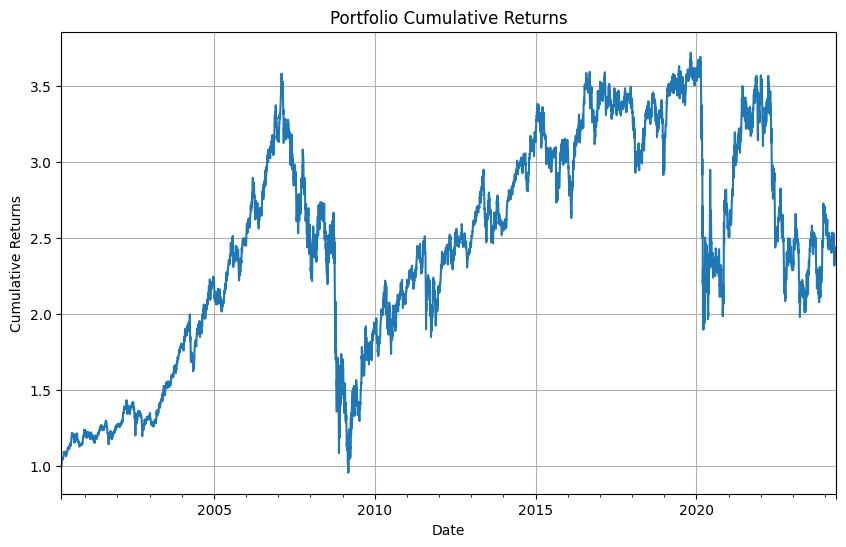

In [1109]:
# Calculate the cumulative returns of the portfolio
portfolio_cumulative_returns = (1 + portfolio_returns_df).cumprod()

# Plotting the cumulative returns
portfolio_cumulative_returns.plot(figsize=(10, 6), title='Portfolio Cumulative Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.grid(True)
plt.show()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


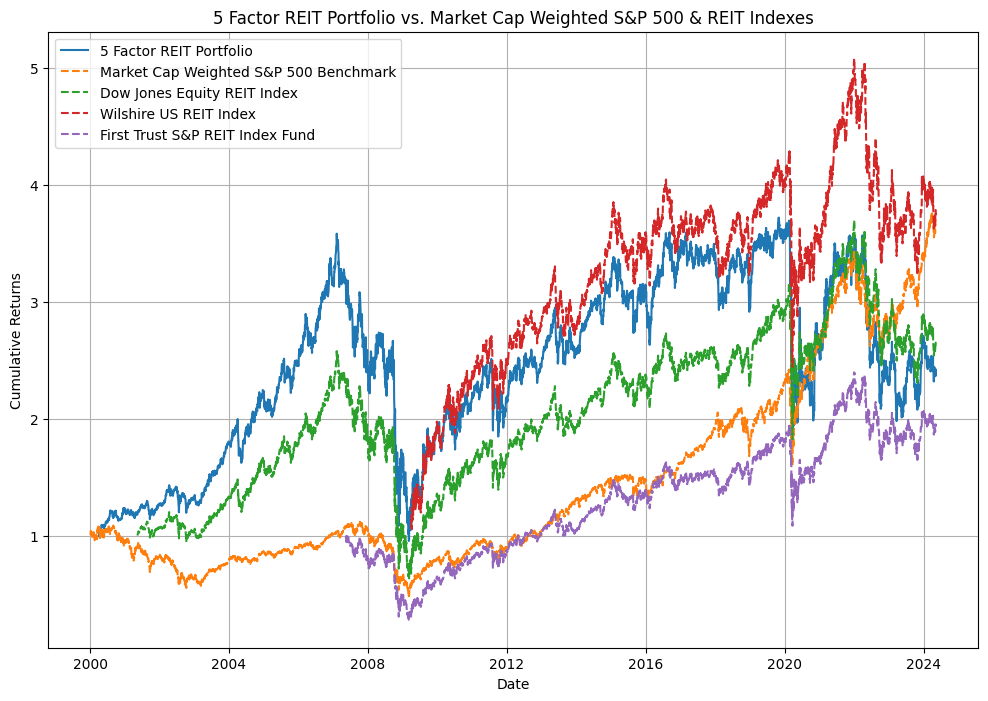

In [1110]:
DJR_prices = yf.download("^DJR", start=start_date, end=end_date)['Adj Close']
DJR_daily_returns = DJR_prices.pct_change()
DJR_cumulative_returns = (1 + DJR_daily_returns).cumprod()

Benchmark_prices = yf.download("^SPX", start=start_date, end=end_date)['Adj Close']
benchmark_daily_returns = Benchmark_prices.pct_change()
benchmark_cumulative_returns = (1 + benchmark_daily_returns).cumprod()

WILREIT_prices = yf.download("^WILREIT", start=start_date, end=end_date)['Adj Close']
WILREIT_daily_returns = WILREIT_prices.pct_change()
WILREIT_cumulative_returns = (1 + WILREIT_daily_returns).cumprod()

FNER_prices = yf.download("FRI", start=start_date, end=end_date)['Adj Close']
FNER_daily_returns = FNER_prices.pct_change()
FNER_cumulative_returns = (1 + FNER_daily_returns).cumprod()

# Plotting the cumulative returns for both your portfolio and the benchmark
plt.figure(figsize=(12, 8))
plt.plot(portfolio_cumulative_returns, label='5 Factor REIT Portfolio')
plt.plot(benchmark_cumulative_returns, label='Market Cap Weighted S&P 500 Benchmark', linestyle="--")
plt.plot(DJR_cumulative_returns, label='Dow Jones Equity REIT Index', linestyle="--")
plt.plot(WILREIT_cumulative_returns, label='Wilshire US REIT Index', linestyle="--")
plt.plot(FNER_cumulative_returns, label='First Trust S&P REIT Index Fund', linestyle="--")
plt.title('5 Factor REIT Portfolio vs. Market Cap Weighted S&P 500 & REIT Indexes')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()

In [1111]:
def calculate_performance_metrics(portfolio_returns, benchmark_returns):
    # Convert both series to numeric, coercing errors to NaN
    portfolio_returns = pd.to_numeric(portfolio_returns_df, errors='coerce')
    benchmark_returns = pd.to_numeric(benchmark_returns, errors='coerce')

    # Drop any NaN values
    portfolio_returns = portfolio_returns.dropna()
    benchmark_returns = benchmark_returns.dropna()

    # Ensure inputs are pandas Series and have numeric data
    if not isinstance(portfolio_returns, pd.Series) or not isinstance(benchmark_returns, pd.Series):
        raise ValueError("Both portfolio_returns and benchmark_returns must be pandas Series with numeric data.")

    # Annualizing factor for daily data
    annualizing_factor = 252

    # Total Return p.a.
    total_return_pa = ((1 + portfolio_returns).cumprod().iloc[-1]) ** (annualizing_factor / len(portfolio_returns)) - 1

    # Volatility p.a.
    volatility_pa = portfolio_returns.std() * np.sqrt(annualizing_factor)

    # Sharpe Ratio
    sharpe_ratio = total_return_pa / volatility_pa

    # Maximum Drawdown
    cumulative_returns = (1 + portfolio_returns).cumprod()
    peak = cumulative_returns.expanding(min_periods=1).max()
    drawdown = (cumulative_returns / peak) - 1
    max_drawdown = drawdown.min()

    # Beta to BM
    # covariance_matrix = np.cov(portfolio_returns, benchmark_returns, ddof=0)  # ddof=0 for population covariance
    # beta_to_bm = covariance_matrix[0, 1] / covariance_matrix[1, 1]

    # Alpha to BM
    portfolio_annual_return = total_return_pa
    benchmark_annual_return = ((1 + benchmark_returns).cumprod().iloc[-1]) ** (annualizing_factor / len(benchmark_returns)) - 1
    alpha_to_bm = portfolio_annual_return - (benchmark_annual_return)

    metrics = {
        'Total Return p.a.': total_return_pa,
        'Volatility p.a.': volatility_pa,
        'Sharpe Ratio': sharpe_ratio,
        'Maximum Drawdown': max_drawdown,
        # 'Beta to BM': beta_to_bm,
        'Alpha to BM': alpha_to_bm
    }

    return metrics

# Usage:
# Assuming portfolio_daily_returns and benchmark_daily_returns are your daily returns series
metrics = calculate_performance_metrics(portfolio_returns_df, benchmark_daily_returns)
print(metrics)

{'Total Return p.a.': 0.035979763132552245, 'Volatility p.a.': 0.29034637082068065, 'Sharpe Ratio': 0.12392014073003008, 'Maximum Drawdown': -0.7332534666768316, 'Alpha to BM': -0.019415416107961825}


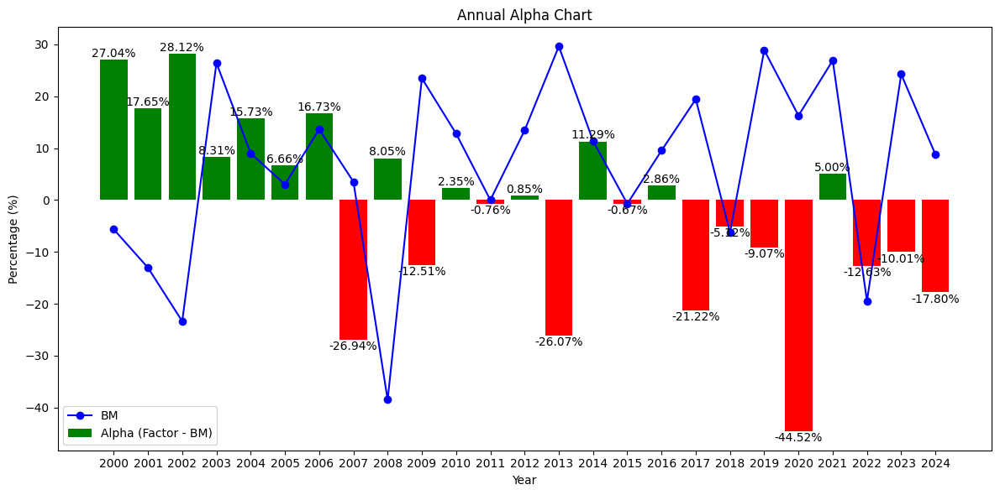

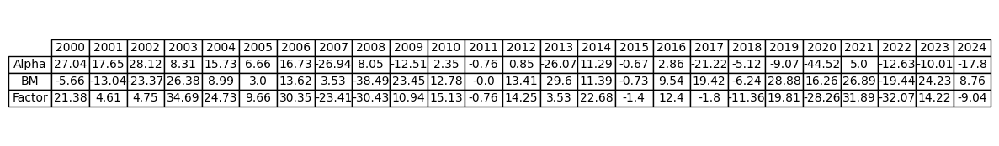

In [1112]:
# Annualize the daily returns to get Factor and BM
portfolio_annual_returns = portfolio_returns_df.resample('Y').apply(lambda x: (1 + x).prod() - 1)
benchmark_annual_returns = benchmark_daily_returns.resample('Y').apply(lambda x: (1 + x).prod() - 1)

# Compute the Alpha for each year
alpha_annual = portfolio_annual_returns - benchmark_annual_returns

# Convert the annual returns to percentage
portfolio_annual_returns *= 100
benchmark_annual_returns *= 100
alpha_annual *= 100

# Create a DataFrame for plotting
df_plot = pd.DataFrame({
    'Year': alpha_annual.index.year,
    'Alpha': alpha_annual.values,
    'BM': benchmark_annual_returns.values,
    'Factor': portfolio_annual_returns.values
})

# Create the bar chart
fig, ax = plt.subplots(figsize=(12, 6))

# Define colors based on the sign of alpha
colors = ['green' if alpha > 0 else 'red' for alpha in df_plot['Alpha']]

# Plot the bars with colors
bars = ax.bar(df_plot['Year'], df_plot['Alpha'], color=colors, label='Alpha (Factor - BM)')

# Adding labels on the bars
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2,
            height + (0.5 if height > 0 else -2),
            f"{height:.2f}%",
            ha='center', color='black')

# Adding a line for BM
ax.plot(df_plot['Year'], df_plot['BM'], color='blue', label='BM', marker='o')

# Set the x-ticks to be the years
ax.set_xticks(df_plot['Year'])

# Labeling
ax.set_xlabel('Year')
ax.set_ylabel('Percentage (%)')
ax.set_title('Annual Alpha Chart')
ax.legend()

plt.tight_layout()
plt.show()

# Assuming df_plot is your DataFrame containing the 'Year', 'Alpha', 'BM', and 'Factor' columns
# Round your data to two decimal places
df_plot_rounded = df_plot.round(2)

# Set the 'Year' as the index for display purposes
df_plot_rounded.set_index('Year', inplace=True)

# Now, plot the table using DataFrame.plot
fig, ax = plt.subplots(figsize=(12, 2))  # Adjust the size as needed
ax.axis('tight')
ax.axis('off')
table_data = df_plot_rounded[['Alpha', 'BM', 'Factor']].transpose()
the_table = ax.table(cellText=table_data.values,
                     colLabels=table_data.columns,
                     rowLabels=table_data.index,
                     cellLoc='center', rowLoc='center',
                     loc='center')

# Adjust the font size if necessary
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.2, 1.2)  # The scale factor to increase or decrease the size of the table cells.

plt.show()

# REIT index returns

In [1113]:
Industry_Indexes = {
    'Specialty': ['^YH10420080'],
    'Real Estate Services': ['^YH10410020'],
    'Industrial': ['^YH10420030'],
    'Residential': ['^YH10420050'],
    'Retail': ['^YH10420060'],
    'Healthcare': ['^YH10420010'],
    'Office': ['^YH10420040'],
    'Diversified': ['^YH10420090'],
    'Mortgage': ['^YH10420070'],
    'SP500': ['SPY'],

    }

def get_reit_data(tickers):
    return yf.download(tickers, start="2018-01-01", end="2024-01-01")['Adj Close']

reit_data = {asset_class: get_reit_data(tickers) for asset_class, tickers in Industry_Indexes.items()}

reit_data

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


{'Specialty': Date
 2018-01-10    247672.265625
 2018-01-11    245244.468750
 2018-01-12    243532.468750
 2018-01-16    246893.578125
 2018-01-17    247898.750000
 2018-01-18    246493.000000
 2018-01-19    249314.437500
 2018-01-22    251097.843750
 2018-01-23    254470.343750
 2018-01-24    254930.265625
 2018-01-25    255367.687500
 2018-01-26    257545.109375
 2018-01-29    253540.812500
 2018-01-30    253827.906250
 2018-01-31    259980.046875
 2018-02-01    257653.843750
 2018-02-02    253776.187500
 2018-02-05    248250.531250
 2018-02-06    246473.906250
 2018-02-07    245857.390625
 2018-02-08    236055.843750
 2018-02-09    239809.796875
 2018-02-12    242259.468750
 2018-02-13    243414.218750
 2018-02-14    243573.734375
 2018-02-15    243811.031250
 2018-02-16    245637.062500
 2018-02-20    243103.093750
 2018-02-21    240812.187500
 2018-02-22    243549.390625
 2018-02-23    247660.781250
 2018-02-26    249268.796875
 2018-02-27    244805.625000
 2018-02-28    244654.93

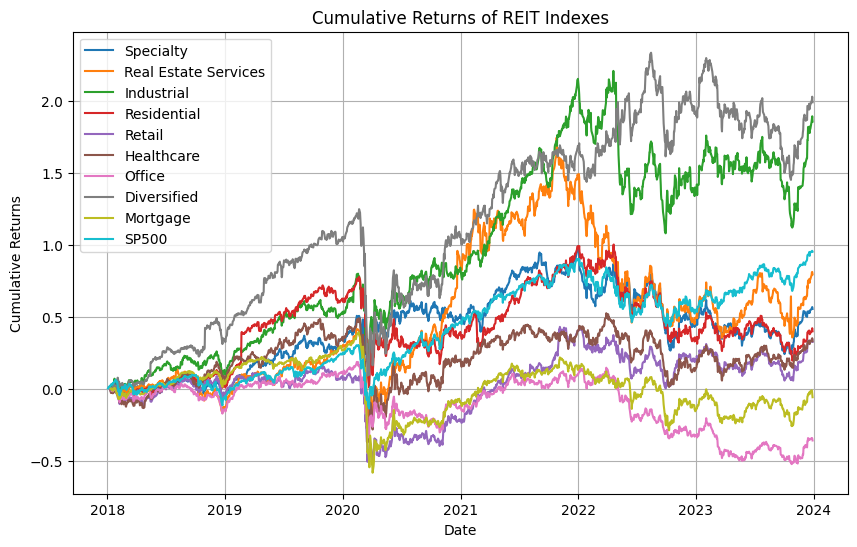

In [1114]:
# Plotting cumulative returns
plt.figure(figsize=(10, 6))
for asset_class, data in reit_data.items():
    cumulative_returns = (1 + data.pct_change()).cumprod() - 1
    plt.plot(cumulative_returns.index, cumulative_returns, label=asset_class)

plt.title('Cumulative Returns of REIT Indexes')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()